<div class="alert alert-block alert-success">
<h1>ASD Train, Test and Tune on Custom Dataset (with MNE)</h1>
</div>

## Refactored Experiment Configuration
Shared imports, constants, labels, frequency bands, and training defaults.


In [1]:
import copy
import itertools
import os
import os.path as op
import random
import re
from pathlib import Path
from typing import Any, Iterable, Optional, Sequence, Union

import mne
import numpy as np
import pandas as pd
import torch
from torch import nn
from torch.utils.data import Subset

from sklearn.metrics import accuracy_score, balanced_accuracy_score, f1_score, make_scorer, precision_score, recall_score
from sklearn.model_selection import StratifiedGroupKFold

from skorch.callbacks import Callback, Checkpoint, EpochScoring, LRScheduler, TrainEndCheckpoint
from skorch.helper import SliceDataset, predefined_split

from braindecode import EEGClassifier
from braindecode.datasets import BaseConcatDataset
from braindecode.datautil import load_concat_dataset
from braindecode.models import EEGNetv4, ShallowFBCSPNet
from braindecode.util import set_random_seeds

try:
    from data_anonymization import anonymize_data, anonymize_dataset, deanonymize_data
except ImportError:
    def anonymize_data(value: Any) -> Any:
        return value

    def deanonymize_data(value: Any) -> Any:
        return value

    def anonymize_dataset(dataset: Any) -> Any:
        return dataset

try:
    from torchinfo import summary
except ImportError:
    summary = None

PathLike = Union[str, Path]
DatasetLike = Any

try:
    _ipython_shell = get_ipython()
except NameError:
    _ipython_shell = None

in_colab = _ipython_shell is not None and "google.colab" in str(_ipython_shell)
print("Running in Colab" if in_colab else "Not running in Colab")

if "base_dir" not in globals():
    base_dir = "/content/gdrive/MyDrive/ASD" if in_colab else "./"
if "data_dir" not in globals():
    data_dir = op.join(base_dir, "data")
if "cuda" not in globals():
    cuda = torch.cuda.is_available()
if "device" not in globals():
    device = torch.device("cuda" if cuda else "cpu")
if "seed" not in globals():
    seed = 20200220

set_random_seeds(seed=seed, cuda=cuda)

FREQUENCY_BANDS: dict[str, tuple[float, float]] = {
    "delta": (0.5, 4.0),
    "theta": (4.0, 8.0),
    "alpha": (8.0, 13.0),
    "beta": (13.0, 30.0),
    "gamma": (30.0, 40.0),
}

LABEL_NAMES: dict[int, str] = {0: "normal", 1: "autism"}
DEFAULT_HOLDOUT_SUBJECTS: dict[str, list[int]] = {
    "Original": [1, 2, 37, 38],
    "Sheffield": [1, 2, 3, 4, 37, 38, 42, 45],
}
DEFAULT_MIXED_HOLDOUT_DATASET_INDICES: list[int] = [0, 3, 51, 21, 22, 64, 70, 54, 67, 55]

DEFAULT_TRAINING_OPTIONS: dict[str, Any] = {
    "lr": 0.005,
    "weight_decay": 1e-4,
    "batch_size": 16,
    "n_epochs": 20,
    "n_splits": 8,
    "random_state": 42,
    "prediction_samples_per_epoch": 10,
    "checkpoint_root": "./checkpoints/refactored",
    "store_estimators": False,
    "selection_metric": "balanced_accuracy",
}

print(f"Torch Version: {torch.__version__}")
print("GPU is", "AVAILABLE" if cuda else "NOT AVAILABLE")
print(f"Using device: {device}")


Not running in Colab
Torch Version: 2.11.0+cu130
GPU is NOT AVAILABLE
Using device: cpu


C:\Users\Anna\AppData\Roaming\Python\Python313\site-packages\torch\cuda\__init__.py:180: UserWarning: cudaGetDeviceCount() returned cudaErrorNotSupported, likely using older driver or on CPU machine (Triggered internally at C:\actions-runner\_work\pytorch\pytorch\pytorch\c10\cuda\CUDAFunctions.cpp:88.)
  return torch._C._cuda_getDeviceCount() > 0


## Dataset Loading And Quality Metrics
Load saved Braindecode datasets, construct Mixed datasets, and compute SNR/MSE diagnostics.


In [2]:
DATASET_CACHE: dict[tuple[str, bool], BaseConcatDataset] = {}


def normalize_dataset_name(dataset_name: str) -> str:
    """Return a canonical dataset origin name."""
    aliases = {
        "original": "Original",
        "old": "Original",
        "sheffield": "Sheffield",
        "mixed": "Mixed",
    }
    key = str(dataset_name).strip().lower()
    if key not in aliases:
        raise ValueError(f"Unsupported dataset '{dataset_name}'. Use Original, Sheffield, or Mixed.")
    return aliases[key]


def normalize_filter_type(filter_type):
    """Normalize filter / preprocessing type names."""
    if filter_type is None:
        return "None"

    key = str(filter_type).strip().lower()
    key = key.replace("-", "_").replace(" ", "_")

    aliases = {
        "none": "None",
        "original": "None",
        "raw": "None",
        "unfiltered": "None",

        "butterworth": "Butterworth",
        "butter": "Butterworth",
        "bandpass": "Butterworth",
        "band_pass": "Butterworth",

        "ica": "ICA",
        "independent_component_analysis": "ICA",

        "dwt": "DWT",
        "wavelet": "DWT",

        "nointerpolation": "NoInterpolation",
        "no_interpolation": "NoInterpolation",
        "no__interpolation": "NoInterpolation",
        "without_interpolation": "NoInterpolation",
        "nointerp": "NoInterpolation",
        "no_interp": "NoInterpolation",

        "dwt_combined": "DWT_COMBINED",
        "combined_dwt": "DWT_COMBINED",
        "combined_bands": "DWT_COMBINED",
        "dwt_combined_bands": "DWT_COMBINED",
    }

    if key not in aliases:
        raise ValueError(
            f"Unsupported filter_type={filter_type!r}. "
            "Use None, Butterworth, ICA, DWT, NoInterpolation, or DWT_COMBINED."
        )

    return aliases[key]


def resolve_dataset_path(file_path: PathLike) -> Path:
    """Resolve a dataset path against the notebook, base_dir, and data_dir."""
    path = Path(file_path)
    candidates = [path]

    if not path.is_absolute():
        candidates.extend([
            Path(base_dir) / path,
            Path(data_dir) / path,
            Path.cwd() / path,
        ])

    seen: set[str] = set()
    unique_candidates = []
    for candidate in candidates:
        key = str(candidate)
        if key not in seen:
            seen.add(key)
            unique_candidates.append(candidate)

    for candidate in unique_candidates:
        if candidate.exists():
            return candidate

    print("Dataset path was not found locally. Tried:")
    for candidate in unique_candidates:
        print(f"  - {candidate}")
    return path


def get_dataset_path(origin: str, filter_type: Optional[str], band: Optional[str] = None) -> str:
    """Return the saved dataset folder for an origin/filter/band combination."""
    origin = normalize_dataset_name(origin)
    filter_name = normalize_filter_type(filter_type)
    band_name = band.lower() if isinstance(band, str) else None

    if filter_name == "DWT":
        if band_name is None:
            raise ValueError("DWT experiments require filter_options['band'].")
        if band_name not in FREQUENCY_BANDS:
            raise ValueError(f"Unsupported DWT band '{band}'. Use one of {sorted(FREQUENCY_BANDS)}.")
        if origin == "Original":
            return f"windows_dataset_{band_name}_dwt"
        if origin == "Sheffield":
            return f"windows_dataset_{band_name}_dwt_sheffield"

    if filter_name == "DWT_COMBINED":
        if origin == "Original":
            return "windows_dataset_dwt_combined"
        if origin == "Sheffield":
            return "windows_dataset_dwt_combined_sheffield"
        # Mixed DWT-combined datasets are constructed on the fly from
        # Original and Sheffield inside load_experiment_dataset.
        raise ValueError("Mixed DWT_COMBINED should be constructed before path lookup.")

    path_map: dict[tuple[str, str], str] = {
        ("Original", "None"): "windows_dataset_150",
        ("Sheffield", "None"): "windows_dataset_150_sheffield",
        ("Original", "NoInterpolation"): "windows_dataset_150_no_interpolation",
        ("Sheffield", "NoInterpolation"): "windows_dataset_150_sheffield_no_interpolation",
        ("Original", "Butterworth"): "windows_dataset_butterworth",
        ("Sheffield", "Butterworth"): "windows_dataset_butterworth_sheffield",
        ("Original", "ICA"): "windows_dataset_original_ica",
        ("Sheffield", "ICA"): "windows_dataset_sheffield_ica",
    }
    try:
        return path_map[(origin, filter_name)]
    except KeyError as exc:
        raise ValueError(f"No saved dataset path configured for {origin=} and {filter_name=}.") from exc


def load_dataset(file_path: PathLike, preload: bool = False, use_cache: bool = True) -> BaseConcatDataset:
    """Load a saved Braindecode dataset from a file path."""
    resolved_path = resolve_dataset_path(file_path)
    cache_key = (str(resolved_path), bool(preload))

    if use_cache and cache_key in DATASET_CACHE:
        print(f"Using cached dataset: {resolved_path}")
        return DATASET_CACHE[cache_key]

    print(f"Loading dataset from: {resolved_path}")
    dataset = load_concat_dataset(
        path=str(resolved_path),
        preload=preload,
        ids_to_load=None,
        target_name=None,
        n_jobs=1,
    )
    dataset = anonymize_dataset(dataset)

    if use_cache:
        DATASET_CACHE[cache_key] = dataset

    print(f"Loaded {len(dataset.datasets)} base datasets and {len(dataset)} windows.")
    return dataset


def dataset_idx_from_sample_idx(dataset: BaseConcatDataset, idx: int) -> int:
    """Map a sample index to its base dataset index."""
    return int(np.searchsorted(dataset.cumulative_sizes, idx, side="right"))


def dataset_desc_from_sample_idx(dataset: BaseConcatDataset, idx: int, key: str = "subject") -> Any:
    """Fetch a description value for the base dataset that owns a sample."""
    ds_idx = dataset_idx_from_sample_idx(dataset, idx)
    return dataset.description.iloc[ds_idx][key]


def dataset_idx_range_from_ds_idx(dataset: BaseConcatDataset, ds_idx: int) -> range:
    """Return the sample-index range owned by one base dataset."""
    start_idx = dataset.cumulative_sizes[ds_idx - 1] if ds_idx > 0 else 0
    stop_idx = dataset.cumulative_sizes[ds_idx]
    return range(start_idx, stop_idx)


def dataset_idxs_from_subject(dataset: BaseConcatDataset, subject_id: Union[Any, Sequence[Any]]) -> list[int]:
    """Return all sample indexes that belong to one or more subject IDs."""
    grouped = dataset.description.groupby("subject").groups

    if isinstance(subject_id, Iterable) and not isinstance(subject_id, (str, bytes)):
        subject_ids = list(subject_id)
    else:
        subject_ids = [subject_id]

    missing = [subj for subj in subject_ids if subj not in grouped]
    if missing:
        raise ValueError(f"Subjects not found in dataset: {missing}. Available: {sorted(grouped.keys())}")

    ds_indices = [int(ds_idx) for subj in subject_ids for ds_idx in grouped[subj]]
    sample_indices = [idx for ds_idx in ds_indices for idx in dataset_idx_range_from_ds_idx(dataset, ds_idx)]
    return sample_indices


def describe_dataset(dataset: BaseConcatDataset, name: str = "dataset", show_description_table: bool = False) -> None:
    """Print useful dataset structure, label, subject, and channel statistics."""
    print(f"\n===== {name} dataset summary =====")
    print(type(dataset))
    print(f"n_base_datasets = {len(dataset.datasets)}")
    print(f"n_windows = {len(dataset)}")

    if hasattr(dataset, "description"):
        if show_description_table:
            display(dataset.description.head())
        if "label" in dataset.description.columns:
            print("label counts by base dataset:")
            print(dataset.description["label"].value_counts())

        if "subject" in dataset.description.columns:
            samples_seen: set[int] = set()
            print("samples per subject:")
            for subject_id, group in dataset.description.groupby("subject"):
                sample_count = sum(len(dataset.datasets[int(i)]) for i in group.index.tolist())
                duplicate_note = " -- DUPLICATED?" if sample_count in samples_seen else ""
                samples_seen.add(sample_count)
                labels = group.loc[:, "label"].tolist() if "label" in group.columns else []
                files = group.loc[:, "file"].tolist() if "file" in group.columns else []
                print(
                    f"subject={subject_id}: labels={labels} files={files} "
                    f"ds_idxs={group.index.tolist()} samples={sample_count}{duplicate_note}"
                )

    channel_counts = [len(ds.windows.info["ch_names"]) for ds in dataset.datasets]
    print(f"unique channel counts: {sorted(set(channel_counts))}")
    if dataset.datasets:
        print(f"first channel names: {dataset.datasets[0].windows.info['ch_names']}")


def make_mixed_dataset(
    original_dataset: BaseConcatDataset,
    sheffield_dataset: BaseConcatDataset,
    expected_n_channels: Optional[int] = None,
) -> BaseConcatDataset:
    """Concatenate Original and Sheffield datasets after optional channel-count filtering."""
    def select_by_channel_count(dataset: BaseConcatDataset) -> list[Any]:
        if expected_n_channels is None:
            return list(dataset.datasets)
        return [
            ds for ds in dataset.datasets
            if len(ds.windows.info["ch_names"]) == expected_n_channels
        ]

    original_parts = select_by_channel_count(original_dataset)
    sheffield_parts = select_by_channel_count(sheffield_dataset)

    print(f"original base datasets kept: {len(original_parts)} / {len(original_dataset.datasets)}")
    print(f"sheffield base datasets kept: {len(sheffield_parts)} / {len(sheffield_dataset.datasets)}")

    if original_parts and sheffield_parts:
        original_ch_names = original_parts[0].windows.info["ch_names"]
        sheffield_ch_names = sheffield_parts[0].windows.info["ch_names"]
        print("original channels:", len(original_ch_names), original_ch_names)
        print("sheffield channels:", len(sheffield_ch_names), sheffield_ch_names)
        print("same channel order:", original_ch_names == sheffield_ch_names)
        print("same channel set:", set(original_ch_names) == set(sheffield_ch_names))

    mixed_dataset = BaseConcatDataset(original_parts + sheffield_parts)
    print("mixed n_base_datasets:", len(mixed_dataset.datasets))
    return mixed_dataset


def load_experiment_dataset(
    dataset_name: str,
    filter_type: Optional[str],
    filter_options: dict[str, Any],
) -> BaseConcatDataset:
    """Load the dataset for one experiment, constructing Mixed from the two origins."""
    origin = normalize_dataset_name(dataset_name)
    filter_name = normalize_filter_type(filter_type)
    band = filter_options.get("band") or filter_options.get("frequency_band")
    preload = bool(filter_options.get("preload", False))
    use_cache = bool(filter_options.get("use_cache", True))

    if origin == "Mixed":
        original_dataset = load_experiment_dataset("Original", filter_name, filter_options)
        sheffield_dataset = load_experiment_dataset("Sheffield", filter_name, filter_options)
        return make_mixed_dataset(
            original_dataset=original_dataset,
            sheffield_dataset=sheffield_dataset,
            expected_n_channels=filter_options.get("expected_n_channels"),
        )

    dataset_path = get_dataset_path(origin, filter_name, band=band)
    return load_dataset(dataset_path, preload=preload, use_cache=use_cache)


def create_train_test_split(
    dataset: BaseConcatDataset,
    test_subjects: Optional[Sequence[Any]] = None,
    test_dataset_indices: Optional[Sequence[int]] = None,
    shuffle: bool = True,
    random_state: int = 42,
) -> tuple[Subset, Optional[Subset], list[Any]]:
    """Create a subject- or recording-level test split before K-fold CV."""
    rng = random.Random(random_state)

    if test_dataset_indices is not None:
        test_indices = [
            idx
            for ds_idx in test_dataset_indices
            for idx in dataset_idx_range_from_ds_idx(dataset, int(ds_idx))
        ]
        test_labels = list(test_dataset_indices)
        split_name = "dataset row indexes"
    elif test_subjects is not None:
        test_indices = dataset_idxs_from_subject(dataset, test_subjects)
        test_labels = list(test_subjects)
        split_name = "subjects"
    else:
        test_indices = []
        test_labels = []
        split_name = "none"

    if shuffle:
        rng.shuffle(test_indices)

    test_index_set = set(test_indices)
    train_indices = [idx for idx in range(len(dataset)) if idx not in test_index_set]
    if shuffle:
        rng.shuffle(train_indices)

    train_set = Subset(dataset, train_indices)
    test_set = Subset(dataset, test_indices) if test_indices else None

    print(f"Test split by {split_name}: {test_labels}")
    print(f"len(train_pool) = {len(train_set)}")
    print(f"len(test_set) = {len(test_set) if test_set is not None else 0}")
    print(f"len(dataset) = {len(dataset)}")

    return train_set, test_set, test_labels

def get_available_subjects(dataset) -> list[int]:
    """Return sorted subject IDs that actually exist in the loaded dataset."""
    subjects = []

    for _, row in dataset.description.iterrows():
        if "subject" in row and pd.notna(row["subject"]):
            subjects.append(int(row["subject"]))

    return sorted(set(subjects))


def get_subject_to_label(dataset) -> dict[int, str]:
    """
    Return mapping:
        subject_id -> label

    Expected label column:
        'label' with values like 'autism' / 'norm'

    Fallback:
        event_code 1 -> autism
        event_code 0 -> norm
    """
    subject_to_label = {}

    for _, row in dataset.description.iterrows():
        if "subject" not in row or pd.isna(row["subject"]):
            continue

        subject = int(row["subject"])

        if "label" in row and pd.notna(row["label"]):
            label = str(row["label"]).lower()
        elif "event_code" in row and pd.notna(row["event_code"]):
            label = "autism" if int(row["event_code"]) == 1 else "norm"
        else:
            label = "unknown"

        subject_to_label[subject] = label

    return subject_to_label


def choose_existing_test_subjects_same_class(
    dataset,
    preferred_subjects,
    preferred_subject_to_label,
) -> list[int]:
    """
    Choose test subjects that exist in the dataset.

    If a preferred subject was removed during preprocessing,
    replace it with another available subject from the same class.
    """
    available_subjects = get_available_subjects(dataset)
    subject_to_label = get_subject_to_label(dataset)

    chosen = []
    used = set()

    for preferred_subject in preferred_subjects:
        preferred_subject = int(preferred_subject)
        target_label = preferred_subject_to_label.get(preferred_subject)

        # Keep preferred subject if it exists
        if preferred_subject in available_subjects:
            chosen.append(preferred_subject)
            used.add(preferred_subject)
            continue

        # Otherwise replace with available subject from the same class
        replacement = None

        for candidate in available_subjects:
            if candidate in used:
                continue

            candidate_label = subject_to_label.get(candidate)

            if candidate_label == target_label:
                replacement = candidate
                break

        if replacement is None:
            raise ValueError(
                f"Could not replace missing subject {preferred_subject} "
                f"with class '{target_label}'. Available subjects by label: "
                f"{subject_to_label}"
            )

        print(
            f"Replacing missing subject {preferred_subject} "
            f"({target_label}) with subject {replacement} ({target_label})"
        )

        chosen.append(replacement)
        used.add(replacement)

    print("Available subjects:", available_subjects)
    print("Chosen test subjects:", chosen)

    return chosen


def calculate_signal_snr(
    dataset: DatasetLike,
    reference_dataset: Optional[DatasetLike] = None,
    max_samples: Optional[int] = None,
    eps: float = 1e-12,
) -> dict[str, float]:
    """Compute mean SNR in dB for signal windows, using a reference or first-difference noise proxy."""
    if reference_dataset is None:
        n_samples = len(dataset) if max_samples is None else min(len(dataset), int(max_samples))
    else:
        n_samples = min(len(dataset), len(reference_dataset))
        if max_samples is not None:
            n_samples = min(n_samples, int(max_samples))

    snr_values = []
    for idx in range(n_samples):
        signal = np.asarray(dataset[idx][0], dtype=np.float64)
        if reference_dataset is None:
            noise = np.diff(signal, axis=-1)
            signal_for_power = signal[..., 1:]
        else:
            reference = np.asarray(reference_dataset[idx][0], dtype=np.float64)
            if signal.shape != reference.shape:
                continue
            noise = reference - signal
            signal_for_power = signal

        signal_power = float(np.mean(np.square(signal_for_power)))
        noise_power = float(np.mean(np.square(noise)))
        snr_values.append(10.0 * np.log10((signal_power + eps) / (noise_power + eps)))

    if not snr_values:
        result = {"mean_snr_db": float("nan"), "std_snr_db": float("nan"), "n_samples": 0.0}
    else:
        values = np.asarray(snr_values, dtype=np.float64)
        result = {
            "mean_snr_db": float(values.mean()),
            "std_snr_db": float(values.std()),
            "min_snr_db": float(values.min()),
            "max_snr_db": float(values.max()),
            "n_samples": float(len(values)),
        }

    print("SNR summary:", result)
    return result


def compare_filtered_data(
    before_dataset: DatasetLike,
    after_dataset: DatasetLike,
    max_samples: Optional[int] = None,
) -> dict[str, float]:
    """Compare pre- and post-filtering signal windows using Mean Squared Error."""
    n_samples = min(len(before_dataset), len(after_dataset))
    if max_samples is not None:
        n_samples = min(n_samples, int(max_samples))

    mse_values = []
    skipped = 0
    for idx in range(n_samples):
        before = np.asarray(before_dataset[idx][0], dtype=np.float64)
        after = np.asarray(after_dataset[idx][0], dtype=np.float64)
        if before.shape != after.shape:
            skipped += 1
            continue
        mse_values.append(float(np.mean(np.square(before - after))))

    if not mse_values:
        result = {"mean_mse": float("nan"), "std_mse": float("nan"), "n_samples": 0.0, "skipped": float(skipped)}
    else:
        values = np.asarray(mse_values, dtype=np.float64)
        result = {
            "mean_mse": float(values.mean()),
            "std_mse": float(values.std()),
            "min_mse": float(values.min()),
            "max_mse": float(values.max()),
            "n_samples": float(len(values)),
            "skipped": float(skipped),
        }

    print("MSE before/after filtering:", result)
    return result


## Model And Training Helpers
Reusable model initialization and one-fold training helpers.


In [3]:
class PrintClassCounts(Callback):
    """Print class counts for train, validation, and test datasets at each epoch."""

    def __init__(
        self,
        train_ds: DatasetLike,
        val_ds: Optional[DatasetLike] = None,
        test_ds: Optional[DatasetLike] = None,
        label_names: Optional[dict[int, str]] = None,
        prefix: str = "",
    ) -> None:
        self.train_ds = train_ds
        self.val_ds = val_ds
        self.test_ds = test_ds
        self.label_names = label_names or LABEL_NAMES
        self.prefix = prefix

    def _get_counts(self, ds: Optional[DatasetLike]) -> Optional[dict[int, int]]:
        if ds is None:
            return None
        y = np.asarray(list(SliceDataset(ds, idx=1)), dtype=int)
        unique, counts = np.unique(y, return_counts=True)
        return {int(k): int(v) for k, v in zip(unique, counts)}

    def _format_counts(self, ds: Optional[DatasetLike], name: str) -> str:
        count_map = self._get_counts(ds)
        if count_map is None:
            return f"{name}: not provided"
        total = sum(count_map.values())
        parts = [f"{self.label_names[k]}={count_map.get(k, 0)}" for k in sorted(self.label_names)]
        return f"{name}: total={total}, " + ", ".join(parts)

    def on_epoch_begin(self, net, dataset_train=None, dataset_valid=None, **kwargs):
        epoch_num = len(net.history) + 1
        print(f"\n{self.prefix}Epoch {epoch_num}", flush=True)
        print(self._format_counts(self.train_ds, "train"), flush=True)

        if dataset_valid is not None:
            print(self._format_counts(dataset_valid, "fold_valid"), flush=True)
        elif self.val_ds is not None:
            print(self._format_counts(self.val_ds, "valid"), flush=True)

        if self.test_ds is not None:
            print(self._format_counts(self.test_ds, "test"), flush=True)


class PrintPredictionsEachEpoch(Callback):
    """Print a small fixed prediction sample at each epoch end."""

    def __init__(
        self,
        ds: Optional[DatasetLike] = None,
        ds_name: str = "valid",
        n_samples: int = 10,
        label_names: Optional[dict[int, str]] = None,
        prefix: str = "",
    ) -> None:
        self.ds = ds
        self.ds_name = ds_name
        self.n_samples = n_samples
        self.label_names = label_names or LABEL_NAMES
        self.prefix = prefix

    def on_epoch_end(self, net, dataset_train=None, dataset_valid=None, **kwargs):
        ds = dataset_valid if dataset_valid is not None else self.ds
        if ds is None:
            print(f"{self.prefix}{self.ds_name}: no dataset for prediction printing", flush=True)
            return

        n_samples = min(self.n_samples, len(ds))
        if n_samples == 0:
            print(f"{self.prefix}{self.ds_name}: empty dataset", flush=True)
            return

        items = [ds[i] for i in range(n_samples)]
        X_batch = np.stack([np.asarray(item[0]) for item in items], axis=0)
        y_true = np.asarray([item[1] for item in items], dtype=int)
        y_pred = net.predict(X_batch)

        print(f"{self.prefix}{self.ds_name} predictions:", flush=True)
        for i, (yt, yp) in enumerate(zip(y_true, y_pred)):
            true_name = self.label_names.get(int(yt), str(int(yt)))
            pred_name = self.label_names.get(int(yp), str(int(yp)))
            print(f"  sample {i}: true={true_name}, predicted={pred_name}", flush=True)


def glorot_weight_zero_bias(model: nn.Module) -> None:
    """Initialize model weights with Xavier/Glorot and set biases to zero."""
    for module in model.modules():
        if hasattr(module, "weight"):
            if "BatchNorm" not in module.__class__.__name__:
                nn.init.xavier_uniform_(module.weight, gain=1)
            else:
                nn.init.constant_(module.weight, 1)
        if hasattr(module, "bias") and module.bias is not None:
            nn.init.constant_(module.bias, 0)


def initialize_model(architecture: str, hyperparams: dict[str, Any]) -> nn.Module:
    """Initialize a machine learning model for the requested architecture."""
    params = dict(hyperparams)
    n_channels = int(params.pop("n_channels"))
    n_classes = int(params.pop("n_classes", 2))
    input_window_samples = int(params.pop("input_window_samples"))
    use_glorot = bool(params.pop("glorot_init", False))

    architecture_key = architecture.strip().lower()
    if architecture_key in {"eegnet", "eegnetv4"}:
        try:
            model = EEGNetv4(
                in_chans=n_channels,
                n_classes=n_classes,
                input_window_samples=input_window_samples,
                **params,
            )
        except TypeError:
            model = EEGNetv4(
                n_chans=n_channels,
                n_outputs=n_classes,
                n_times=input_window_samples,
                **params,
            )
    elif architecture_key in {"shallow", "shallowfbcspnet"}:
        final_conv_length = params.pop("final_conv_length", "auto")
        try:
            model = ShallowFBCSPNet(
                n_channels,
                n_classes,
                input_window_samples=input_window_samples,
                final_conv_length=final_conv_length,
                **params,
            )
        except TypeError:
            model = ShallowFBCSPNet(
                n_chans=n_channels,
                n_outputs=n_classes,
                n_times=input_window_samples,
                final_conv_length=final_conv_length,
                **params,
            )
    else:
        raise ValueError("Unsupported architecture. Use EEGNetv4 or ShallowFBCSPNet.")

    if use_glorot:
        glorot_weight_zero_bias(model)

    return model


def train_model(
    model: nn.Module,
    train_subset: DatasetLike,
    valid_subset: DatasetLike,
    hyperparams: dict[str, Any],
    checkpoint_dir: PathLike,
    test_subset: Optional[DatasetLike] = None,
    prefix: str = "",
) -> EEGClassifier:
    """Train one fold of a Braindecode EEGClassifier with verbose callbacks."""
    y_train = np.asarray(list(SliceDataset(train_subset, idx=1)), dtype=int)

    lr = float(hyperparams.get("lr", DEFAULT_TRAINING_OPTIONS["lr"]))
    weight_decay = float(hyperparams.get("weight_decay", DEFAULT_TRAINING_OPTIONS["weight_decay"]))
    batch_size = int(hyperparams.get("batch_size", DEFAULT_TRAINING_OPTIONS["batch_size"]))
    n_epochs = int(hyperparams.get("n_epochs", DEFAULT_TRAINING_OPTIONS["n_epochs"]))
    prediction_samples = int(hyperparams.get("prediction_samples_per_epoch", 10))

    fold_checkpoint_dir = Path(checkpoint_dir)
    fold_checkpoint_dir.mkdir(parents=True, exist_ok=True)

    cp = Checkpoint(dirname=str(fold_checkpoint_dir), monitor="valid_loss_best")
    train_end_cp = TrainEndCheckpoint(dirname=str(fold_checkpoint_dir))
    class_count_cb = PrintClassCounts(
        train_ds=train_subset,
        val_ds=valid_subset,
        test_ds=test_subset,
        label_names=LABEL_NAMES,
        prefix=prefix,
    )
    pred_cb = PrintPredictionsEachEpoch(
        ds=valid_subset,
        ds_name="fold_valid",
        n_samples=prediction_samples,
        label_names=LABEL_NAMES,
        prefix=prefix,
    )

    clf = EEGClassifier(
        model,
        criterion=torch.nn.NLLLoss,
        optimizer=torch.optim.AdamW,
        train_split=predefined_split(valid_subset),
        optimizer__lr=lr,
        optimizer__weight_decay=weight_decay,
        batch_size=batch_size,
        callbacks=[
            "accuracy",
            "f1_micro",
            ("valid_f1", EpochScoring(make_scorer(f1_score, zero_division=0), name="valid_f1", lower_is_better=False)),
            ("valid_balanced_accuracy", EpochScoring(make_scorer(balanced_accuracy_score), name="valid_balanced_accuracy", lower_is_better=False)),
            ("valid_precision", EpochScoring(make_scorer(precision_score, zero_division=0), name="valid_precision", lower_is_better=False)),
            ("valid_recall", EpochScoring(make_scorer(recall_score, zero_division=0), name="valid_recall", lower_is_better=False)),
            ("print_class_counts", class_count_cb),
            ("print_predictions", pred_cb),
            ("lr_scheduler", LRScheduler("CosineAnnealingLR", T_max=max(n_epochs - 1, 1))),
            ("cp", cp),
            ("train_end_cp", train_end_cp),
        ],
        device=device,
    )

    with mne.use_log_level(False):
        clf.fit(train_subset, y=y_train, epochs=n_epochs)

    return clf


## K-Fold Evaluation
Grouped K-fold CV with accuracy, F1-score, precision, and recall summaries.


In [4]:
def get_label_from_subset_item(subset: DatasetLike, local_idx: int) -> int:
    """Return an integer label from a dataset or subset item."""
    return int(subset[local_idx][1])


def get_group_from_subset_item(subset: Subset, local_idx: int, group_key: str = "subject") -> Any:
    """Return a CV group label for a subset item."""
    base_idx = int(subset.indices[local_idx])
    parent_dataset = subset.dataset

    if group_key == "dataset_index":
        return dataset_idx_from_sample_idx(parent_dataset, base_idx)
    return dataset_desc_from_sample_idx(parent_dataset, base_idx, key=group_key)



class PrecomputedGroupKFold:
    """Small splitter wrapper around validated, precomputed group folds."""

    def __init__(self, splits: list[tuple[np.ndarray, np.ndarray]]) -> None:
        self.splits = splits
        self.n_splits = len(splits)

    def split(self, X=None, y=None, groups=None):
        """Yield already-validated train/validation indexes."""
        for train_idx, valid_idx in self.splits:
            yield train_idx.copy(), valid_idx.copy()

    def get_n_splits(self, X=None, y=None, groups=None) -> int:
        """Return the number of precomputed folds."""
        return self.n_splits


def count_groups_per_label(y: np.ndarray, groups: np.ndarray) -> dict[int, int]:
    """Count how many unique groups contain each class label."""
    return {
        int(label): int(len(np.unique(groups[y == label])))
        for label in sorted(np.unique(y))
    }


def fold_label_counts(y: np.ndarray, valid_idx: np.ndarray) -> dict[int, int]:
    """Count labels in one validation fold."""
    labels, counts = np.unique(y[valid_idx], return_counts=True)
    return {int(label): int(count) for label, count in zip(labels, counts)}


def invalid_validation_folds(
    splits: list[tuple[np.ndarray, np.ndarray]],
    y: np.ndarray,
    required_labels: set[int],
) -> list[tuple[int, dict[int, int]]]:
    """Return folds whose validation set does not contain every class."""
    invalid = []
    for fold_i, (_, valid_idx) in enumerate(splits):
        counts = fold_label_counts(y, valid_idx)
        if not required_labels.issubset(set(counts)):
            invalid.append((fold_i, counts))
    return invalid


def make_validated_stratified_group_splits(
    y: np.ndarray,
    groups: np.ndarray,
    n_splits: int,
    random_state: int,
    max_attempts: int = 50,
) -> tuple[list[tuple[np.ndarray, np.ndarray]], int, int]:
    """Create StratifiedGroupKFold splits with both classes present in every validation fold."""
    required_labels = {int(label) for label in np.unique(y)}
    if len(required_labels) < 2:
        raise ValueError("Training data contains fewer than two classes; classification CV is not meaningful.")

    unique_groups = np.unique(groups)
    groups_per_label = count_groups_per_label(y, groups)
    max_safe_splits = min(int(n_splits), len(unique_groups), min(groups_per_label.values()))

    if max_safe_splits < 2:
        raise ValueError(
            "Cannot create non-degenerate grouped CV folds. "
            f"Groups per label: {groups_per_label}. Need at least 2 groups for every class."
        )

    if max_safe_splits != n_splits:
        print(
            f"Reducing n_splits from {n_splits} to {max_safe_splits}. "
            f"Each validation fold needs all classes; groups per label = {groups_per_label}."
        )

    last_invalid: list[tuple[int, dict[int, int]]] = []
    for candidate_splits in range(max_safe_splits, 1, -1):
        for attempt in range(max_attempts):
            candidate_seed = random_state + attempt
            splitter = StratifiedGroupKFold(
                n_splits=candidate_splits,
                shuffle=True,
                random_state=candidate_seed,
            )
            splits = [
                (np.asarray(train_idx), np.asarray(valid_idx))
                for train_idx, valid_idx in splitter.split(
                    X=np.arange(len(y)),
                    y=y,
                    groups=groups,
                )
            ]
            last_invalid = invalid_validation_folds(splits, y, required_labels)
            if not last_invalid:
                if candidate_splits != max_safe_splits:
                    print(f"Reducing n_splits further to {candidate_splits} to avoid single-class validation folds.")
                if attempt > 0:
                    print(f"Using StratifiedGroupKFold random_state={candidate_seed} to avoid single-class validation folds.")
                print("Validation fold label counts:")
                for fold_i, (_, valid_idx) in enumerate(splits):
                    print(f"  fold #{fold_i}: {fold_label_counts(y, valid_idx)}")
                return splits, candidate_splits, candidate_seed

    raise ValueError(
        "Could not create grouped CV splits with every class in every validation fold. "
        f"Last invalid folds: {last_invalid}. Try fewer folds or adjust the subject-level test split."
    )


def define_stratified_group_cv(
    train_set: Subset,
    n_splits: int = 5,
    group_key: str = "subject",
    random_state: int = 42,
) -> tuple[PrecomputedGroupKFold, np.ndarray, np.ndarray]:
    """Build validated StratifiedGroupKFold splits and return labels/groups for train_set."""
    groups_train = np.asarray([
        get_group_from_subset_item(train_set, i, group_key=group_key)
        for i in range(len(train_set))
    ])
    y_train = np.asarray([get_label_from_subset_item(train_set, i) for i in range(len(train_set))], dtype=int)

    unique_groups = np.unique(groups_train)
    if len(unique_groups) < 2:
        raise ValueError("At least two subject/recording groups are required for K-fold CV.")

    print("unique groups in train_set:", unique_groups)
    print("n_unique_groups:", len(unique_groups))
    print("groups per label:", count_groups_per_label(y_train, groups_train))

    splits, actual_n_splits, used_random_state = make_validated_stratified_group_splits(
        y=y_train,
        groups=groups_train,
        n_splits=n_splits,
        random_state=random_state,
    )
    print(f"validated_n_splits = {actual_n_splits}")
    print(f"cv_random_state = {used_random_state}")

    return PrecomputedGroupKFold(splits), y_train, groups_train

def calculate_classification_metrics(y_true: Sequence[int], y_pred: Sequence[int]) -> dict[str, float]:
    """Calculate accuracy, F1-score, precision, and recall for predictions."""
    y_true_arr = np.asarray(y_true, dtype=int)
    y_pred_arr = np.asarray(y_pred, dtype=int)
    return {
        "accuracy": float(accuracy_score(y_true_arr, y_pred_arr)),
        "balanced_accuracy": float(balanced_accuracy_score(y_true_arr, y_pred_arr)),
        "f1": float(f1_score(y_true_arr, y_pred_arr, zero_division=0)),
        "precision": float(precision_score(y_true_arr, y_pred_arr, zero_division=0)),
        "recall": float(recall_score(y_true_arr, y_pred_arr, zero_division=0)),
    }



def format_metrics(metrics: dict[str, float]) -> str:
    """Format accuracy metrics as one compact printable string."""
    return (
        f"accuracy={metrics['accuracy'] * 100:.2f}% | "
        f"balanced_accuracy={metrics['balanced_accuracy'] * 100:.2f}% | "
        f"F1-score={metrics['f1'] * 100:.2f}% | "
        f"precision={metrics['precision'] * 100:.2f}% | "
        f"recall={metrics['recall'] * 100:.2f}%"
    )


def predict_with_classifier(clf: EEGClassifier, dataset: DatasetLike) -> np.ndarray:
    """Predict labels for a Braindecode/skorch dataset."""
    return np.asarray(clf.predict(dataset), dtype=int)


def summarize_fold_metrics(fold_results: list[dict[str, Any]], split_name: str) -> dict[str, dict[str, float]]:
    """Summarize per-fold metrics with mean and standard deviation."""
    summary: dict[str, dict[str, float]] = {}
    for metric_name in ["accuracy", "balanced_accuracy", "f1", "precision", "recall"]:
        values = np.asarray([
            fold[split_name][metric_name]
            for fold in fold_results
            if fold.get(split_name) is not None
        ], dtype=np.float64)
        if len(values) == 0:
            continue
        summary[metric_name] = {
            "mean": float(values.mean()),
            "std": float(values.std()),
            "min": float(values.min()),
            "max": float(values.max()),
        }
    return summary


def print_metric_summary(summary: dict[str, dict[str, float]], title: str) -> None:
    """Print mean/std/min/max metric summaries."""
    if not summary:
        print(f"{title}: not available")
        return

    print(title)
    for metric_name, stats in summary.items():
        print(
            f"  {metric_name}: mean={stats['mean'] * 100:.2f}% +/- {stats['std'] * 100:.2f}% | "
            f"min={stats['min'] * 100:.2f}% | max={stats['max'] * 100:.2f}%"
        )


def safe_experiment_name(name: str) -> str:
    """Convert an experiment name to a filesystem-friendly fragment."""
    return re.sub(r"[^a-zA-Z0-9_.-]+", "_", name).strip("_").lower()


def evaluate_accuracy(
    dataset: BaseConcatDataset,
    architecture: str,
    hyperparams: dict[str, Any],
    training_options: Optional[dict[str, Any]] = None,
    test_subjects: Optional[Sequence[Any]] = None,
    test_dataset_indices: Optional[Sequence[int]] = None,
    group_key: str = "subject",
    experiment_name: str = "experiment",
) -> dict[str, Any]:
    """Run grouped K-fold CV and report accuracy, F1-score, precision, and recall."""
    options = dict(DEFAULT_TRAINING_OPTIONS)
    if training_options:
        options.update(training_options)

    random_state = int(options.get("random_state", 42))
    n_splits = int(options.get("n_splits", 8))

    train_set, test_set, test_labels = create_train_test_split(
        dataset=dataset,
        test_subjects=test_subjects,
        test_dataset_indices=test_dataset_indices,
        shuffle=True,
        random_state=random_state,
    )

    cv_splitter, y_train_all, groups_train = define_stratified_group_cv(
        train_set=train_set,
        n_splits=n_splits,
        group_key=group_key,
        random_state=random_state,
    )

    n_channels = int(train_set[0][0].shape[0])
    input_window_samples = int(train_set[0][0].shape[1])
    model_hyperparams = dict(hyperparams)
    model_hyperparams.update({
        "n_channels": n_channels,
        "n_classes": int(model_hyperparams.get("n_classes", 2)),
        "input_window_samples": input_window_samples,
    })

    print("CV method requested = StratifiedGroupKFold")
    print(f"n_train_total = {len(train_set)}")
    print(f"n_test = {len(test_set) if test_set is not None else 0}")
    print(f"n_subject_or_recording_groups_in_train = {len(np.unique(groups_train))}")
    print(f"n_channels = {n_channels}")
    print(f"input_window_samples = {input_window_samples}")

    base_model = initialize_model(architecture, model_hyperparams)
    base_state = copy.deepcopy(base_model.state_dict())

    batch_size_for_summary = int(options.get("summary_batch_size", 64))
    if summary is not None and bool(options.get("show_model_summary", True)):
        summary(base_model, input_size=(batch_size_for_summary, n_channels, input_window_samples))
    elif summary is None:
        print("torchinfo is not installed; skipping model summary.")

    split_iter = cv_splitter.split(
        X=np.arange(len(train_set)),
        y=y_train_all,
        groups=groups_train,
    )

    fold_results: list[dict[str, Any]] = []
    estimators: list[EEGClassifier] = []
    checkpoint_root = Path(options.get("checkpoint_root", "./checkpoints/refactored")) / safe_experiment_name(experiment_name)

    y_test = None
    if test_set is not None:
        y_test = np.asarray(list(SliceDataset(test_set, idx=1)), dtype=int)

    for fold_i, (tr_idx, va_idx) in enumerate(split_iter):
        print(f"\n================ {experiment_name} | FOLD {fold_i} ================\n", flush=True)

        train_fold_subset = Subset(train_set, tr_idx.tolist())
        valid_fold_subset = Subset(train_set, va_idx.tolist())
        y_valid = np.asarray(list(SliceDataset(valid_fold_subset, idx=1)), dtype=int)

        model_cv = initialize_model(architecture, model_hyperparams)
        model_cv.load_state_dict(copy.deepcopy(base_state))

        fold_checkpoint_dir = checkpoint_root / f"fold_{fold_i}"
        clf = train_model(
            model=model_cv,
            train_subset=train_fold_subset,
            valid_subset=valid_fold_subset,
            hyperparams=options,
            checkpoint_dir=fold_checkpoint_dir,
            test_subset=test_set,
            prefix=f"[CV fold {fold_i}] ",
        )

        y_valid_pred = predict_with_classifier(clf, valid_fold_subset)
        valid_metrics = calculate_classification_metrics(y_valid, y_valid_pred)

        test_metrics = None
        if test_set is not None and y_test is not None:
            y_test_pred = predict_with_classifier(clf, test_set)
            test_metrics = calculate_classification_metrics(y_test, y_test_pred)

        print(f"\n[fold #{fold_i}] Validation metrics: {format_metrics(valid_metrics)}", flush=True)
        if test_metrics is not None:
            print(f"[fold #{fold_i}] Test metrics: {format_metrics(test_metrics)}", flush=True)

        fold_results.append({
            "fold": fold_i,
            "validation": valid_metrics,
            "test": test_metrics,
            "n_train": len(train_fold_subset),
            "n_valid": len(valid_fold_subset),
        })
        if bool(options.get("store_estimators", False)):
            estimators.append(clf)

    selection_metric = str(options.get("selection_metric", "balanced_accuracy"))
    if selection_metric not in fold_results[0]["validation"]:
        available_metrics = sorted(fold_results[0]["validation"])
        raise ValueError(f"Unknown selection_metric={selection_metric!r}. Available: {available_metrics}")
    best_fold = max(fold_results, key=lambda fold: fold["validation"][selection_metric])
    validation_summary = summarize_fold_metrics(fold_results, "validation")
    test_summary = summarize_fold_metrics(fold_results, "test")

    print("\nCross-validation metric summary:")
    print_metric_summary(validation_summary, "Validation metrics across folds:")
    print_metric_summary(test_summary, "External test metrics across fold models:")

    print(f"\nBest fold by validation {selection_metric}:")
    print(f"  fold #{best_fold['fold']} validation: {format_metrics(best_fold['validation'])}")
    if best_fold.get("test") is not None:
        print(f"  fold #{best_fold['fold']} test: {format_metrics(best_fold['test'])}")

    print("\nPer-fold results:")
    for fold in fold_results:
        marker = f" <- best CV {selection_metric}" if fold["fold"] == best_fold["fold"] else ""
        print(f"[fold #{fold['fold']}] validation: {format_metrics(fold['validation'])}{marker}")
        if fold.get("test") is not None:
            print(f"[fold #{fold['fold']}] test: {format_metrics(fold['test'])}")

    print(f"\ntest_labels = {test_labels}")

    return {
        "folds": fold_results,
        "best_fold": best_fold,
        "validation_summary": validation_summary,
        "test_summary": test_summary,
        "test_labels": test_labels,
        "estimators": estimators,
    }


## Experiment Runner
`run_experiment` loads the requested saved dataset and runs CV.


In [5]:
def experiment_options(
    band: Optional[str] = None,
    **overrides: Any,
) -> dict[str, Any]:
    """Create filter options shared by run_experiment calls."""
    options: dict[str, Any] = {
        "band": band,
        "frequency_bands": FREQUENCY_BANDS,
        "architecture": "EEGNetv4",
        "model_hyperparams": {},
        "training_options": DEFAULT_TRAINING_OPTIONS,
        "preload": False,
        "use_cache": True,
        "compute_quality_metrics": True,
        "compare_to_unfiltered": True,
        "quality_max_samples": 200,
        "expected_n_channels": None,
    }
    options.update(overrides)
    return options


def get_default_test_split(dataset_name: str) -> tuple[Optional[list[Any]], Optional[list[int]], str]:
    """Return default test split settings for an experiment dataset."""
    origin = normalize_dataset_name(dataset_name)
    if origin == "Mixed":
        return None, DEFAULT_MIXED_HOLDOUT_DATASET_INDICES, "dataset_index"
    return DEFAULT_HOLDOUT_SUBJECTS.get(origin), None, "subject"


def run_experiment(dataset: str, filter_type: Optional[str], filter_options: dict[str, Any]) -> dict[str, Any]:
    """Execute one full ASD classification experiment for a dataset/filter combination."""
    origin = normalize_dataset_name(dataset)
    filter_name = normalize_filter_type(filter_type)
    band = filter_options.get("band") or filter_options.get("frequency_band")
    band_suffix = f"_{band}" if band else ""
    experiment_name = f"{origin}_{filter_name}{band_suffix}"

    print("\n" + "=" * 90)
    print(f"RUNNING EXPERIMENT: dataset={origin} | filter={filter_name} | band={band}")
    print("=" * 90)

    experiment_dataset = load_experiment_dataset(origin, filter_name, filter_options)
    # describe_dataset(experiment_dataset, name=experiment_name, show_description_table=False)

    test_subjects, test_dataset_indices, default_group_key = get_default_test_split(origin)
    test_subjects = filter_options.get("test_subjects", test_subjects)
    test_dataset_indices = filter_options.get("test_dataset_indices", test_dataset_indices)
    group_key = filter_options.get("group_key", default_group_key)

    architecture = str(filter_options.get("architecture", "EEGNetv4"))
    model_hyperparams = dict(filter_options.get("model_hyperparams", {}))
    training_options = dict(DEFAULT_TRAINING_OPTIONS)
    training_options.update(filter_options.get("training_options", {}))

    cv_results = evaluate_accuracy(
        dataset=experiment_dataset,
        architecture=architecture,
        hyperparams=model_hyperparams,
        training_options=training_options,
        test_subjects=test_subjects,
        test_dataset_indices=test_dataset_indices,
        group_key=group_key,
        experiment_name=experiment_name,
    )

    return {
        "dataset": origin,
        "filter_type": filter_name,
        "band": band,
        "cv": cv_results,
    }




## MSE And SNR Metrics
Run this cell separately when you want signal-quality diagnostics.


In [6]:
def calculate_mse_and_snr_same_diff(
    before_dataset,
    after_dataset,
    max_samples=None,
    eps=1e-12,
):
    """
    Compute MSE and SNR using the same before-after difference.

    before_dataset = original / unfiltered dataset
    after_dataset  = filtered / processed dataset
    """
    n = min(len(before_dataset), len(after_dataset))

    if max_samples is not None:
        n = min(n, int(max_samples))

    mse_values = []
    snr_values = []
    skipped = 0

    for idx in range(n):
        try:
            before_item = before_dataset[idx]
            after_item = after_dataset[idx]

            x_before = before_item[0] if isinstance(before_item, tuple) else before_item
            x_after = after_item[0] if isinstance(after_item, tuple) else after_item

            x_before = np.asarray(x_before, dtype=np.float64)
            x_after = np.asarray(x_after, dtype=np.float64)

            min_ch = min(x_before.shape[0], x_after.shape[0])
            min_t = min(x_before.shape[1], x_after.shape[1])

            x_before = x_before[:min_ch, :min_t]
            x_after = x_after[:min_ch, :min_t]

            diff = x_before - x_after

            mse = float(np.mean(diff ** 2))

            signal_power = float(np.mean(x_before ** 2))
            noise_power = float(np.mean(diff ** 2))

            snr_db = float(
                10.0 * np.log10((signal_power + eps) / (noise_power + eps))
            )

            mse_values.append(mse)
            snr_values.append(snr_db)

        except Exception as e:
            skipped += 1
            print(f"Skipped sample {idx} in MSE/SNR calculation: {e}")

    if len(mse_values) == 0:
        return {
            "mse": {
                "mean_mse": np.nan,
                "std_mse": np.nan,
                "min_mse": np.nan,
                "max_mse": np.nan,
                "n_samples": 0.0,
                "skipped": float(skipped),
            },
            "snr": {
                "mean_snr_db": np.nan,
                "std_snr_db": np.nan,
                "min_snr_db": np.nan,
                "max_snr_db": np.nan,
                "n_samples": 0.0,
                "skipped": float(skipped),
            },
        }

    return {
        "mse": {
            "mean_mse": float(np.mean(mse_values)),
            "std_mse": float(np.std(mse_values)),
            "min_mse": float(np.min(mse_values)),
            "max_mse": float(np.max(mse_values)),
            "n_samples": float(len(mse_values)),
            "skipped": float(skipped),
        },
        "snr": {
            "mean_snr_db": float(np.mean(snr_values)),
            "std_snr_db": float(np.std(snr_values)),
            "min_snr_db": float(np.min(snr_values)),
            "max_snr_db": float(np.max(snr_values)),
            "n_samples": float(len(snr_values)),
            "skipped": float(skipped),
        },
    }

In [8]:
def calculate_experiment_quality_metrics(
    dataset: str,
    filter_type: Optional[str],
    filter_options: dict[str, Any],
    experiment_dataset: Optional[DatasetLike] = None,
) -> dict[str, Any]:
    """Compute MSE and SNR diagnostics for one experiment dataset."""
    quality_results: dict[str, Any] = {}

    if not bool(filter_options.get("compute_quality_metrics", True)):
        return quality_results

    origin = normalize_dataset_name(dataset)
    filter_name = normalize_filter_type(filter_type)
    quality_max_samples = filter_options.get("quality_max_samples")

    if experiment_dataset is None:
        experiment_dataset = load_experiment_dataset(
            origin,
            filter_name,
            filter_options,
        )

    reference_dataset = None

    if filter_name != "None" and bool(filter_options.get("compare_to_unfiltered", True)):
        print("\nLoading matching unfiltered dataset for SNR/MSE comparison...")

        reference_options = dict(filter_options)
        reference_options["band"] = None

        reference_dataset = load_experiment_dataset(
            origin,
            None,
            reference_options,
        )

        quality_results["before_after"] = calculate_mse_and_snr_same_diff(
            before_dataset=reference_dataset,
            after_dataset=experiment_dataset,
            max_samples=quality_max_samples,
        )

        quality_results["mse_vs_unfiltered"] = quality_results["before_after"]["mse"]
        quality_results["snr"] = quality_results["before_after"]["snr"]

    else:
        quality_results["snr"] = calculate_signal_snr(
            dataset=experiment_dataset,
            reference_dataset=reference_dataset,
            max_samples=quality_max_samples,
        )

    return quality_results

## Plotting Helpers
Random signal-window plots and class/subject distribution plots refactored from the original notebook.


In [8]:
from collections import Counter

import matplotlib.colors as mcolors
import matplotlib.pyplot as plt


def plot_random_samples(
    dataset: BaseConcatDataset,
    title: str = "Random EEG windows",
    n_samples: int = 5,
    random_state: int = 42,
) -> plt.Figure:
    """Plot a small random sample of EEG windows from a dataset."""
    if len(dataset) == 0:
        raise ValueError("Cannot plot random samples from an empty dataset.")

    x, y, window_ind = dataset[0]
    n_channels, input_window_samples = x.shape
    ch_names = dataset.datasets[0].windows.info["ch_names"]

    print(f"n_channels = {n_channels}")
    print(f"input_window_samples = {input_window_samples}")
    print(f"ch_names = {ch_names}")

    n_plots = min(n_samples, len(dataset))
    rng = random.Random(random_state)
    shuffle_idxs = list(range(len(dataset)))
    rng.shuffle(shuffle_idxs)

    fig, axs = plt.subplots(
        1,
        n_plots,
        figsize=(3.5 * n_plots, 3.5),
        sharex=True,
        sharey=True,
    )
    axs = np.atleast_1d(axs)
    fig.suptitle(title)

    for ax, idx in zip(axs, shuffle_idxs[:n_plots]):
        x, y, window_ind = dataset[idx]
        try:
            subject = dataset_desc_from_sample_idx(dataset, idx, key="subject")
            subject_title = f"subject={subject}"
        except Exception:
            subject_title = f"dataset_idx={dataset_idx_from_sample_idx(dataset, idx)}"
        ax.plot(np.asarray(x).T)
        ax.set_title(f"label={y} ({subject_title})")
        ax.set_ylabel("uV")

    fig.tight_layout()
    plt.show()
    return fig


def plot_distribution(
    subsets: dict[str, DatasetLike],
    title_suffix: str = "classes distribution",
    y_getter: Optional[Any] = None,
    class_labels: Optional[Union[list[str], dict[int, str]]] = None,
    color_scheme: Optional[list[str]] = None,
) -> plt.Figure:
    """Plot label or group distributions for one or more dataset subsets."""
    color_scheme = color_scheme or list(mcolors.TABLEAU_COLORS.keys())
    if y_getter is None:
        y_getter = lambda subset: np.asarray(list(SliceDataset(subset, idx=1)), dtype=int)

    fig, axs = plt.subplots(ncols=len(subsets), figsize=(5 * len(subsets), 4), sharey=True)
    axs = np.atleast_1d(axs)

    def label_for_key(key: Any) -> str:
        if class_labels is None:
            return str(key)
        if isinstance(class_labels, dict):
            return class_labels.get(int(key), str(key))
        key_int = int(key)
        return class_labels[key_int] if 0 <= key_int < len(class_labels) else str(key)

    for i, (name, subset) in enumerate(subsets.items()):
        values = list(y_getter(subset))
        counts = Counter(values)
        keys = sorted(counts.keys())
        labels = [label_for_key(k) for k in keys]
        colors = [color_scheme[j % len(color_scheme)] for j in range(len(keys))]

        axs[i].bar(labels, [counts[k] for k in keys], label=labels, color=colors)
        axs[i].set_ylabel("samples")
        axs[i].set_title(f"{name} {title_suffix}")
        axs[i].set_axisbelow(True)
        axs[i].grid()
        axs[i].legend()
        axs[i].tick_params(axis="x", rotation=45)

    fig.tight_layout()
    plt.show()
    return fig



def create_plot_train_validation_test_split(
    dataset: BaseConcatDataset,
    test_subjects: Optional[Sequence[Any]] = None,
    test_dataset_indices: Optional[Sequence[int]] = None,
    val_size: float = 0.2,
    random_state: int = 42,
) -> tuple[Subset, Subset, Optional[Subset], list[Any]]:
    """Create the Train/Validation/Test split used only for diagnostic plots."""
    train_pool, test_set, test_labels = create_train_test_split(
        dataset=dataset,
        test_subjects=test_subjects,
        test_dataset_indices=test_dataset_indices,
        shuffle=True,
        random_state=random_state,
    )

    rng = random.Random(random_state)
    train_pool_indices = list(train_pool.indices)
    rng.shuffle(train_pool_indices)

    n_validation = int(len(train_pool_indices) * val_size)
    validation_indices = train_pool_indices[:n_validation]
    train_indices = train_pool_indices[n_validation:]

    train_set = Subset(dataset, train_indices)
    validation_set = Subset(dataset, validation_indices)

    print(f"len(train_set) = {len(train_set)}")
    print(f"len(validation_set) = {len(validation_set)}")
    print(f"len(test_set) = {len(test_set) if test_set is not None else 0}")

    return train_set, validation_set, test_set, test_labels


def plot_split_distributions(
    dataset: BaseConcatDataset,
    train_set: Subset,
    validation_set: Subset,
    test_set: Optional[Subset] = None,
    group_key: str = "subject",
    title_prefix: str = "",
) -> list[plt.Figure]:
    """Plot class and subject/recording distributions for Train, Validation, and Test splits."""
    subsets: dict[str, DatasetLike] = {"Train": train_set, "Validation": validation_set}
    if test_set is not None:
        subsets["Test"] = test_set

    figures = [
        plot_distribution(
            subsets,
            class_labels=LABEL_NAMES,
            color_scheme=["tab:green", "tab:red"],
            y_getter=lambda subset: np.asarray(list(SliceDataset(subset, idx=1)), dtype=int),
            title_suffix=f"{title_prefix} class distribution".strip(),
        )
    ]

    def subset_groups(subset: Subset) -> list[Any]:
        if group_key == "dataset_index":
            return [dataset_idx_from_sample_idx(dataset, int(i)) for i in subset.indices]
        return [dataset_desc_from_sample_idx(dataset, int(i), key=group_key) for i in subset.indices]

    figures.append(
        plot_distribution(
            subsets,
            class_labels=None,
            y_getter=subset_groups,
            title_suffix=f"{title_prefix} {group_key} distribution".strip(),
        )
    )
    return figures

def plot_experiment_dataset(
    dataset_name: str,
    filter_type: Optional[str],
    filter_options: dict[str, Any],
    n_random_samples: int = 5,
) -> dict[str, Any]:
    """Load and plot the dataset diagnostics used by one experiment."""
    origin = normalize_dataset_name(dataset_name)
    filter_name = normalize_filter_type(filter_type)
    band = filter_options.get("band") or filter_options.get("frequency_band")
    band_suffix = f" / {band}" if band else ""
    title = f"{origin} / {filter_name}{band_suffix}"

    print("\n" + "-" * 90)
    print(f"PLOTTING: {title}")
    print("-" * 90)

    experiment_dataset = load_experiment_dataset(origin, filter_name, filter_options)
    sample_fig = plot_random_samples(
        experiment_dataset,
        title=f"{title}: random windows",
        n_samples=n_random_samples,
        random_state=int(filter_options.get("plot_random_state", 42)),
    )

    test_subjects, test_dataset_indices, default_group_key = get_default_test_split(origin)
    test_subjects = filter_options.get("test_subjects", test_subjects)
    test_dataset_indices = filter_options.get("test_dataset_indices", test_dataset_indices)
    group_key = filter_options.get("group_key", default_group_key)

    training_options = dict(DEFAULT_TRAINING_OPTIONS)
    training_options.update(filter_options.get("training_options", {}))
    train_set, validation_set, test_set, test_labels = create_plot_train_validation_test_split(
        dataset=experiment_dataset,
        test_subjects=test_subjects,
        test_dataset_indices=test_dataset_indices,
        val_size=float(filter_options.get("plot_validation_size", 0.2)),
        random_state=int(training_options.get("random_state", 42)),
    )
    distribution_figs = plot_split_distributions(
        dataset=experiment_dataset,
        train_set=train_set,
        validation_set=validation_set,
        test_set=test_set,
        group_key=group_key,
        title_prefix=title,
    )

    return {
        "dataset": experiment_dataset,
        "sample_figure": sample_fig,
        "distribution_figures": distribution_figs,
        "test_labels": test_labels,
    }


## Experiment Calls
Each experiment is in its own cell. Plotting is called before training so the data diagnostics stay near the run.


In [9]:
experiment_results: dict[str, Any] = {}
plot_results: dict[str, Any] = {}
signal_quality_results: dict[str, Any] = {}
RUN_ALL_EXPERIMENTS = True
PLOT_BEFORE_EXPERIMENT = True

print("Set RUN_ALL_EXPERIMENTS = True to execute the experiment cells below.")
print("Set PLOT_BEFORE_EXPERIMENT = False to skip plotting while keeping the experiment cells unchanged.")


Set RUN_ALL_EXPERIMENTS = True to execute the experiment cells below.
Set PLOT_BEFORE_EXPERIMENT = False to skip plotting while keeping the experiment cells unchanged.


### Original / No interpolation

Loading dataset from: windows_dataset_150_no_interpolation
Reading c:\diploma\diploma_code\kpi_solution\asd\windows_dataset_150_no_interpolation\0\0-epo.fif ...
Isotrak not found


    Found the data of interest:
        t =       0.00 ...    3996.00 ms
        0 CTF compensation matrices available
Adding metadata with 4 columns
38 matching events found
No baseline correction applied
0 projection items activated
Reading c:\diploma\diploma_code\kpi_solution\asd\windows_dataset_150_no_interpolation\1\1-epo.fif ...
Isotrak not found
    Found the data of interest:
        t =       0.00 ...    3996.00 ms
        0 CTF compensation matrices available
Adding metadata with 4 columns
38 matching events found
No baseline correction applied
0 projection items activated
Reading c:\diploma\diploma_code\kpi_solution\asd\windows_dataset_150_no_interpolation\2\2-epo.fif ...
Isotrak not found
    Found the data of interest:
        t =       0.00 ...    3996.00 ms
        0 CTF compensation matrices available
Adding metadata with 4 columns
38 matching events found
No baseline correction applied
0 projection items activated
Reading c:\diploma\diploma_code\kpi_solution\asd\window

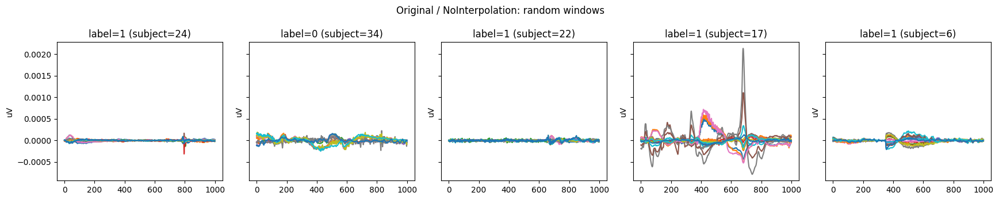

Test split by subjects: [1, 2, 26, 38]
len(train_pool) = 798
len(test_set) = 152
len(dataset) = 950
len(train_set) = 639
len(validation_set) = 159
len(test_set) = 152
Loading data for 1 events and 1000 original time points ...


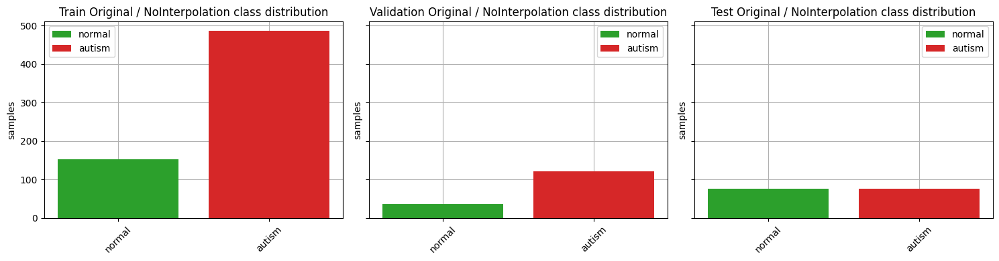

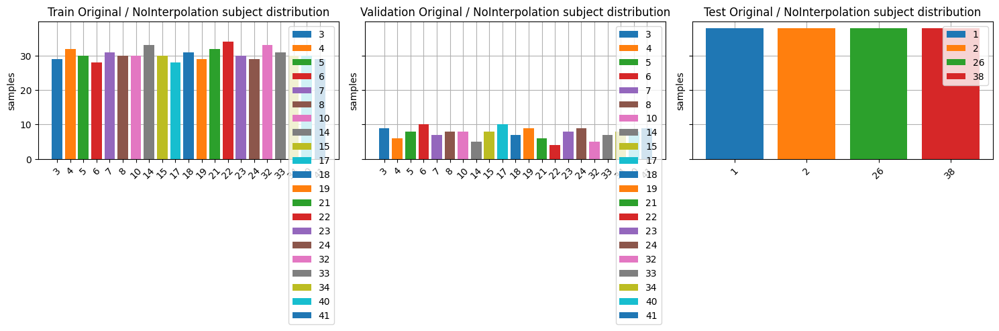


RUNNING EXPERIMENT: dataset=Original | filter=NoInterpolation | band=None
Using cached dataset: windows_dataset_150_no_interpolation
Test split by subjects: [1, 2, 26, 38]
len(train_pool) = 798
len(test_set) = 152
len(dataset) = 950
unique groups in train_set: [ 3  4  5  6  7  8 10 14 15 17 18 19 21 22 23 24 32 33 34 40 41]
n_unique_groups: 21
groups per label: {0: 5, 1: 16}
Reducing n_splits from 8 to 5. Each validation fold needs all classes; groups per label = {0: 5, 1: 16}.
Validation fold label counts:
  fold #0: {0: 38, 1: 152}
  fold #1: {0: 38, 1: 114}
  fold #2: {0: 38, 1: 114}
  fold #3: {0: 38, 1: 114}
  fold #4: {0: 38, 1: 114}
validated_n_splits = 5
cv_random_state = 42
CV method requested = StratifiedGroupKFold
n_train_total = 798
n_test = 152
n_subject_or_recording_groups_in_train = 21
n_channels = 21
input_window_samples = 1000

================ Original_NoInterpolation | FOLD 0 ================


[CV fold 0] Epoch 2
train: total=608, normal=152, autism=456
fold_valid:

In [ ]:
original_no_interpolation_options = experiment_options(
    compute_quality_metrics=False,
    compare_to_unfiltered=False,
)

original_no_interpolation_dataset = load_experiment_dataset(
    "Original",
    "NoInterpolation",
    original_no_interpolation_options,
)


original_preferred_subject_to_label = {
    1: "autism",
    2: "autism",
    37: "norm",
    38: "norm",
}

original_no_interpolation_options["test_subjects"] = choose_existing_test_subjects_same_class(
    original_no_interpolation_dataset,
    preferred_subjects=[1, 2, 37, 38],
    preferred_subject_to_label=original_preferred_subject_to_label,
)

if RUN_ALL_EXPERIMENTS:
    if PLOT_BEFORE_EXPERIMENT:
        plot_results["original_no_interpolation"] = plot_experiment_dataset(
            "Original",
            "NoInterpolation",
            original_no_interpolation_options,
        )

    experiment_results["original_no_interpolation"] = run_experiment(
        "Original",
        "NoInterpolation",
        original_no_interpolation_options,
    )
else:
    print("Skipped Original / no interpolation. Set RUN_ALL_EXPERIMENTS = True to run this cell.")

### Original / interpolation



------------------------------------------------------------------------------------------
PLOTTING: Original / None
------------------------------------------------------------------------------------------
Loading dataset from: windows_dataset_150
Reading c:\diploma\diploma_code\kpi_solution\asd\windows_dataset_150\0\0-epo.fif ...
    Found the data of interest:
        t =       0.00 ...    3996.00 ms
        0 CTF compensation matrices available
Adding metadata with 4 columns
38 matching events found
No baseline correction applied
0 projection items activated
Reading c:\diploma\diploma_code\kpi_solution\asd\windows_dataset_150\1\1-epo.fif ...
    Found the data of interest:
        t =       0.00 ...    3996.00 ms
        0 CTF compensation matrices available
Adding metadata with 4 columns
38 matching events found
No baseline correction applied
0 projection items activated
Reading c:\diploma\diploma_code\kpi_solution\asd\windows_dataset_150\2\2-epo.fif ...
    Found the data of in

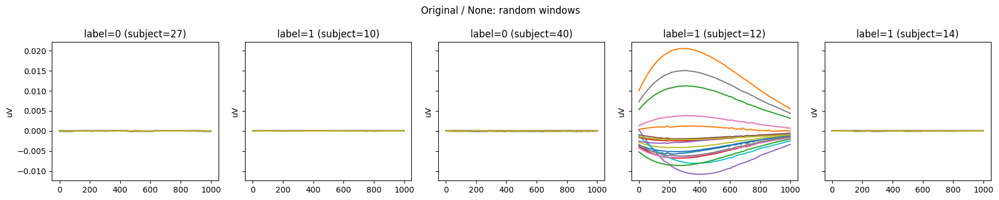

Test split by subjects: [1, 2, 37, 38]
len(train_pool) = 874
len(test_set) = 152
len(dataset) = 1026
len(train_set) = 700
len(validation_set) = 174
len(test_set) = 152
Loading data for 1 events and 1000 original time points ...


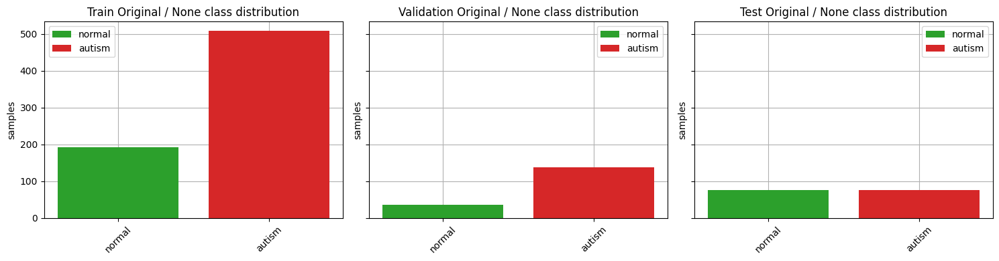

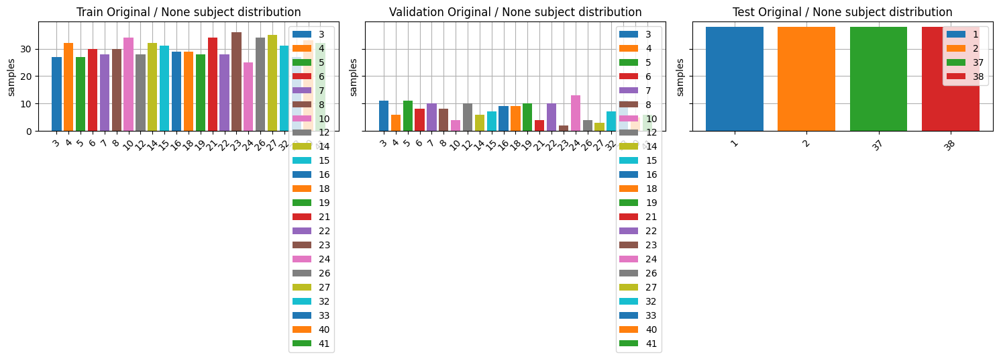


RUNNING EXPERIMENT: dataset=Original | filter=None | band=None
Using cached dataset: windows_dataset_150
SNR summary: {'mean_snr_db': 15.042218814053522, 'std_snr_db': 4.425627561927997, 'min_snr_db': 6.52418664081431, 'max_snr_db': 36.052724220440005, 'n_samples': 200.0}
Test split by subjects: [1, 2, 37, 38]
len(train_pool) = 874
len(test_set) = 152
len(dataset) = 1026
unique groups in train_set: [ 3  4  5  6  7  8 10 12 14 15 16 18 19 21 22 23 24 26 27 32 33 40 41]
n_unique_groups: 23
groups per label: {0: 6, 1: 17}
Reducing n_splits from 8 to 6. Each validation fold needs all classes; groups per label = {0: 6, 1: 17}.
Validation fold label counts:
  fold #0: {0: 38, 1: 114}
  fold #1: {0: 38, 1: 114}
  fold #2: {0: 38, 1: 114}
  fold #3: {0: 38, 1: 114}
  fold #4: {0: 38, 1: 114}
  fold #5: {0: 38, 1: 76}
validated_n_splits = 6
cv_random_state = 42
CV method requested = StratifiedGroupKFold
n_train_total = 874
n_test = 152
n_subject_or_recording_groups_in_train = 23
n_channels = 1

In [ ]:
original_none_options = experiment_options()

if RUN_ALL_EXPERIMENTS:
    if PLOT_BEFORE_EXPERIMENT:
        plot_results['original_none'] = plot_experiment_dataset('Original', None, original_none_options)
    experiment_results['original_none'] = run_experiment('Original', None, original_none_options)
else:
    print("Skipped Original / No filtering. Set RUN_ALL_EXPERIMENTS = True to run this cell.")


### Original / Butterworth



------------------------------------------------------------------------------------------
PLOTTING: Original / Butterworth
------------------------------------------------------------------------------------------
Loading dataset from: windows_dataset_butterworth
Reading c:\diploma\diploma_code\kpi_solution\asd\windows_dataset_butterworth\0\0-epo.fif ...
    Found the data of interest:
        t =       0.00 ...    3996.00 ms
        0 CTF compensation matrices available
Adding metadata with 4 columns
38 matching events found
No baseline correction applied
0 projection items activated
Reading c:\diploma\diploma_code\kpi_solution\asd\windows_dataset_butterworth\1\1-epo.fif ...
    Found the data of interest:
        t =       0.00 ...    3996.00 ms
        0 CTF compensation matrices available
Adding metadata with 4 columns
38 matching events found
No baseline correction applied
0 projection items activated
Reading c:\diploma\diploma_code\kpi_solution\asd\windows_dataset_butterworth\2

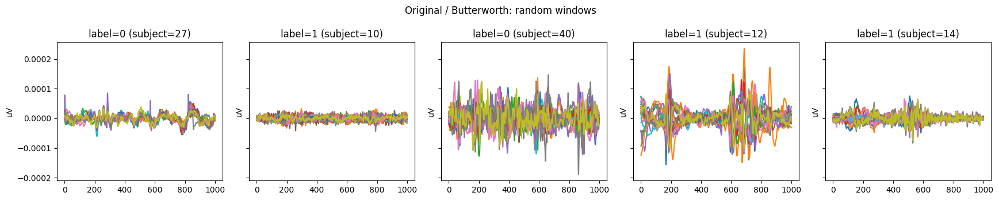

Test split by subjects: [1, 2, 37, 38]
len(train_pool) = 874
len(test_set) = 152
len(dataset) = 1026
len(train_set) = 700
len(validation_set) = 174
len(test_set) = 152
Loading data for 1 events and 1000 original time points ...


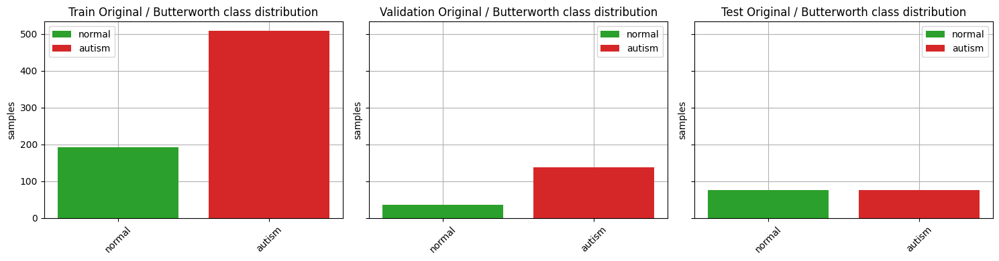

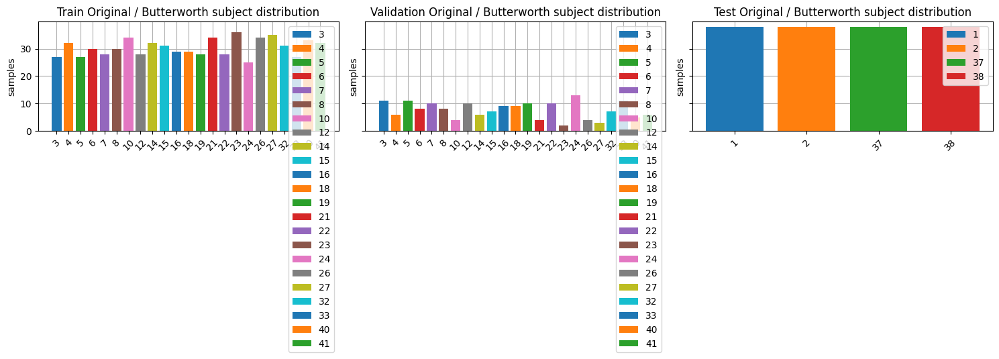


RUNNING EXPERIMENT: dataset=Original | filter=Butterworth | band=None
Using cached dataset: windows_dataset_butterworth

Loading matching unfiltered dataset for SNR/MSE comparison...
Using cached dataset: windows_dataset_150
MSE before/after filtering: {'mean_mse': 5.068735486783988e-09, 'std_mse': 3.549279622868339e-08, 'min_mse': 1.6116450954846364e-11, 'max_mse': 4.525622995098713e-07, 'n_samples': 200.0, 'skipped': 0.0}
SNR summary: {'mean_snr_db': 1.3158340513423143, 'std_snr_db': 5.2100377526647295, 'min_snr_db': -19.289074817902133, 'max_snr_db': 12.75450438790993, 'n_samples': 200.0}
Test split by subjects: [1, 2, 37, 38]
len(train_pool) = 874
len(test_set) = 152
len(dataset) = 1026
unique groups in train_set: [ 3  4  5  6  7  8 10 12 14 15 16 18 19 21 22 23 24 26 27 32 33 40 41]
n_unique_groups: 23
groups per label: {0: 6, 1: 17}
Reducing n_splits from 8 to 6. Each validation fold needs all classes; groups per label = {0: 6, 1: 17}.
Validation fold label counts:
  fold #0: {0

In [9]:
# Original / Butterworth
original_butterworth_options = experiment_options()

if RUN_ALL_EXPERIMENTS:
    if PLOT_BEFORE_EXPERIMENT:
        plot_results['original_butterworth'] = plot_experiment_dataset('Original', 'Butterworth', original_butterworth_options)
    experiment_results['original_butterworth'] = run_experiment('Original', 'Butterworth', original_butterworth_options)
else:
    print("Skipped Original / Butterworth. Set RUN_ALL_EXPERIMENTS = True to run this cell.")


### Signal Quality / Original / Butterworth


In [9]:
# Signal quality / Original / Butterworth
original_butterworth_options = experiment_options()

signal_quality_results['original_butterworth'] = calculate_experiment_quality_metrics(
    'Original',
    'Butterworth',
    original_butterworth_options,
)


Loading dataset from: windows_dataset_butterworth
Reading c:\diploma\diploma_code\kpi_solution\asd\windows_dataset_butterworth\0\0-epo.fif ...
    Found the data of interest:
        t =       0.00 ...    3996.00 ms


        0 CTF compensation matrices available
Adding metadata with 4 columns
38 matching events found
No baseline correction applied
0 projection items activated
Reading c:\diploma\diploma_code\kpi_solution\asd\windows_dataset_butterworth\1\1-epo.fif ...
    Found the data of interest:
        t =       0.00 ...    3996.00 ms
        0 CTF compensation matrices available
Adding metadata with 4 columns
38 matching events found
No baseline correction applied
0 projection items activated
Reading c:\diploma\diploma_code\kpi_solution\asd\windows_dataset_butterworth\2\2-epo.fif ...
    Found the data of interest:
        t =       0.00 ...    3996.00 ms
        0 CTF compensation matrices available
Adding metadata with 4 columns
38 matching events found
No baseline correction applied
0 projection items activated
Reading c:\diploma\diploma_code\kpi_solution\asd\windows_dataset_butterworth\3\3-epo.fif ...
    Found the data of interest:
        t =       0.00 ...    3996.00 ms
        0 CTF co

### Original / ICA



------------------------------------------------------------------------------------------
PLOTTING: Original / ICA
------------------------------------------------------------------------------------------
Loading dataset from: windows_dataset_original_ica
Reading c:\diploma\diploma_code\kpi_solution\asd\windows_dataset_original_ica\0\0-epo.fif ...
    Found the data of interest:
        t =       0.00 ...    3996.00 ms
        0 CTF compensation matrices available
Adding metadata with 4 columns
38 matching events found
No baseline correction applied
0 projection items activated
Reading c:\diploma\diploma_code\kpi_solution\asd\windows_dataset_original_ica\1\1-epo.fif ...
    Found the data of interest:
        t =       0.00 ...    3996.00 ms
        0 CTF compensation matrices available
Adding metadata with 4 columns
38 matching events found
No baseline correction applied
0 projection items activated
Reading c:\diploma\diploma_code\kpi_solution\asd\windows_dataset_original_ica\2\2-e

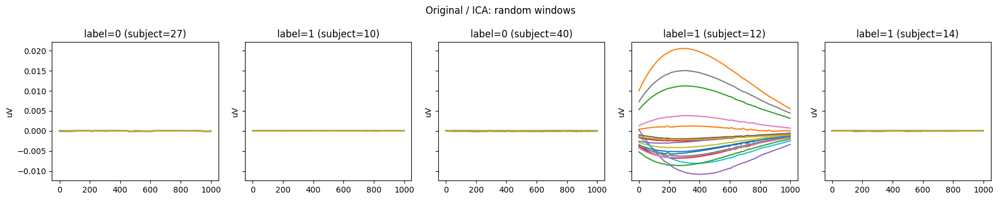

Test split by subjects: [1, 2, 37, 38]
len(train_pool) = 874
len(test_set) = 152
len(dataset) = 1026
len(train_set) = 700
len(validation_set) = 174
len(test_set) = 152
Loading data for 1 events and 1000 original time points ...


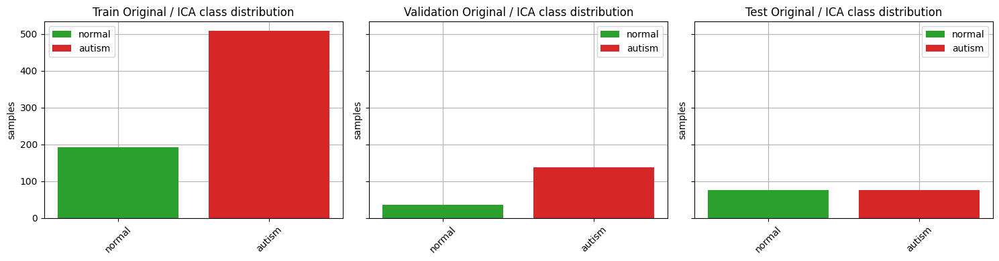

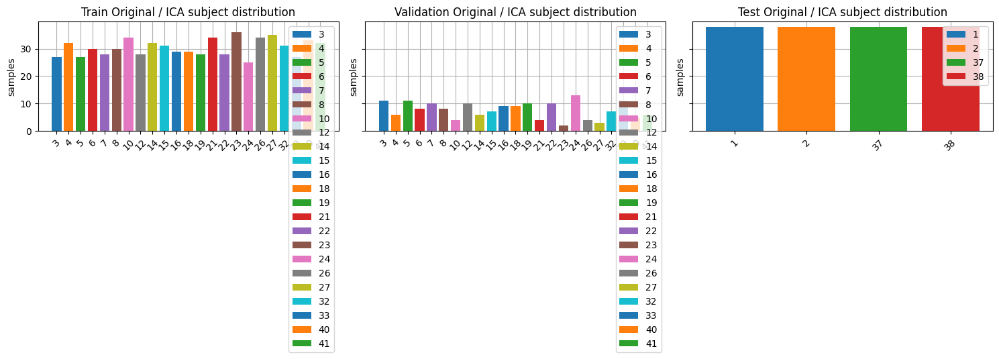


RUNNING EXPERIMENT: dataset=Original | filter=ICA | band=None
Using cached dataset: windows_dataset_original_ica

Loading matching unfiltered dataset for SNR/MSE comparison...
Using cached dataset: windows_dataset_150
MSE before/after filtering: {'mean_mse': 3.909753581856702e-11, 'std_mse': 1.1117244682425201e-10, 'min_mse': 0.0, 'max_mse': 1.343569569234348e-09, 'n_samples': 200.0, 'skipped': 0.0}
SNR summary: {'mean_snr_db': 18.801373098590673, 'std_snr_db': 10.142267639833653, 'min_snr_db': 3.0980909135140893, 'max_snr_db': 57.61553704555606, 'n_samples': 200.0}
Test split by subjects: [1, 2, 37, 38]
len(train_pool) = 874
len(test_set) = 152
len(dataset) = 1026
unique groups in train_set: [ 3  4  5  6  7  8 10 12 14 15 16 18 19 21 22 23 24 26 27 32 33 40 41]
n_unique_groups: 23
groups per label: {0: 6, 1: 17}
Reducing n_splits from 8 to 6. Each validation fold needs all classes; groups per label = {0: 6, 1: 17}.
Validation fold label counts:
  fold #0: {0: 38, 1: 114}
  fold #1: {

In [10]:
# Original / ICA
original_ica_options = experiment_options()

if RUN_ALL_EXPERIMENTS:
    if PLOT_BEFORE_EXPERIMENT:
        plot_results['original_ica'] = plot_experiment_dataset('Original', 'ICA', original_ica_options)
    experiment_results['original_ica'] = run_experiment('Original', 'ICA', original_ica_options)
else:
    print("Skipped Original / ICA. Set RUN_ALL_EXPERIMENTS = True to run this cell.")


### Signal Quality / Original / ICA


In [10]:
# Signal quality / Original / ICA
original_ica_options = experiment_options()

signal_quality_results['original_ica'] = calculate_experiment_quality_metrics(
    'Original',
    'ICA',
    original_ica_options,
)


Loading dataset from: windows_dataset_original_ica
Reading c:\diploma\diploma_code\kpi_solution\asd\windows_dataset_original_ica\0\0-epo.fif ...
    Found the data of interest:
        t =       0.00 ...    3996.00 ms
        0 CTF compensation matrices available
Adding metadata with 4 columns
38 matching events found
No baseline correction applied
0 projection items activated
Reading c:\diploma\diploma_code\kpi_solution\asd\windows_dataset_original_ica\1\1-epo.fif ...
    Found the data of interest:
        t =       0.00 ...    3996.00 ms
        0 CTF compensation matrices available
Adding metadata with 4 columns
38 matching events found
No baseline correction applied
0 projection items activated
Reading c:\diploma\diploma_code\kpi_solution\asd\windows_dataset_original_ica\2\2-epo.fif ...
    Found the data of interest:
        t =       0.00 ...    3996.00 ms
        0 CTF compensation matrices available
Adding metadata with 4 columns
38 matching events found
No baseline correction

### Original / DWT / alpha



------------------------------------------------------------------------------------------
PLOTTING: Original / DWT / alpha
------------------------------------------------------------------------------------------
Loading dataset from: windows_dataset_alpha_dwt
Reading c:\diploma\diploma_code\kpi_solution\asd\windows_dataset_alpha_dwt\0\0-epo.fif ...
    Found the data of interest:
        t =       0.00 ...    3996.00 ms
        0 CTF compensation matrices available
Adding metadata with 4 columns
38 matching events found
No baseline correction applied
0 projection items activated
Reading c:\diploma\diploma_code\kpi_solution\asd\windows_dataset_alpha_dwt\1\1-epo.fif ...
    Found the data of interest:
        t =       0.00 ...    3996.00 ms
        0 CTF compensation matrices available
Adding metadata with 4 columns
38 matching events found
No baseline correction applied
0 projection items activated
Reading c:\diploma\diploma_code\kpi_solution\asd\windows_dataset_alpha_dwt\2\2-epo.f

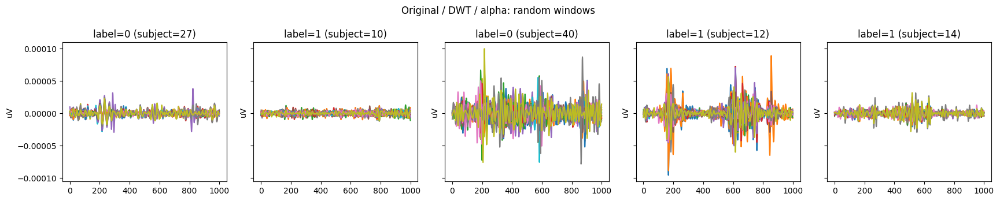

Test split by subjects: [1, 2, 37, 38]
len(train_pool) = 874
len(test_set) = 152
len(dataset) = 1026
len(train_set) = 700
len(validation_set) = 174
len(test_set) = 152
Loading data for 1 events and 1000 original time points ...


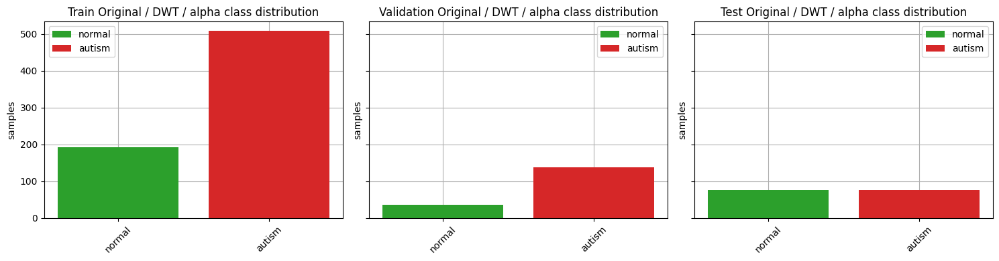

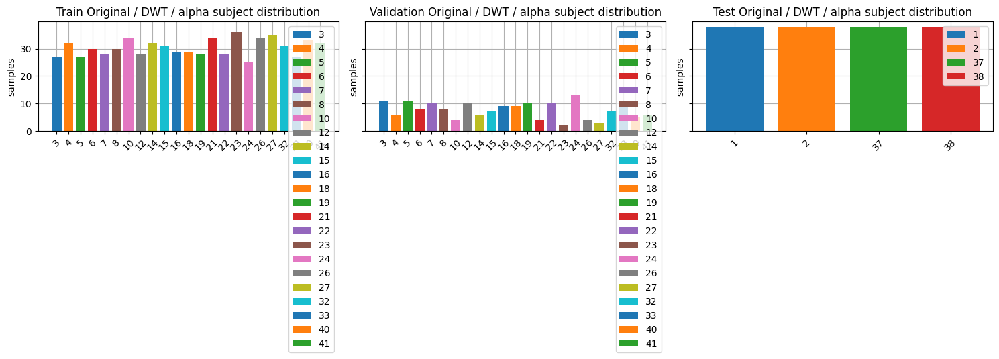


RUNNING EXPERIMENT: dataset=Original | filter=DWT | band=alpha
Using cached dataset: windows_dataset_alpha_dwt

Loading matching unfiltered dataset for SNR/MSE comparison...
Using cached dataset: windows_dataset_150
MSE before/after filtering: {'mean_mse': 7.847559070553866e-09, 'std_mse': 4.8445245320772876e-08, 'min_mse': 4.934730176149543e-11, 'max_mse': 5.992959903843543e-07, 'n_samples': 200.0, 'skipped': 0.0}
SNR summary: {'mean_snr_db': -12.687595336656054, 'std_snr_db': 5.086429548104025, 'min_snr_db': -35.691516298425356, 'max_snr_db': -4.601684576859697, 'n_samples': 200.0}
Test split by subjects: [1, 2, 37, 38]
len(train_pool) = 874
len(test_set) = 152
len(dataset) = 1026
unique groups in train_set: [ 3  4  5  6  7  8 10 12 14 15 16 18 19 21 22 23 24 26 27 32 33 40 41]
n_unique_groups: 23
groups per label: {0: 6, 1: 17}
Reducing n_splits from 8 to 6. Each validation fold needs all classes; groups per label = {0: 6, 1: 17}.
Validation fold label counts:
  fold #0: {0: 38, 1:

In [11]:
# Original / DWT / alpha
original_dwt_alpha_options = experiment_options(band='alpha')

if RUN_ALL_EXPERIMENTS:
    if PLOT_BEFORE_EXPERIMENT:
        plot_results['original_dwt_alpha'] = plot_experiment_dataset('Original', 'DWT', original_dwt_alpha_options)
    experiment_results['original_dwt_alpha'] = run_experiment('Original', 'DWT', original_dwt_alpha_options)
else:
    print("Skipped Original / DWT / alpha. Set RUN_ALL_EXPERIMENTS = True to run this cell.")


### Original / DWT / beta



------------------------------------------------------------------------------------------
PLOTTING: Original / DWT / beta
------------------------------------------------------------------------------------------
Loading dataset from: windows_dataset_beta_dwt
Reading c:\diploma\diploma_code\kpi_solution\asd\windows_dataset_beta_dwt\0\0-epo.fif ...
    Found the data of interest:
        t =       0.00 ...    3996.00 ms
        0 CTF compensation matrices available
Adding metadata with 4 columns
38 matching events found
No baseline correction applied
0 projection items activated
Reading c:\diploma\diploma_code\kpi_solution\asd\windows_dataset_beta_dwt\1\1-epo.fif ...
    Found the data of interest:
        t =       0.00 ...    3996.00 ms
        0 CTF compensation matrices available
Adding metadata with 4 columns
38 matching events found
No baseline correction applied
0 projection items activated
Reading c:\diploma\diploma_code\kpi_solution\asd\windows_dataset_beta_dwt\2\2-epo.fif ..

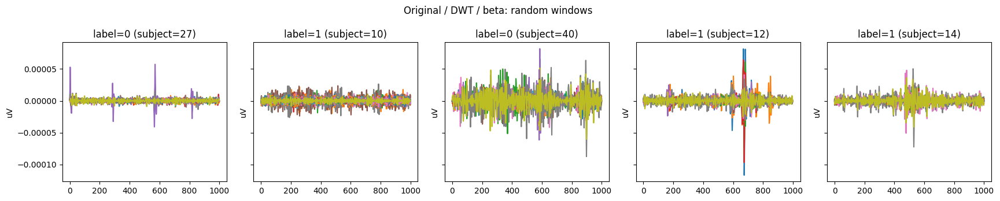

Test split by subjects: [1, 2, 37, 38]
len(train_pool) = 874
len(test_set) = 152
len(dataset) = 1026
len(train_set) = 700
len(validation_set) = 174
len(test_set) = 152
Loading data for 1 events and 1000 original time points ...


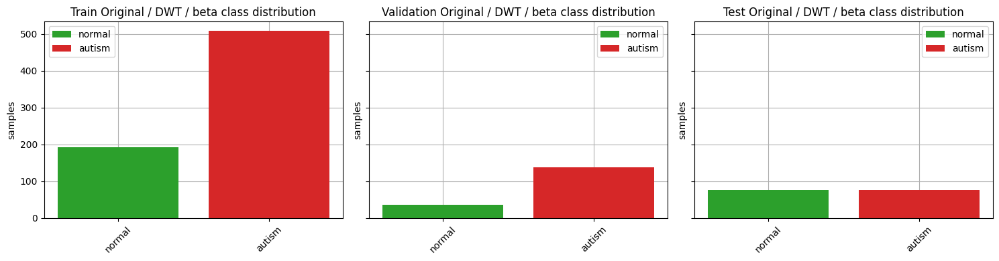

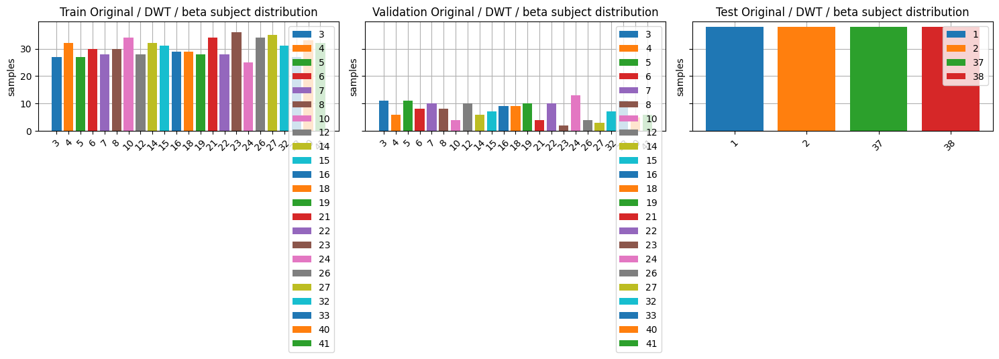


RUNNING EXPERIMENT: dataset=Original | filter=DWT | band=beta
Using cached dataset: windows_dataset_beta_dwt

Loading matching unfiltered dataset for SNR/MSE comparison...
Using cached dataset: windows_dataset_150
MSE before/after filtering: {'mean_mse': 7.927597671935735e-09, 'std_mse': 4.7710825863945995e-08, 'min_mse': 5.1465674026952564e-11, 'max_mse': 5.752804092823632e-07, 'n_samples': 200.0, 'skipped': 0.0}
SNR summary: {'mean_snr_db': -14.973070502755904, 'std_snr_db': 5.027726691252021, 'min_snr_db': -39.11280869634212, 'max_snr_db': -6.607984182093168, 'n_samples': 200.0}
Test split by subjects: [1, 2, 37, 38]
len(train_pool) = 874
len(test_set) = 152
len(dataset) = 1026
unique groups in train_set: [ 3  4  5  6  7  8 10 12 14 15 16 18 19 21 22 23 24 26 27 32 33 40 41]
n_unique_groups: 23
groups per label: {0: 6, 1: 17}
Reducing n_splits from 8 to 6. Each validation fold needs all classes; groups per label = {0: 6, 1: 17}.
Validation fold label counts:
  fold #0: {0: 38, 1: 1

In [12]:
# Original / DWT / beta
original_dwt_beta_options = experiment_options(band='beta')

if RUN_ALL_EXPERIMENTS:
    if PLOT_BEFORE_EXPERIMENT:
        plot_results['original_dwt_beta'] = plot_experiment_dataset('Original', 'DWT', original_dwt_beta_options)
    experiment_results['original_dwt_beta'] = run_experiment('Original', 'DWT', original_dwt_beta_options)
else:
    print("Skipped Original / DWT / beta. Set RUN_ALL_EXPERIMENTS = True to run this cell.")


### Original / DWT / theta



------------------------------------------------------------------------------------------
PLOTTING: Original / DWT / theta
------------------------------------------------------------------------------------------
Loading dataset from: windows_dataset_theta_dwt
Reading c:\diploma\diploma_code\kpi_solution\asd\windows_dataset_theta_dwt\0\0-epo.fif ...
    Found the data of interest:
        t =       0.00 ...    3996.00 ms
        0 CTF compensation matrices available
Adding metadata with 4 columns
38 matching events found
No baseline correction applied
0 projection items activated
Reading c:\diploma\diploma_code\kpi_solution\asd\windows_dataset_theta_dwt\1\1-epo.fif ...
    Found the data of interest:
        t =       0.00 ...    3996.00 ms
        0 CTF compensation matrices available
Adding metadata with 4 columns
38 matching events found
No baseline correction applied
0 projection items activated
Reading c:\diploma\diploma_code\kpi_solution\asd\windows_dataset_theta_dwt\2\2-epo.f

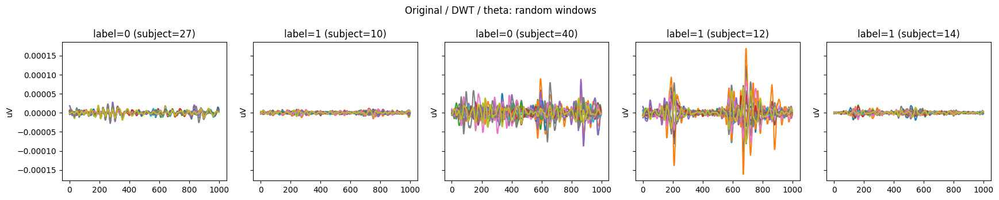

Test split by subjects: [1, 2, 37, 38]
len(train_pool) = 874
len(test_set) = 152
len(dataset) = 1026
len(train_set) = 700
len(validation_set) = 174
len(test_set) = 152
Loading data for 1 events and 1000 original time points ...


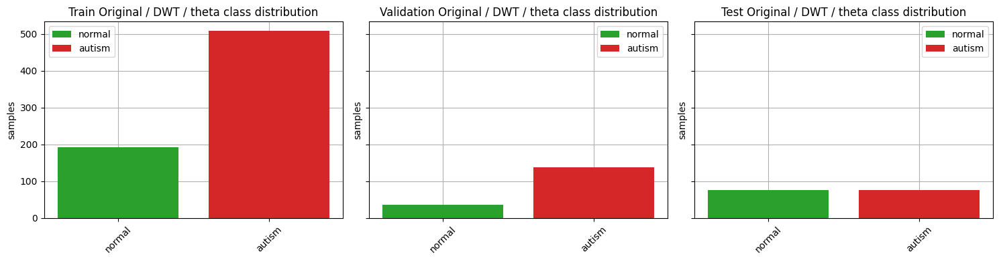

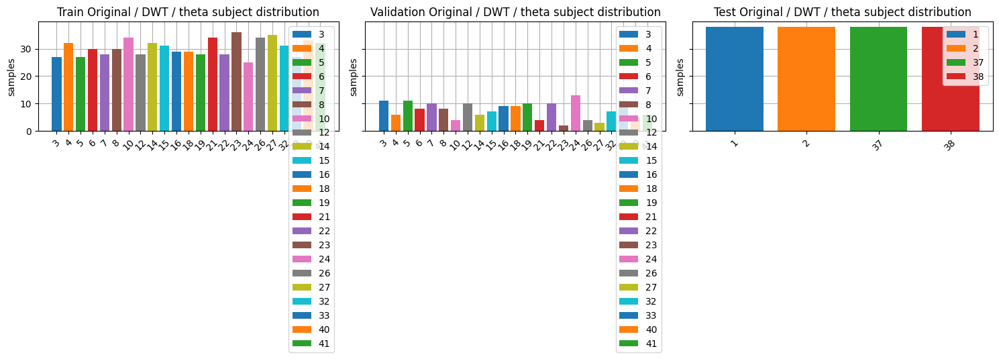


RUNNING EXPERIMENT: dataset=Original | filter=DWT | band=theta
Using cached dataset: windows_dataset_theta_dwt

Loading matching unfiltered dataset for SNR/MSE comparison...
Loading dataset from: windows_dataset_150
Reading c:\diploma\diploma_code\kpi_solution\asd\windows_dataset_150\0\0-epo.fif ...
    Found the data of interest:
        t =       0.00 ...    3996.00 ms
        0 CTF compensation matrices available
Adding metadata with 4 columns
38 matching events found
No baseline correction applied
0 projection items activated
Reading c:\diploma\diploma_code\kpi_solution\asd\windows_dataset_150\1\1-epo.fif ...
    Found the data of interest:
        t =       0.00 ...    3996.00 ms
        0 CTF compensation matrices available
Adding metadata with 4 columns
38 matching events found
No baseline correction applied
0 projection items activated
Reading c:\diploma\diploma_code\kpi_solution\asd\windows_dataset_150\2\2-epo.fif ...
    Found the data of interest:
        t =       0.00 ...

In [8]:
# Original / DWT / theta
original_dwt_theta_options = experiment_options(band='theta')

if RUN_ALL_EXPERIMENTS:
    if PLOT_BEFORE_EXPERIMENT:
        plot_results['original_dwt_theta'] = plot_experiment_dataset('Original', 'DWT', original_dwt_theta_options)
    experiment_results['original_dwt_theta'] = run_experiment('Original', 'DWT', original_dwt_theta_options)
else:
    print("Skipped Original / DWT / theta. Set RUN_ALL_EXPERIMENTS = True to run this cell.")


### Original / DWT / gamma



------------------------------------------------------------------------------------------
PLOTTING: Original / DWT / gamma
------------------------------------------------------------------------------------------
Loading dataset from: windows_dataset_gamma_dwt
Reading c:\diploma\diploma_code\kpi_solution\asd\windows_dataset_gamma_dwt\0\0-epo.fif ...
    Found the data of interest:
        t =       0.00 ...    3996.00 ms
        0 CTF compensation matrices available
Adding metadata with 4 columns
38 matching events found
No baseline correction applied
0 projection items activated
Reading c:\diploma\diploma_code\kpi_solution\asd\windows_dataset_gamma_dwt\1\1-epo.fif ...
    Found the data of interest:
        t =       0.00 ...    3996.00 ms
        0 CTF compensation matrices available
Adding metadata with 4 columns
38 matching events found
No baseline correction applied
0 projection items activated
Reading c:\diploma\diploma_code\kpi_solution\asd\windows_dataset_gamma_dwt\2\2-epo.f

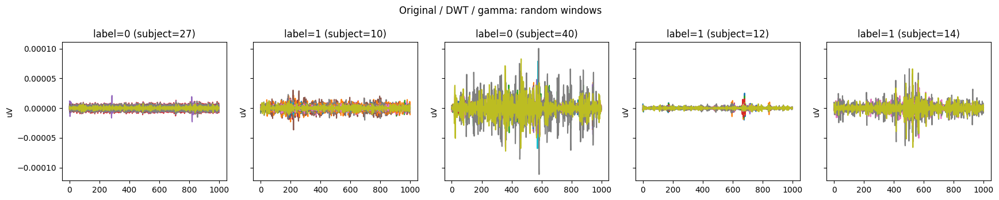

Test split by subjects: [1, 2, 37, 38]
len(train_pool) = 874
len(test_set) = 152
len(dataset) = 1026
len(train_set) = 700
len(validation_set) = 174
len(test_set) = 152
Loading data for 1 events and 1000 original time points ...


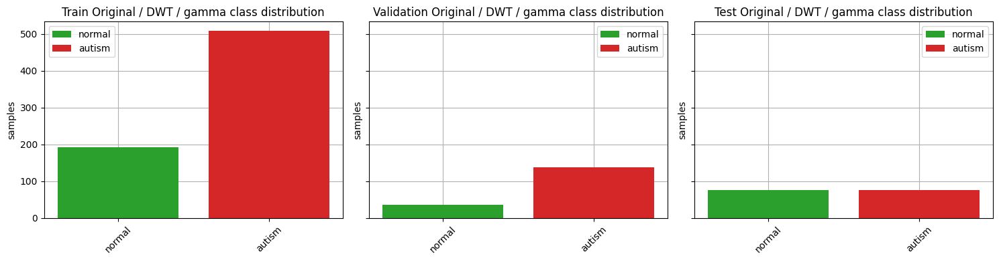

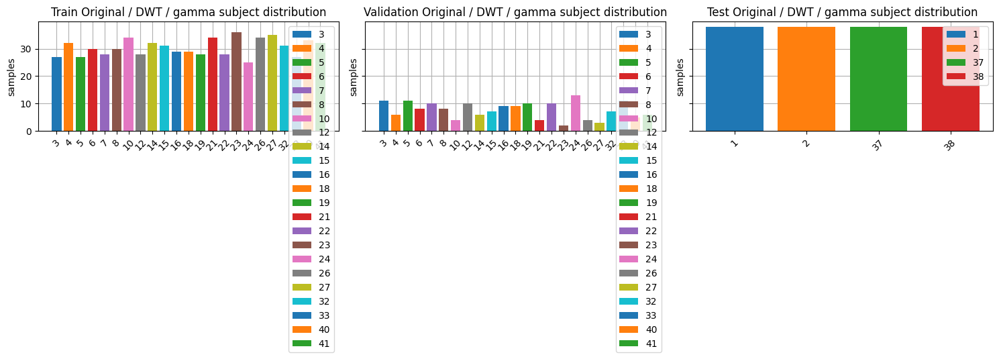


RUNNING EXPERIMENT: dataset=Original | filter=DWT | band=gamma
Using cached dataset: windows_dataset_gamma_dwt

Loading matching unfiltered dataset for SNR/MSE comparison...
Using cached dataset: windows_dataset_150
MSE before/after filtering: {'mean_mse': 8.051006017924162e-09, 'std_mse': 4.815422377263607e-08, 'min_mse': 5.26971020983034e-11, 'max_mse': 5.77480101228163e-07, 'n_samples': 200.0, 'skipped': 0.0}
SNR summary: {'mean_snr_db': -19.62104424480964, 'std_snr_db': 5.020960433141086, 'min_snr_db': -48.89368165012221, 'max_snr_db': -9.910787860829338, 'n_samples': 200.0}
Test split by subjects: [1, 2, 37, 38]
len(train_pool) = 874
len(test_set) = 152
len(dataset) = 1026
unique groups in train_set: [ 3  4  5  6  7  8 10 12 14 15 16 18 19 21 22 23 24 26 27 32 33 40 41]
n_unique_groups: 23
groups per label: {0: 6, 1: 17}
Reducing n_splits from 8 to 6. Each validation fold needs all classes; groups per label = {0: 6, 1: 17}.
Validation fold label counts:
  fold #0: {0: 38, 1: 114}

In [9]:
# Original / DWT / gamma
original_dwt_gamma_options = experiment_options(band='gamma')

if RUN_ALL_EXPERIMENTS:
    if PLOT_BEFORE_EXPERIMENT:
        plot_results['original_dwt_gamma'] = plot_experiment_dataset('Original', 'DWT', original_dwt_gamma_options)
    experiment_results['original_dwt_gamma'] = run_experiment('Original', 'DWT', original_dwt_gamma_options)
else:
    print("Skipped Original / DWT / gamma. Set RUN_ALL_EXPERIMENTS = True to run this cell.")


### Original / DWT / delta



------------------------------------------------------------------------------------------
PLOTTING: Original / DWT / delta
------------------------------------------------------------------------------------------
Loading dataset from: windows_dataset_delta_dwt
Reading c:\diploma\diploma_code\kpi_solution\asd\windows_dataset_delta_dwt\0\0-epo.fif ...
    Found the data of interest:
        t =       0.00 ...    3996.00 ms
        0 CTF compensation matrices available
Adding metadata with 4 columns
38 matching events found
No baseline correction applied
0 projection items activated
Reading c:\diploma\diploma_code\kpi_solution\asd\windows_dataset_delta_dwt\1\1-epo.fif ...
    Found the data of interest:
        t =       0.00 ...    3996.00 ms
        0 CTF compensation matrices available
Adding metadata with 4 columns
38 matching events found
No baseline correction applied
0 projection items activated
Reading c:\diploma\diploma_code\kpi_solution\asd\windows_dataset_delta_dwt\2\2-epo.f

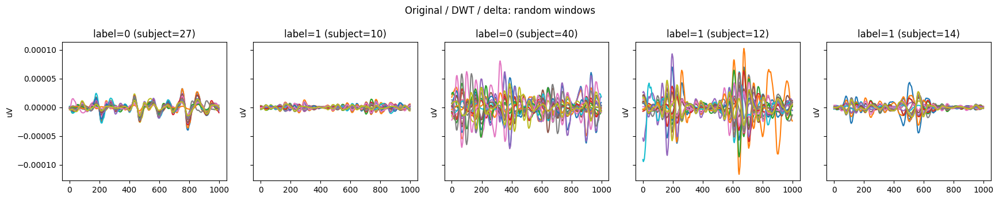

Test split by subjects: [1, 2, 37, 38]
len(train_pool) = 874
len(test_set) = 152
len(dataset) = 1026
len(train_set) = 700
len(validation_set) = 174
len(test_set) = 152
Loading data for 1 events and 1000 original time points ...


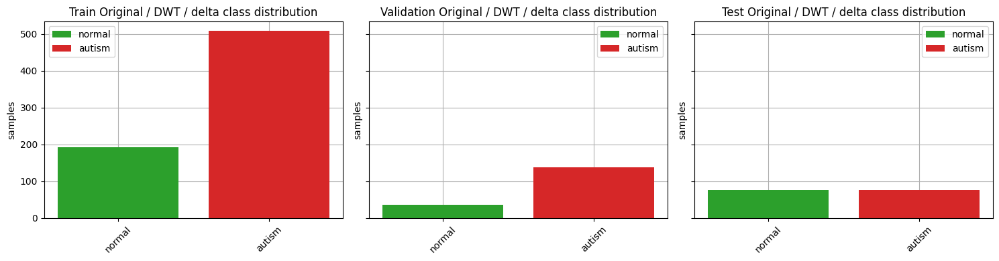

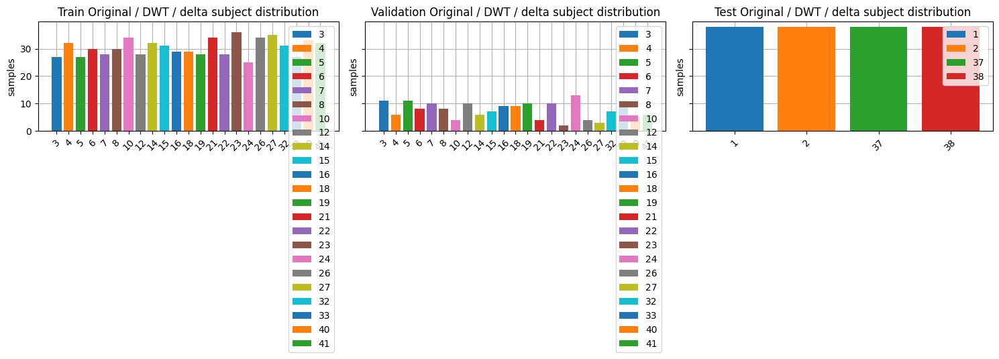


RUNNING EXPERIMENT: dataset=Original | filter=DWT | band=delta
Using cached dataset: windows_dataset_delta_dwt

Loading matching unfiltered dataset for SNR/MSE comparison...
Using cached dataset: windows_dataset_150
MSE before/after filtering: {'mean_mse': 7.225807522384288e-09, 'std_mse': 4.6599109329131113e-08, 'min_mse': 3.755280195219671e-11, 'max_mse': 6.024388961410917e-07, 'n_samples': 200.0, 'skipped': 0.0}
SNR summary: {'mean_snr_db': -8.319464412820226, 'std_snr_db': 3.3320210711541445, 'min_snr_db': -22.89251768458459, 'max_snr_db': -0.13269138487476875, 'n_samples': 200.0}
Test split by subjects: [1, 2, 37, 38]
len(train_pool) = 874
len(test_set) = 152
len(dataset) = 1026
unique groups in train_set: [ 3  4  5  6  7  8 10 12 14 15 16 18 19 21 22 23 24 26 27 32 33 40 41]
n_unique_groups: 23
groups per label: {0: 6, 1: 17}
Reducing n_splits from 8 to 6. Each validation fold needs all classes; groups per label = {0: 6, 1: 17}.
Validation fold label counts:
  fold #0: {0: 38, 1

In [10]:
# Original / DWT / delta
original_dwt_delta_options = experiment_options(band='delta')

if RUN_ALL_EXPERIMENTS:
    if PLOT_BEFORE_EXPERIMENT:
        plot_results['original_dwt_delta'] = plot_experiment_dataset('Original', 'DWT', original_dwt_delta_options)
    experiment_results['original_dwt_delta'] = run_experiment('Original', 'DWT', original_dwt_delta_options)
else:
    print("Skipped Original / DWT / delta. Set RUN_ALL_EXPERIMENTS = True to run this cell.")


### Original / DWT combined bands



------------------------------------------------------------------------------------------
PLOTTING: Original / DWT_COMBINED
------------------------------------------------------------------------------------------
Loading dataset from: windows_dataset_dwt_combined
Reading c:\diploma\diploma_code\kpi_solution\asd\windows_dataset_dwt_combined\0\0-epo.fif ...
    Found the data of interest:
        t =       0.00 ...    3996.00 ms
        0 CTF compensation matrices available
Adding metadata with 4 columns
38 matching events found
No baseline correction applied
0 projection items activated
Reading c:\diploma\diploma_code\kpi_solution\asd\windows_dataset_dwt_combined\1\1-epo.fif ...
    Found the data of interest:
        t =       0.00 ...    3996.00 ms
        0 CTF compensation matrices available
Adding metadata with 4 columns
38 matching events found
No baseline correction applied
0 projection items activated
Reading c:\diploma\diploma_code\kpi_solution\asd\windows_dataset_dwt_combi

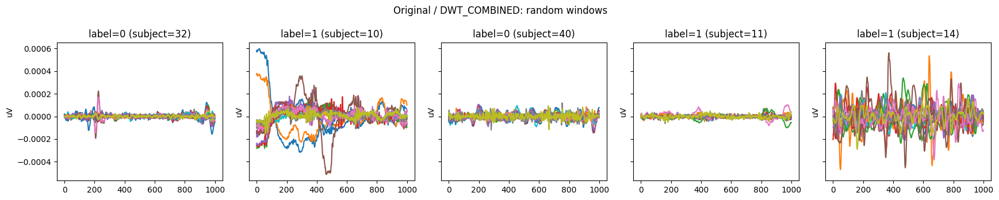

Test split by subjects: [1, 2, 37, 38]
len(train_pool) = 874
len(test_set) = 152
len(dataset) = 1026
len(train_set) = 700
len(validation_set) = 174
len(test_set) = 152
Loading data for 1 events and 1000 original time points ...


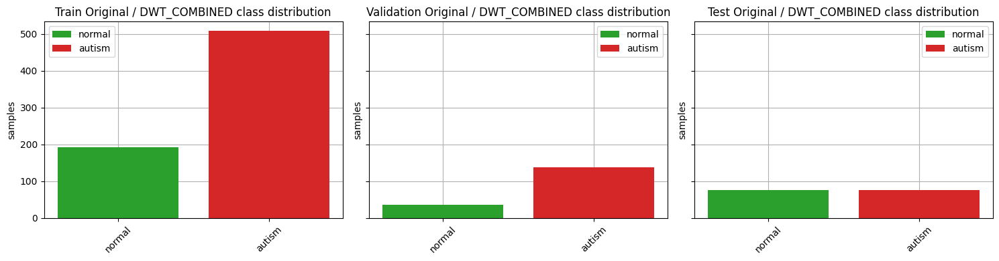

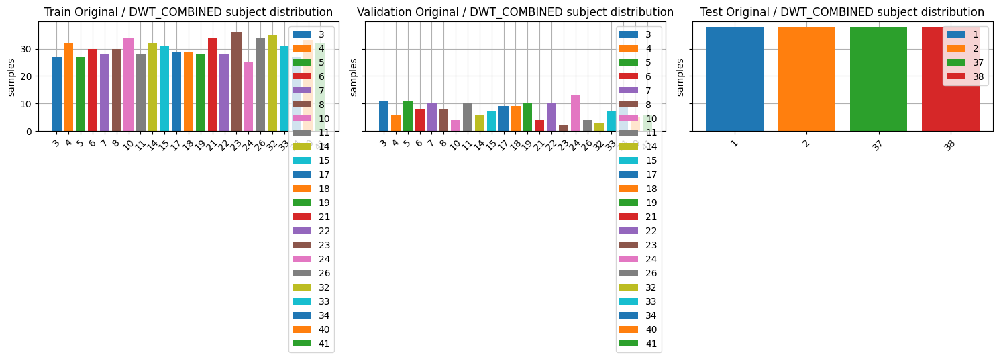


RUNNING EXPERIMENT: dataset=Original | filter=DWT_COMBINED | band=None
Using cached dataset: windows_dataset_dwt_combined
Test split by subjects: [1, 2, 37, 38]
len(train_pool) = 874
len(test_set) = 152
len(dataset) = 1026
unique groups in train_set: [ 3  4  5  6  7  8 10 11 14 15 17 18 19 21 22 23 24 26 32 33 34 40 41]
n_unique_groups: 23
groups per label: {0: 6, 1: 17}
Reducing n_splits from 8 to 6. Each validation fold needs all classes; groups per label = {0: 6, 1: 17}.
Validation fold label counts:
  fold #0: {0: 38, 1: 114}
  fold #1: {0: 38, 1: 114}
  fold #2: {0: 38, 1: 114}
  fold #3: {0: 38, 1: 114}
  fold #4: {0: 38, 1: 114}
  fold #5: {0: 38, 1: 76}
validated_n_splits = 6
cv_random_state = 42
CV method requested = StratifiedGroupKFold
n_train_total = 874
n_test = 152
n_subject_or_recording_groups_in_train = 23
n_channels = 19
input_window_samples = 1000

================ Original_DWT_COMBINED | FOLD 0 ================


[CV fold 0] Epoch 2
train: total=722, normal=190, aut

In [25]:
# Original / DWT combined bands
# Uses windows_dataset_dwt_combined created in dataset_preprocessing.ipynb.
original_dwt_combined_options = experiment_options(
    compute_quality_metrics=True,
    compare_to_unfiltered=True,
)

if RUN_ALL_EXPERIMENTS:
    if PLOT_BEFORE_EXPERIMENT:
        plot_results['original_dwt_combined'] = plot_experiment_dataset(
            'Original',
            'DWT_COMBINED',
            original_dwt_combined_options,
        )
    experiment_results['original_dwt_combined'] = run_experiment(
        'Original',
        'DWT_COMBINED',
        original_dwt_combined_options,
    )
else:
    print("Skipped Original / DWT combined bands. Set RUN_ALL_EXPERIMENTS = True to run this cell.")


### Sheffield, no interpolation

Using cached dataset: windows_dataset_150_sheffield_no_interpolation
Replacing missing subject 1 (autism) with subject 10 (autism)
Replacing missing subject 45 (norm) with subject 23 (norm)
Available subjects: [10, 15, 17, 18, 23, 32, 34, 36, 48, 50, 51, 53]
Chosen test subjects: [10, 23]

------------------------------------------------------------------------------------------
PLOTTING: Sheffield / NoInterpolation
------------------------------------------------------------------------------------------
Using cached dataset: windows_dataset_150_sheffield_no_interpolation
n_channels = 59
input_window_samples = 1000
ch_names = ['Fp1', 'AF7', 'AF3', 'F1', 'F3', 'F5', 'F7', 'FT7', 'FC5', 'FC3', 'FC1', 'C1', 'C3', 'C5', 'T7', 'TP7', 'CP5', 'CP1', 'P1', 'P3', 'P5', 'P7', 'P9', 'PO3', 'O1', 'IZ', 'OZ', 'POZ', 'Pz', 'CPZ', 'FPZ', 'Fp2', 'AF8', 'AF4', 'AFZ', 'Fz', 'F2', 'F6', 'F8', 'FT8', 'FC6', 'FC4', 'FC2', 'FCZ', 'C2', 'C4', 'C6', 'T8', 'TP8', 'CP6', 'CP2', 'P2', 'P4', 'P6', 'P8', 'P10', '

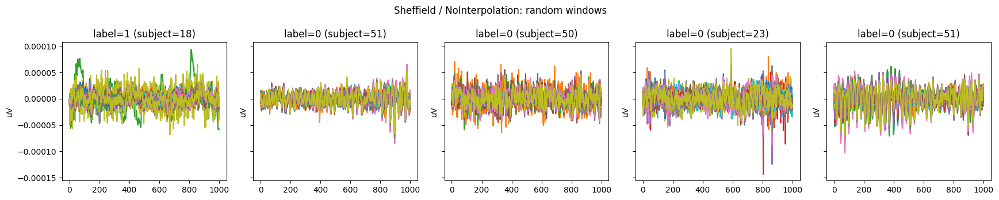

Test split by subjects: [10, 23]
len(train_pool) = 380
len(test_set) = 76
len(dataset) = 456
len(train_set) = 304
len(validation_set) = 76
len(test_set) = 76
Loading data for 1 events and 1000 original time points ...


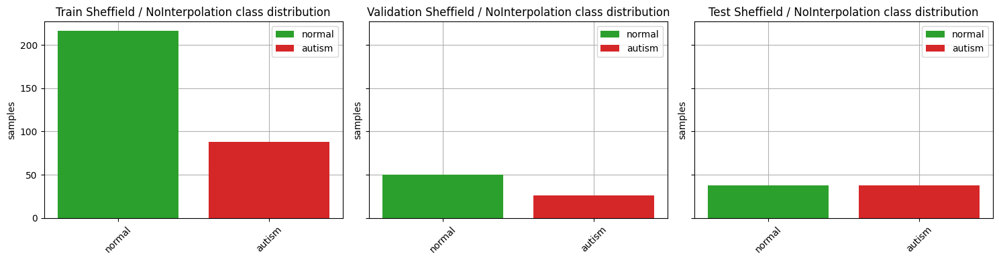

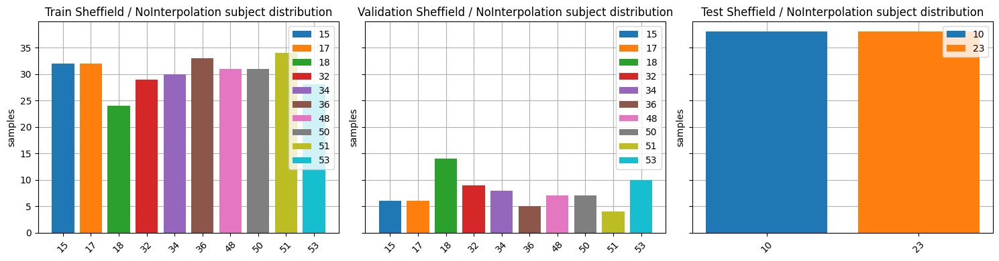


RUNNING EXPERIMENT: dataset=Sheffield | filter=NoInterpolation | band=None
Using cached dataset: windows_dataset_150_sheffield_no_interpolation
Test split by subjects: [10, 23]
len(train_pool) = 380
len(test_set) = 76
len(dataset) = 456
unique groups in train_set: [15 17 18 32 34 36 48 50 51 53]
n_unique_groups: 10
groups per label: {0: 7, 1: 3}
Reducing n_splits from 8 to 3. Each validation fold needs all classes; groups per label = {0: 7, 1: 3}.
Validation fold label counts:
  fold #0: {0: 114, 1: 38}
  fold #1: {0: 76, 1: 38}
  fold #2: {0: 76, 1: 38}
validated_n_splits = 3
cv_random_state = 42
CV method requested = StratifiedGroupKFold
n_train_total = 380
n_test = 76
n_subject_or_recording_groups_in_train = 10
n_channels = 59
input_window_samples = 1000

================ Sheffield_NoInterpolation | FOLD 0 ================


[CV fold 0] Epoch 2
train: total=228, normal=152, autism=76
fold_valid: total=152, normal=114, autism=38
test: total=76, normal=38, autism=38
[CV fold 0] fold_

In [13]:
# Sheffield / No interpolation
sheffield_no_interpolation_options = experiment_options(
    compute_quality_metrics=False,
    compare_to_unfiltered=False,
)

sheffield_no_interpolation_dataset = load_experiment_dataset(
    "Sheffield",
    "NoInterpolation",
    sheffield_no_interpolation_options,
)

# Sheffield fixed test subjects were [1, 2, 3, 4, 37, 38, 42, 45].
# Use the same class when replacement is needed.
sheffield_preferred_subject_to_label = {
    1: "autism",
    2: "autism",
    3: "autism",
    4: "autism",
    37: "norm",
    38: "norm",
    42: "norm",
    45: "norm",
}

sheffield_no_interpolation_options["test_subjects"] = choose_existing_test_subjects_same_class(
    sheffield_no_interpolation_dataset,
    preferred_subjects=[1, 45],
    preferred_subject_to_label=sheffield_preferred_subject_to_label,
)

if RUN_ALL_EXPERIMENTS:
    if PLOT_BEFORE_EXPERIMENT:
        plot_results["sheffield_no_interpolation"] = plot_experiment_dataset(
            "Sheffield",
            "NoInterpolation",
            sheffield_no_interpolation_options,
        )

    experiment_results["sheffield_no_interpolation"] = run_experiment(
        "Sheffield",
        "NoInterpolation",
        sheffield_no_interpolation_options,
    )
else:
    print("Skipped Sheffield / no interpolation. Set RUN_ALL_EXPERIMENTS = True to run this cell.")

### Sheffield / interpolation



------------------------------------------------------------------------------------------
PLOTTING: Sheffield / None
------------------------------------------------------------------------------------------
Loading dataset from: windows_dataset_150_sheffield
Reading c:\diploma\diploma_code\kpi_solution\asd\windows_dataset_150_sheffield\0\0-epo.fif ...
    Found the data of interest:
        t =       0.00 ...    3996.00 ms
        0 CTF compensation matrices available
Adding metadata with 4 columns
38 matching events found
No baseline correction applied
0 projection items activated
Reading c:\diploma\diploma_code\kpi_solution\asd\windows_dataset_150_sheffield\1\1-epo.fif ...
    Found the data of interest:
        t =       0.00 ...    3996.00 ms
        0 CTF compensation matrices available
Adding metadata with 4 columns
38 matching events found
No baseline correction applied
0 projection items activated
Reading c:\diploma\diploma_code\kpi_solution\asd\windows_dataset_150_sheffield

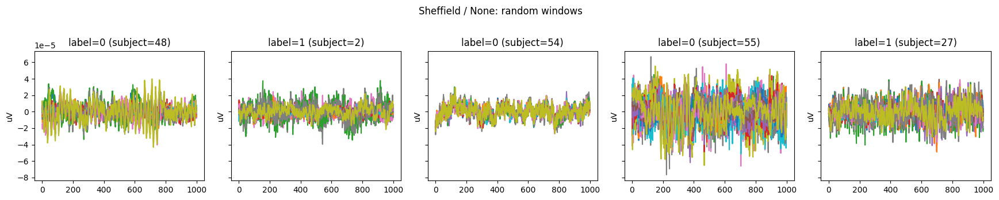

Test split by subjects: [1, 2, 3, 4, 37, 38, 42, 45]
len(train_pool) = 1481
len(test_set) = 304
len(dataset) = 1785
len(train_set) = 1185
len(validation_set) = 296
len(test_set) = 304
Loading data for 1 events and 1000 original time points ...


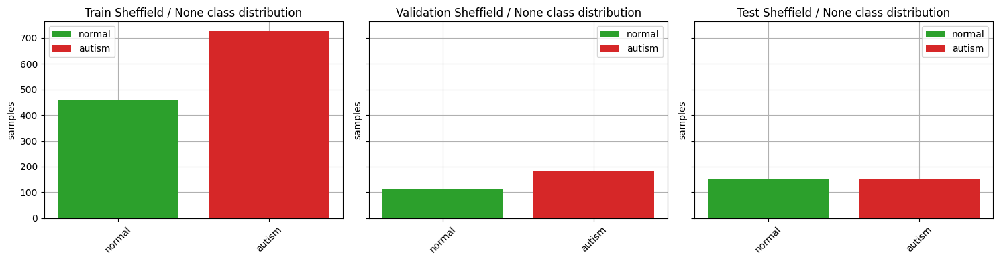

C:\Users\Anna\AppData\Local\Temp\ipykernel_30812\1339573160.py:94: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all Axes decorations.
  fig.tight_layout()


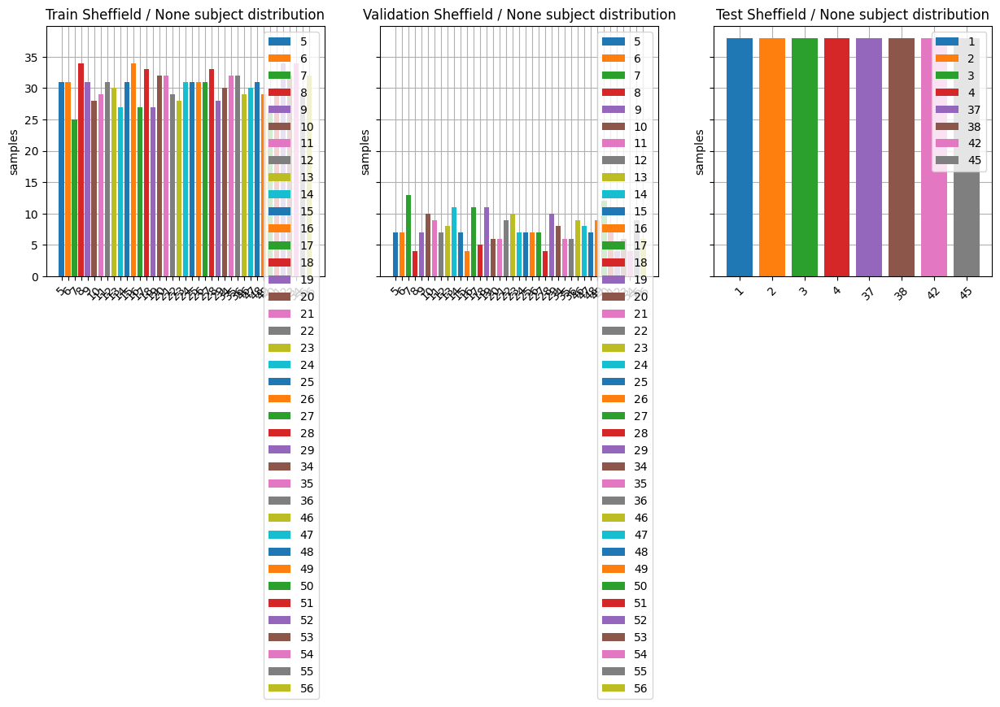


RUNNING EXPERIMENT: dataset=Sheffield | filter=None | band=None
Using cached dataset: windows_dataset_150_sheffield
SNR summary: {'mean_snr_db': 6.270104002763069, 'std_snr_db': 2.318552057748838, 'min_snr_db': -0.399445051457046, 'max_snr_db': 11.706359245746443, 'n_samples': 200.0}
Test split by subjects: [1, 2, 3, 4, 37, 38, 42, 45]
len(train_pool) = 1481
len(test_set) = 304
len(dataset) = 1785
unique groups in train_set: [ 5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23 24 25 26 27 28
 29 34 35 36 46 47 48 49 50 51 52 53 54 55 56]
n_unique_groups: 39
groups per label: {0: 15, 1: 24}
Validation fold label counts:
  fold #0: {0: 76, 1: 114}
  fold #1: {0: 76, 1: 114}
  fold #2: {0: 76, 1: 114}
  fold #3: {0: 76, 1: 114}
  fold #4: {0: 76, 1: 113}
  fold #5: {0: 76, 1: 114}
  fold #6: {0: 76, 1: 114}
  fold #7: {0: 38, 1: 114}
validated_n_splits = 8
cv_random_state = 42
CV method requested = StratifiedGroupKFold
n_train_total = 1481
n_test = 304
n_subject_or_recording_groups_

In [13]:
# Sheffield / No filtering
sheffield_none_options = experiment_options()

if RUN_ALL_EXPERIMENTS:
    if PLOT_BEFORE_EXPERIMENT:
        plot_results['sheffield_none'] = plot_experiment_dataset('Sheffield', None, sheffield_none_options)
    experiment_results['sheffield_none'] = run_experiment('Sheffield', None, sheffield_none_options)
else:
    print("Skipped Sheffield / No filtering. Set RUN_ALL_EXPERIMENTS = True to run this cell.")


### Sheffield / Butterworth



------------------------------------------------------------------------------------------
PLOTTING: Sheffield / Butterworth
------------------------------------------------------------------------------------------
Using cached dataset: windows_dataset_butterworth_sheffield
n_channels = 19
input_window_samples = 1000
ch_names = ['Fp1', 'Fp2', 'F7', 'F3', 'Fz', 'F4', 'F8', 'T7', 'C3', 'Cz', 'C4', 'T8', 'P7', 'P3', 'Pz', 'P4', 'P8', 'O1', 'O2']
Loading data for 1 events and 1000 original time points ...


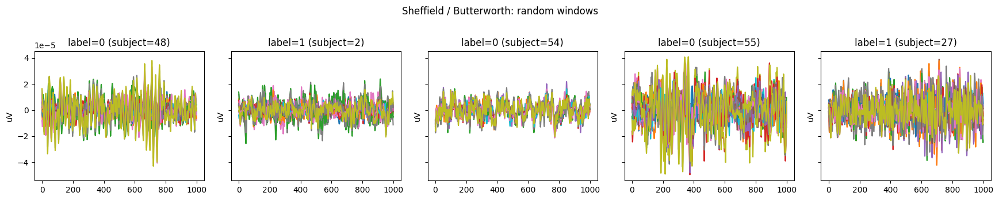

Test split by subjects: [1, 2, 3, 4, 37, 38, 42, 45]
len(train_pool) = 1481
len(test_set) = 304
len(dataset) = 1785
len(train_set) = 1185
len(validation_set) = 296
len(test_set) = 304
Loading data for 1 events and 1000 original time points ...


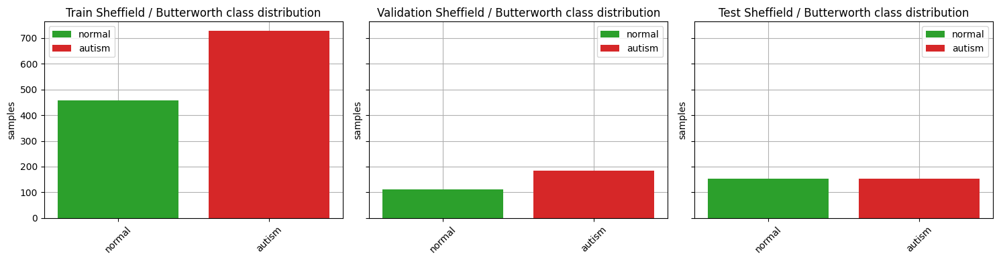

C:\Users\Anna\AppData\Local\Temp\ipykernel_20876\1339573160.py:94: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all Axes decorations.
  fig.tight_layout()


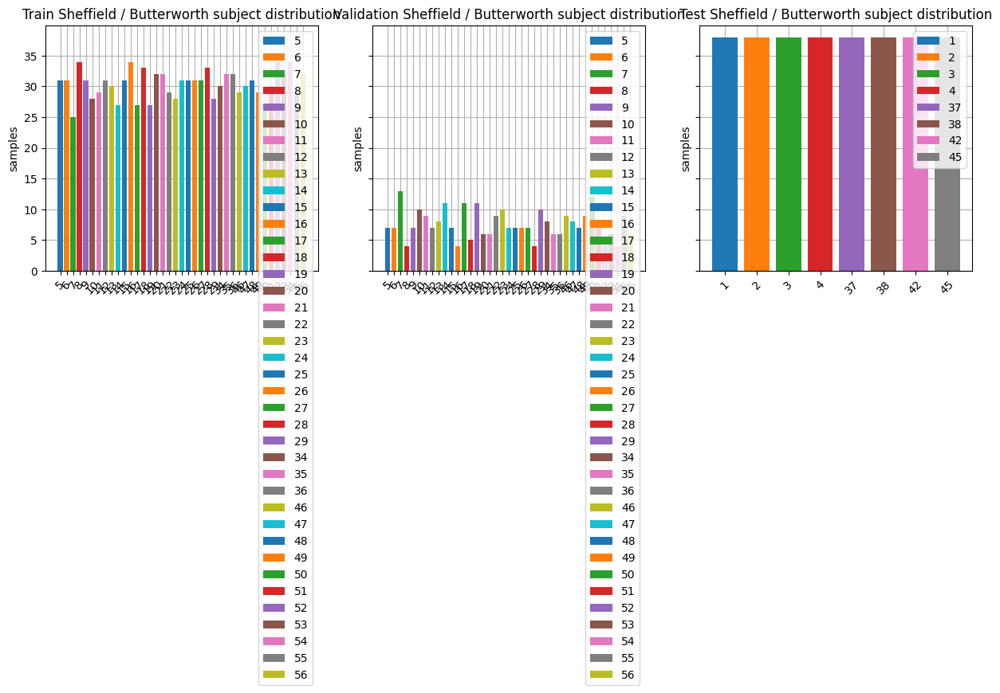


RUNNING EXPERIMENT: dataset=Sheffield | filter=Butterworth | band=None
Using cached dataset: windows_dataset_butterworth_sheffield
Test split by subjects: [1, 2, 3, 4, 37, 38, 42, 45]
len(train_pool) = 1481
len(test_set) = 304
len(dataset) = 1785
unique groups in train_set: [ 5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23 24 25 26 27 28
 29 34 35 36 46 47 48 49 50 51 52 53 54 55 56]
n_unique_groups: 39
groups per label: {0: 15, 1: 24}
Validation fold label counts:
  fold #0: {0: 76, 1: 114}
  fold #1: {0: 76, 1: 114}
  fold #2: {0: 76, 1: 114}
  fold #3: {0: 76, 1: 114}
  fold #4: {0: 76, 1: 113}
  fold #5: {0: 76, 1: 114}
  fold #6: {0: 76, 1: 114}
  fold #7: {0: 38, 1: 114}
validated_n_splits = 8
cv_random_state = 42
CV method requested = StratifiedGroupKFold
n_train_total = 1481
n_test = 304
n_subject_or_recording_groups_in_train = 39
n_channels = 19
input_window_samples = 1000

================ Sheffield_Butterworth | FOLD 0 ================


[CV fold 0] Epoch 2
train: t

In [11]:
# Sheffield / Butterworth
sheffield_butterworth_options = experiment_options()

if RUN_ALL_EXPERIMENTS:
    if PLOT_BEFORE_EXPERIMENT:
        plot_results['sheffield_butterworth'] = plot_experiment_dataset('Sheffield', 'Butterworth', sheffield_butterworth_options)
    experiment_results['sheffield_butterworth'] = run_experiment('Sheffield', 'Butterworth', sheffield_butterworth_options)
else:
    print("Skipped Sheffield / Butterworth. Set RUN_ALL_EXPERIMENTS = True to run this cell.")


### Signal Quality / Sheffield / Butterworth


In [10]:
# Direct Sheffield Butterworth quality check

sheffield_butterworth_options = experiment_options()
sheffield_butterworth_options["quality_max_samples"] = 200

sheffield_butterworth_dataset = load_experiment_dataset(
    "Sheffield",
    "Butterworth",
    sheffield_butterworth_options,
)

sheffield_original_options = dict(sheffield_butterworth_options)
sheffield_original_options["band"] = None

sheffield_original_dataset = load_experiment_dataset(
    "Sheffield",
    None,
    sheffield_original_options,
)

mse_values = []
snr_values = []

eps = 1e-12
max_samples = 200

for idx in range(min(len(sheffield_original_dataset), len(sheffield_butterworth_dataset), max_samples)):
    before_item = sheffield_original_dataset[idx]
    after_item = sheffield_butterworth_dataset[idx]

    x_before = before_item[0] if isinstance(before_item, tuple) else before_item
    x_after = after_item[0] if isinstance(after_item, tuple) else after_item

    x_before = np.asarray(x_before, dtype=np.float64)
    x_after = np.asarray(x_after, dtype=np.float64)

    min_ch = min(x_before.shape[0], x_after.shape[0])
    min_t = min(x_before.shape[1], x_after.shape[1])

    x_before = x_before[:min_ch, :min_t]
    x_after = x_after[:min_ch, :min_t]

    diff = x_before - x_after

    mse = np.mean(diff ** 2)
    signal_power = np.mean(x_before ** 2)
    noise_power = np.mean(diff ** 2)

    snr_db = 10.0 * np.log10((signal_power + eps) / (noise_power + eps))

    mse_values.append(float(mse))
    snr_values.append(float(snr_db))

    if idx < 5:
        print(f"\nWindow {idx}")
        print("mean abs diff:", np.mean(np.abs(diff)))
        print("max abs diff:", np.max(np.abs(diff)))
        print("mse:", mse)
        print("signal power:", signal_power)
        print("noise power:", noise_power)
        print("snr:", snr_db)
        print("exactly equal:", np.array_equal(x_before, x_after))
        print("all close:", np.allclose(x_before, x_after))

mse_summary = {
    "mean_mse": float(np.mean(mse_values)),
    "std_mse": float(np.std(mse_values)),
    "min_mse": float(np.min(mse_values)),
    "max_mse": float(np.max(mse_values)),
    "n_samples": float(len(mse_values)),
}

snr_summary = {
    "mean_snr_db": float(np.mean(snr_values)),
    "std_snr_db": float(np.std(snr_values)),
    "min_snr_db": float(np.min(snr_values)),
    "max_snr_db": float(np.max(snr_values)),
    "n_samples": float(len(snr_values)),
}

print("\nMSE summary:", mse_summary)
print("SNR summary:", snr_summary)

Loading dataset from: windows_dataset_butterworth_sheffield
Reading c:\diploma\diploma_code\kpi_solution\asd\windows_dataset_butterworth_sheffield\0\0-epo.fif ...
    Found the data of interest:
        t =       0.00 ...    3996.00 ms
        0 CTF compensation matrices available


Adding metadata with 4 columns
38 matching events found
No baseline correction applied
0 projection items activated
Reading c:\diploma\diploma_code\kpi_solution\asd\windows_dataset_butterworth_sheffield\1\1-epo.fif ...
    Found the data of interest:
        t =       0.00 ...    3996.00 ms
        0 CTF compensation matrices available
Adding metadata with 4 columns
38 matching events found
No baseline correction applied
0 projection items activated
Reading c:\diploma\diploma_code\kpi_solution\asd\windows_dataset_butterworth_sheffield\2\2-epo.fif ...
    Found the data of interest:
        t =       0.00 ...    3996.00 ms
        0 CTF compensation matrices available
Adding metadata with 4 columns
38 matching events found
No baseline correction applied
0 projection items activated
Reading c:\diploma\diploma_code\kpi_solution\asd\windows_dataset_butterworth_sheffield\3\3-epo.fif ...
    Found the data of interest:
        t =       0.00 ...    3996.00 ms
        0 CTF compensation matri

### Sheffield / ICA



------------------------------------------------------------------------------------------
PLOTTING: Sheffield / ICA
------------------------------------------------------------------------------------------
Loading dataset from: windows_dataset_sheffield_ica
Reading c:\diploma\diploma_code\kpi_solution\asd\windows_dataset_sheffield_ica\0\0-epo.fif ...
    Found the data of interest:
        t =       0.00 ...    3996.00 ms
        0 CTF compensation matrices available
Adding metadata with 4 columns
38 matching events found
No baseline correction applied
0 projection items activated
Reading c:\diploma\diploma_code\kpi_solution\asd\windows_dataset_sheffield_ica\1\1-epo.fif ...
    Found the data of interest:
        t =       0.00 ...    3996.00 ms
        0 CTF compensation matrices available
Adding metadata with 4 columns
38 matching events found
No baseline correction applied
0 projection items activated
Reading c:\diploma\diploma_code\kpi_solution\asd\windows_dataset_sheffield_ica\

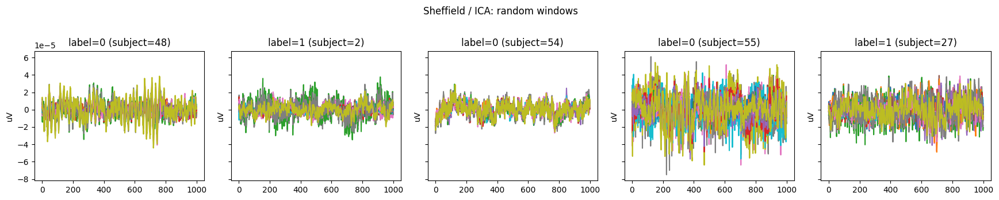

Test split by subjects: [1, 2, 3, 4, 37, 38, 42, 45]
len(train_pool) = 1481
len(test_set) = 304
len(dataset) = 1785
len(train_set) = 1185
len(validation_set) = 296
len(test_set) = 304
Loading data for 1 events and 1000 original time points ...


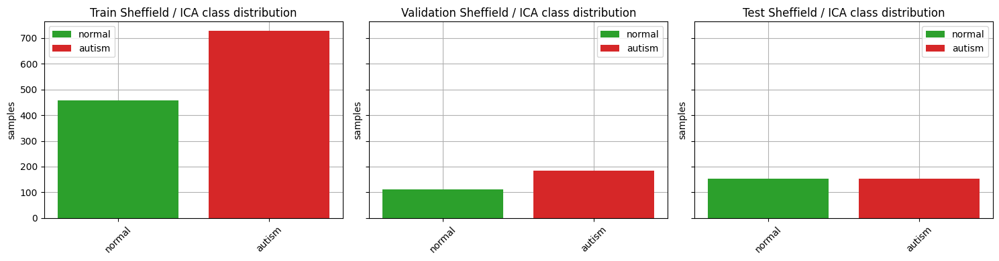

C:\Users\Anna\AppData\Local\Temp\ipykernel_30812\1339573160.py:94: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all Axes decorations.
  fig.tight_layout()


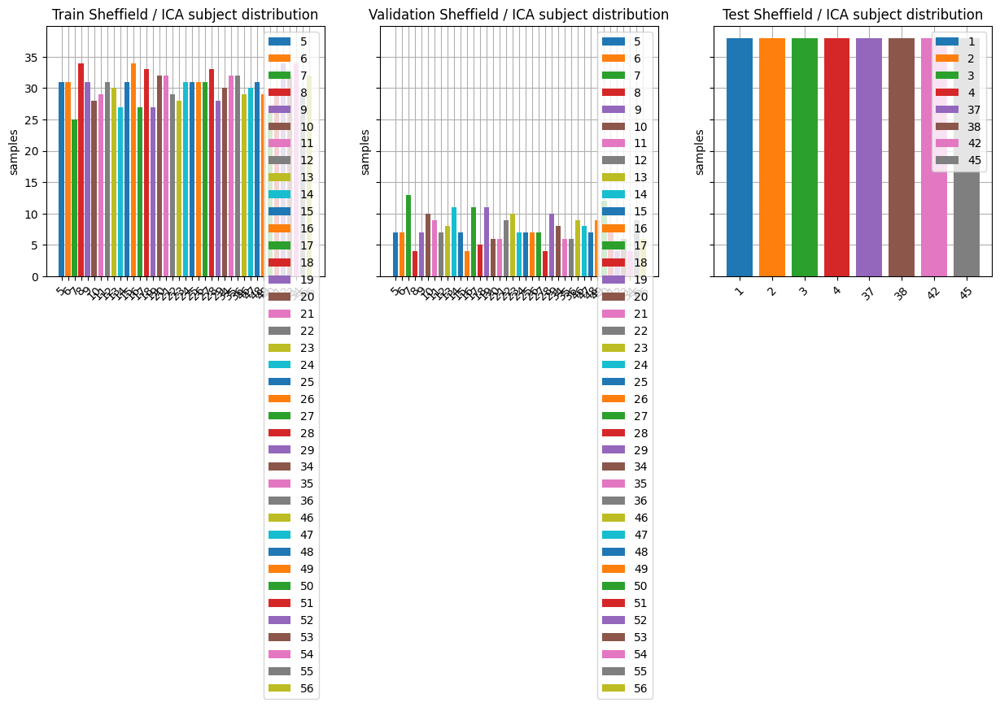


RUNNING EXPERIMENT: dataset=Sheffield | filter=ICA | band=None
Using cached dataset: windows_dataset_sheffield_ica

Loading matching unfiltered dataset for SNR/MSE comparison...
Using cached dataset: windows_dataset_150_sheffield
MSE before/after filtering: {'mean_mse': 1.1650465711709424e-11, 'std_mse': 1.9270999664517972e-11, 'min_mse': 5.246769135919002e-13, 'max_mse': 1.401450973939893e-10, 'n_samples': 200.0, 'skipped': 0.0}
SNR summary: {'mean_snr_db': 10.847080873927307, 'std_snr_db': 5.028657016536068, 'min_snr_db': -4.430118663542223, 'max_snr_db': 20.96461788929636, 'n_samples': 200.0}
Test split by subjects: [1, 2, 3, 4, 37, 38, 42, 45]
len(train_pool) = 1481
len(test_set) = 304
len(dataset) = 1785
unique groups in train_set: [ 5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23 24 25 26 27 28
 29 34 35 36 46 47 48 49 50 51 52 53 54 55 56]
n_unique_groups: 39
groups per label: {0: 15, 1: 24}
Validation fold label counts:
  fold #0: {0: 76, 1: 114}
  fold #1: {0: 76, 1: 

In [15]:
# Sheffield / ICA
sheffield_ica_options = experiment_options()

if RUN_ALL_EXPERIMENTS:
    if PLOT_BEFORE_EXPERIMENT:
        plot_results['sheffield_ica'] = plot_experiment_dataset('Sheffield', 'ICA', sheffield_ica_options)
    experiment_results['sheffield_ica'] = run_experiment('Sheffield', 'ICA', sheffield_ica_options)
else:
    print("Skipped Sheffield / ICA. Set RUN_ALL_EXPERIMENTS = True to run this cell.")


### Signal Quality / Sheffield / ICA


In [12]:
# Signal quality / Sheffield / ICA
sheffield_ica_options = experiment_options()
signal_quality_results['sheffield_ica'] = calculate_experiment_quality_metrics(
    'Sheffield',
    'ICA',
    sheffield_ica_options,
)


Loading dataset from: windows_dataset_sheffield_ica
Reading c:\diploma\diploma_code\kpi_solution\asd\windows_dataset_sheffield_ica\0\0-epo.fif ...
    Found the data of interest:
        t =       0.00 ...    3996.00 ms
        0 CTF compensation matrices available
Adding metadata with 4 columns
38 matching events found
No baseline correction applied
0 projection items activated
Reading c:\diploma\diploma_code\kpi_solution\asd\windows_dataset_sheffield_ica\1\1-epo.fif ...
    Found the data of interest:
        t =       0.00 ...    3996.00 ms
        0 CTF compensation matrices available
Adding metadata with 4 columns
38 matching events found
No baseline correction applied
0 projection items activated
Reading c:\diploma\diploma_code\kpi_solution\asd\windows_dataset_sheffield_ica\2\2-epo.fif ...
    Found the data of interest:
        t =       0.00 ...    3996.00 ms
        0 CTF compensation matrices available
Adding metadata with 4 columns
38 matching events found
No baseline correc

### Sheffield / DWT / alpha



------------------------------------------------------------------------------------------
PLOTTING: Sheffield / DWT / alpha
------------------------------------------------------------------------------------------
Loading dataset from: windows_dataset_alpha_dwt_sheffield
Reading c:\diploma\diploma_code\kpi_solution\asd\windows_dataset_alpha_dwt_sheffield\0\0-epo.fif ...
    Found the data of interest:
        t =       0.00 ...    3996.00 ms
        0 CTF compensation matrices available
Adding metadata with 4 columns
38 matching events found
No baseline correction applied
0 projection items activated
Reading c:\diploma\diploma_code\kpi_solution\asd\windows_dataset_alpha_dwt_sheffield\1\1-epo.fif ...
    Found the data of interest:
        t =       0.00 ...    3996.00 ms
        0 CTF compensation matrices available
Adding metadata with 4 columns
38 matching events found
No baseline correction applied
0 projection items activated
Reading c:\diploma\diploma_code\kpi_solution\asd\wind

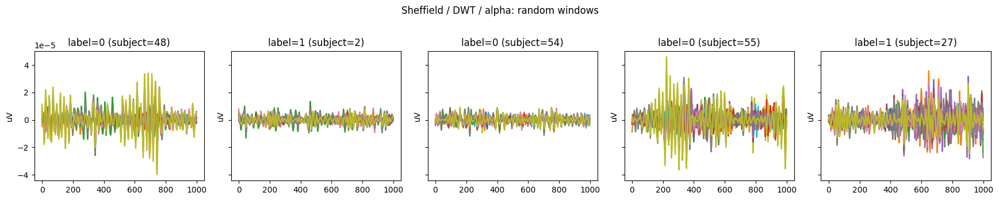

Test split by subjects: [1, 2, 3, 4, 37, 38, 42, 45]
len(train_pool) = 1481
len(test_set) = 304
len(dataset) = 1785
len(train_set) = 1185
len(validation_set) = 296
len(test_set) = 304
Loading data for 1 events and 1000 original time points ...


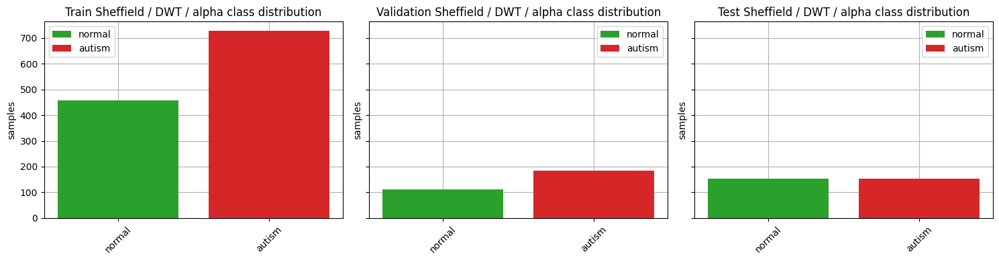

C:\Users\Anna\AppData\Local\Temp\ipykernel_30812\1339573160.py:94: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all Axes decorations.
  fig.tight_layout()


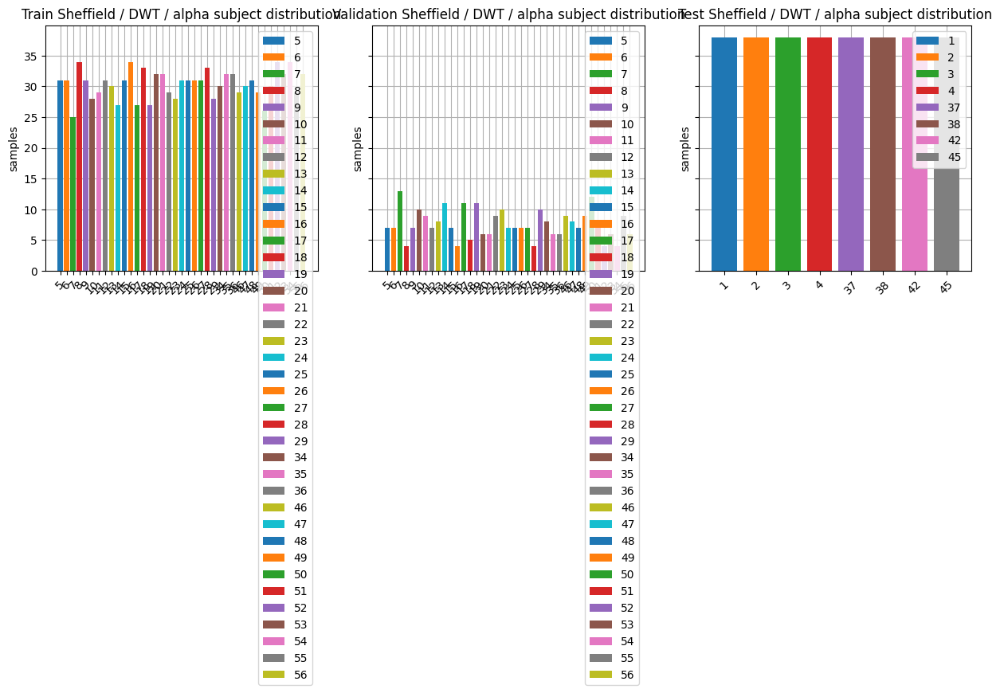


RUNNING EXPERIMENT: dataset=Sheffield | filter=DWT | band=alpha
Using cached dataset: windows_dataset_alpha_dwt_sheffield

Loading matching unfiltered dataset for SNR/MSE comparison...
Using cached dataset: windows_dataset_150_sheffield
MSE before/after filtering: {'mean_mse': 8.542299981084941e-11, 'std_mse': 5.6958656153882254e-11, 'min_mse': 2.7766258935088398e-11, 'max_mse': 6.049707040467435e-10, 'n_samples': 200.0, 'skipped': 0.0}
SNR summary: {'mean_snr_db': -5.699761775122802, 'std_snr_db': 3.480257821029632, 'min_snr_db': -15.580827167169272, 'max_snr_db': 2.9870079462359755, 'n_samples': 200.0}
Test split by subjects: [1, 2, 3, 4, 37, 38, 42, 45]
len(train_pool) = 1481
len(test_set) = 304
len(dataset) = 1785
unique groups in train_set: [ 5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23 24 25 26 27 28
 29 34 35 36 46 47 48 49 50 51 52 53 54 55 56]
n_unique_groups: 39
groups per label: {0: 15, 1: 24}
Validation fold label counts:
  fold #0: {0: 76, 1: 114}
  fold #1: {0

In [16]:
# Sheffield / DWT / alpha
sheffield_dwt_alpha_options = experiment_options(band='alpha')

if RUN_ALL_EXPERIMENTS:
    if PLOT_BEFORE_EXPERIMENT:
        plot_results['sheffield_dwt_alpha'] = plot_experiment_dataset('Sheffield', 'DWT', sheffield_dwt_alpha_options)
    experiment_results['sheffield_dwt_alpha'] = run_experiment('Sheffield', 'DWT', sheffield_dwt_alpha_options)
else:
    print("Skipped Sheffield / DWT / alpha. Set RUN_ALL_EXPERIMENTS = True to run this cell.")


### Sheffield / DWT / beta



------------------------------------------------------------------------------------------
PLOTTING: Sheffield / DWT / beta
------------------------------------------------------------------------------------------
Loading dataset from: windows_dataset_beta_dwt_sheffield
Reading c:\diploma\diploma_code\kpi_solution\asd\windows_dataset_beta_dwt_sheffield\0\0-epo.fif ...
    Found the data of interest:
        t =       0.00 ...    3996.00 ms
        0 CTF compensation matrices available
Adding metadata with 4 columns
38 matching events found
No baseline correction applied
0 projection items activated
Reading c:\diploma\diploma_code\kpi_solution\asd\windows_dataset_beta_dwt_sheffield\1\1-epo.fif ...
    Found the data of interest:
        t =       0.00 ...    3996.00 ms
        0 CTF compensation matrices available
Adding metadata with 4 columns
38 matching events found
No baseline correction applied
0 projection items activated
Reading c:\diploma\diploma_code\kpi_solution\asd\windows_

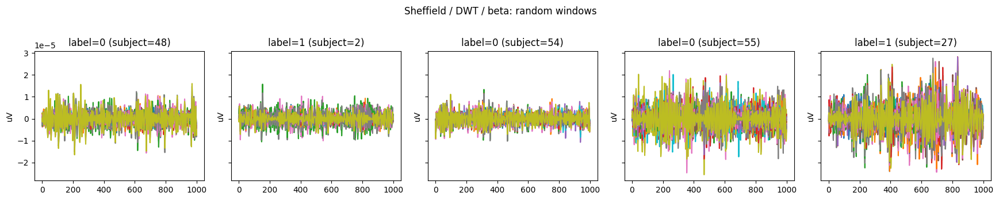

Test split by subjects: [1, 2, 3, 4, 37, 38, 42, 45]
len(train_pool) = 1481
len(test_set) = 304
len(dataset) = 1785
len(train_set) = 1185
len(validation_set) = 296
len(test_set) = 304
Loading data for 1 events and 1000 original time points ...


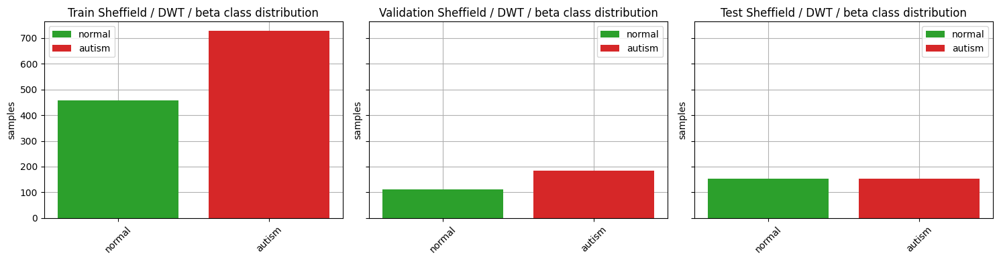

C:\Users\Anna\AppData\Local\Temp\ipykernel_30812\1339573160.py:94: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all Axes decorations.
  fig.tight_layout()


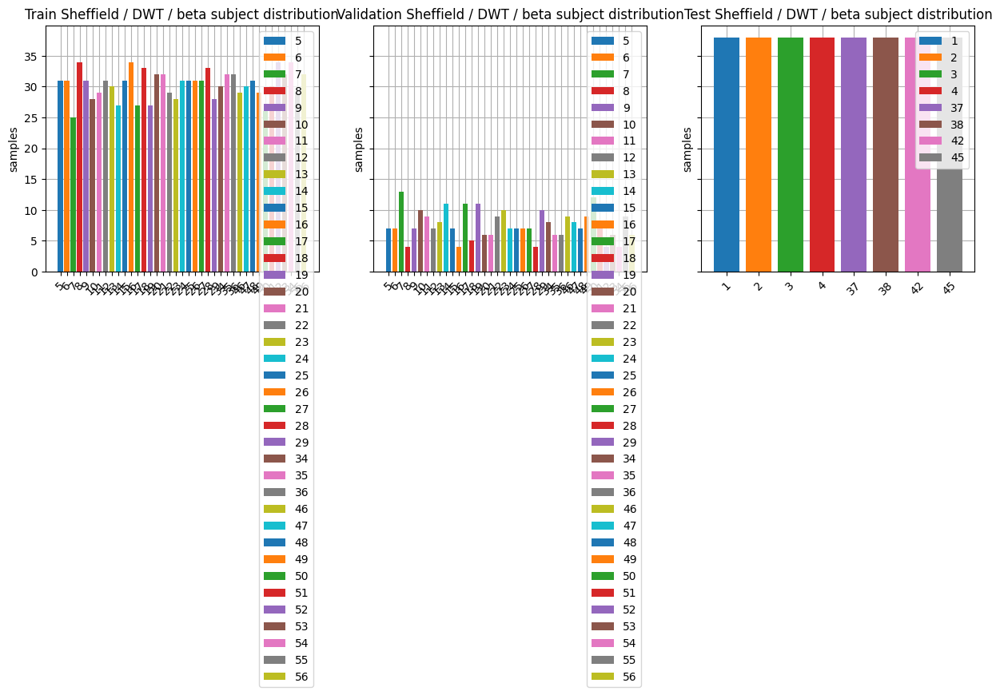


RUNNING EXPERIMENT: dataset=Sheffield | filter=DWT | band=beta
Using cached dataset: windows_dataset_beta_dwt_sheffield

Loading matching unfiltered dataset for SNR/MSE comparison...
Using cached dataset: windows_dataset_150_sheffield
MSE before/after filtering: {'mean_mse': 1.024317519354216e-10, 'std_mse': 6.089342754803784e-11, 'min_mse': 2.8386611357452508e-11, 'max_mse': 6.072555650760755e-10, 'n_samples': 200.0, 'skipped': 0.0}
SNR summary: {'mean_snr_db': -9.117652823290681, 'std_snr_db': 1.6268569579704175, 'min_snr_db': -16.192400105588806, 'max_snr_db': -4.696708959000161, 'n_samples': 200.0}
Test split by subjects: [1, 2, 3, 4, 37, 38, 42, 45]
len(train_pool) = 1481
len(test_set) = 304
len(dataset) = 1785
unique groups in train_set: [ 5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23 24 25 26 27 28
 29 34 35 36 46 47 48 49 50 51 52 53 54 55 56]
n_unique_groups: 39
groups per label: {0: 15, 1: 24}
Validation fold label counts:
  fold #0: {0: 76, 1: 114}
  fold #1: {0: 

In [17]:
# Sheffield / DWT / beta
sheffield_dwt_beta_options = experiment_options(band='beta')

if RUN_ALL_EXPERIMENTS:
    if PLOT_BEFORE_EXPERIMENT:
        plot_results['sheffield_dwt_beta'] = plot_experiment_dataset('Sheffield', 'DWT', sheffield_dwt_beta_options)
    experiment_results['sheffield_dwt_beta'] = run_experiment('Sheffield', 'DWT', sheffield_dwt_beta_options)
else:
    print("Skipped Sheffield / DWT / beta. Set RUN_ALL_EXPERIMENTS = True to run this cell.")


### Sheffield / DWT / theta



------------------------------------------------------------------------------------------
PLOTTING: Sheffield / DWT / theta
------------------------------------------------------------------------------------------
Loading dataset from: windows_dataset_theta_dwt_sheffield
Reading c:\diploma\diploma_code\kpi_solution\asd\windows_dataset_theta_dwt_sheffield\0\0-epo.fif ...
    Found the data of interest:
        t =       0.00 ...    3996.00 ms
        0 CTF compensation matrices available
Adding metadata with 4 columns
38 matching events found
No baseline correction applied
0 projection items activated
Reading c:\diploma\diploma_code\kpi_solution\asd\windows_dataset_theta_dwt_sheffield\1\1-epo.fif ...
    Found the data of interest:
        t =       0.00 ...    3996.00 ms
        0 CTF compensation matrices available
Adding metadata with 4 columns
38 matching events found
No baseline correction applied
0 projection items activated
Reading c:\diploma\diploma_code\kpi_solution\asd\wind

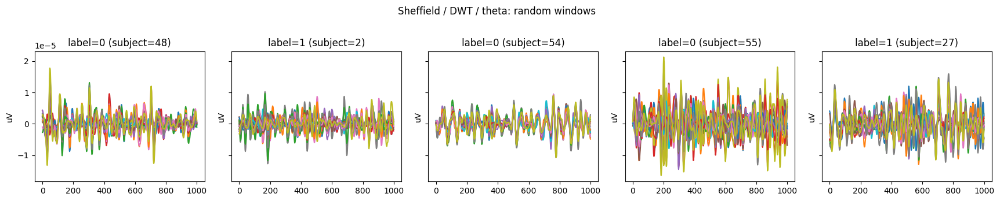

Test split by subjects: [1, 2, 3, 4, 37, 38, 42, 45]
len(train_pool) = 1481
len(test_set) = 304
len(dataset) = 1785
len(train_set) = 1185
len(validation_set) = 296
len(test_set) = 304
Loading data for 1 events and 1000 original time points ...


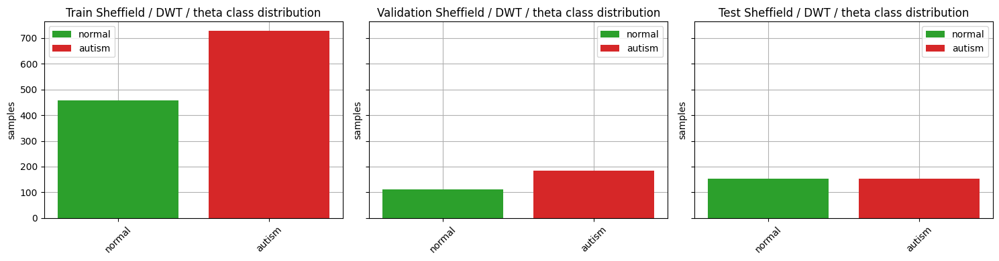

C:\Users\Anna\AppData\Local\Temp\ipykernel_21384\1339573160.py:94: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all Axes decorations.
  fig.tight_layout()


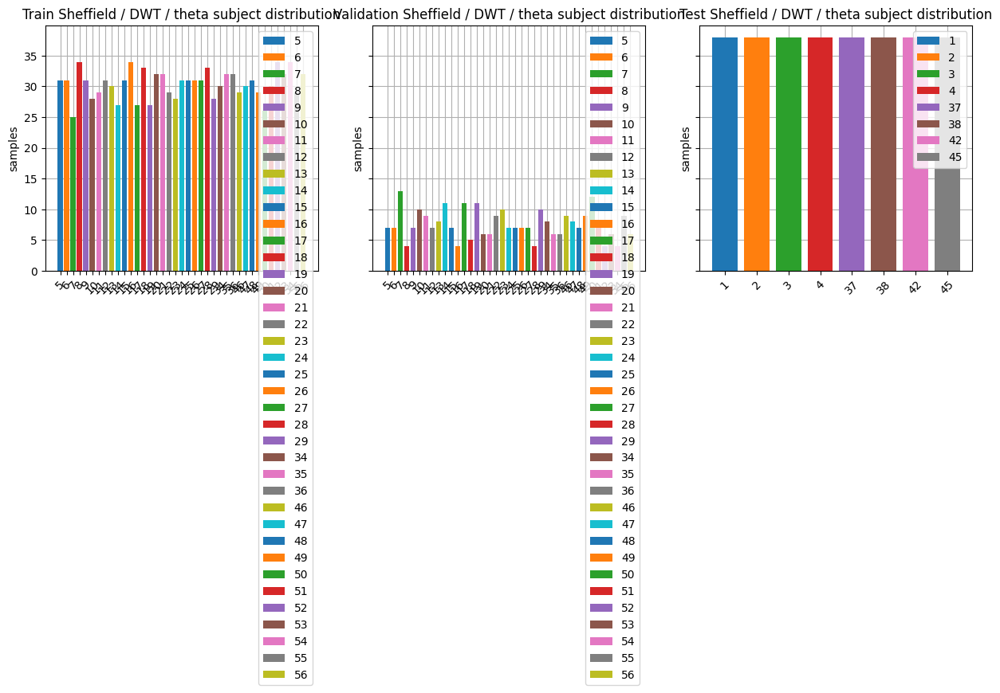


RUNNING EXPERIMENT: dataset=Sheffield | filter=DWT | band=theta
Using cached dataset: windows_dataset_theta_dwt_sheffield

Loading matching unfiltered dataset for SNR/MSE comparison...
Loading dataset from: windows_dataset_150_sheffield
Reading c:\diploma\diploma_code\kpi_solution\asd\windows_dataset_150_sheffield\0\0-epo.fif ...
    Found the data of interest:
        t =       0.00 ...    3996.00 ms
        0 CTF compensation matrices available
Adding metadata with 4 columns
38 matching events found
No baseline correction applied
0 projection items activated
Reading c:\diploma\diploma_code\kpi_solution\asd\windows_dataset_150_sheffield\1\1-epo.fif ...
    Found the data of interest:
        t =       0.00 ...    3996.00 ms
        0 CTF compensation matrices available
Adding metadata with 4 columns
38 matching events found
No baseline correction applied
0 projection items activated
Reading c:\diploma\diploma_code\kpi_solution\asd\windows_dataset_150_sheffield\2\2-epo.fif ...
    Fou

In [11]:
# Sheffield / DWT / theta
sheffield_dwt_theta_options = experiment_options(band='theta')

if RUN_ALL_EXPERIMENTS:
    if PLOT_BEFORE_EXPERIMENT:
        plot_results['sheffield_dwt_theta'] = plot_experiment_dataset('Sheffield', 'DWT', sheffield_dwt_theta_options)
    experiment_results['sheffield_dwt_theta'] = run_experiment('Sheffield', 'DWT', sheffield_dwt_theta_options)
else:
    print("Skipped Sheffield / DWT / theta. Set RUN_ALL_EXPERIMENTS = True to run this cell.")


### Sheffield / DWT / gamma



------------------------------------------------------------------------------------------
PLOTTING: Sheffield / DWT / gamma
------------------------------------------------------------------------------------------
Loading dataset from: windows_dataset_gamma_dwt_sheffield
Reading c:\diploma\diploma_code\kpi_solution\asd\windows_dataset_gamma_dwt_sheffield\0\0-epo.fif ...
    Found the data of interest:
        t =       0.00 ...    3996.00 ms
        0 CTF compensation matrices available
Adding metadata with 4 columns
38 matching events found
No baseline correction applied
0 projection items activated
Reading c:\diploma\diploma_code\kpi_solution\asd\windows_dataset_gamma_dwt_sheffield\1\1-epo.fif ...
    Found the data of interest:
        t =       0.00 ...    3996.00 ms
        0 CTF compensation matrices available
Adding metadata with 4 columns
38 matching events found
No baseline correction applied
0 projection items activated
Reading c:\diploma\diploma_code\kpi_solution\asd\wind

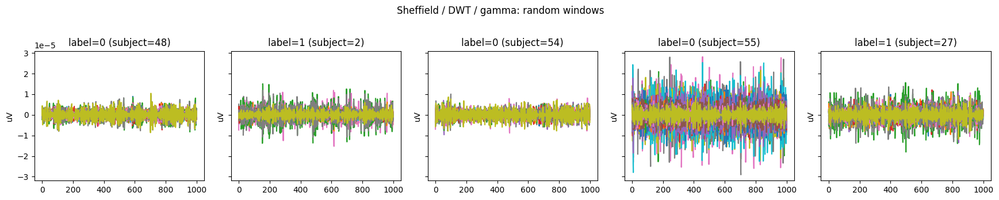

Test split by subjects: [1, 2, 3, 4, 37, 38, 42, 45]
len(train_pool) = 1481
len(test_set) = 304
len(dataset) = 1785
len(train_set) = 1185
len(validation_set) = 296
len(test_set) = 304
Loading data for 1 events and 1000 original time points ...


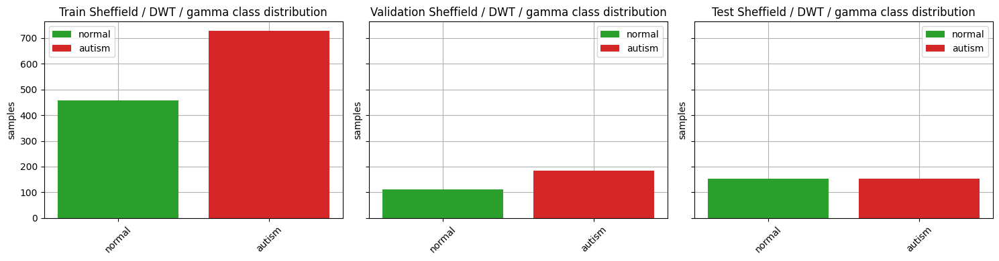

C:\Users\Anna\AppData\Local\Temp\ipykernel_21384\1339573160.py:94: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all Axes decorations.
  fig.tight_layout()


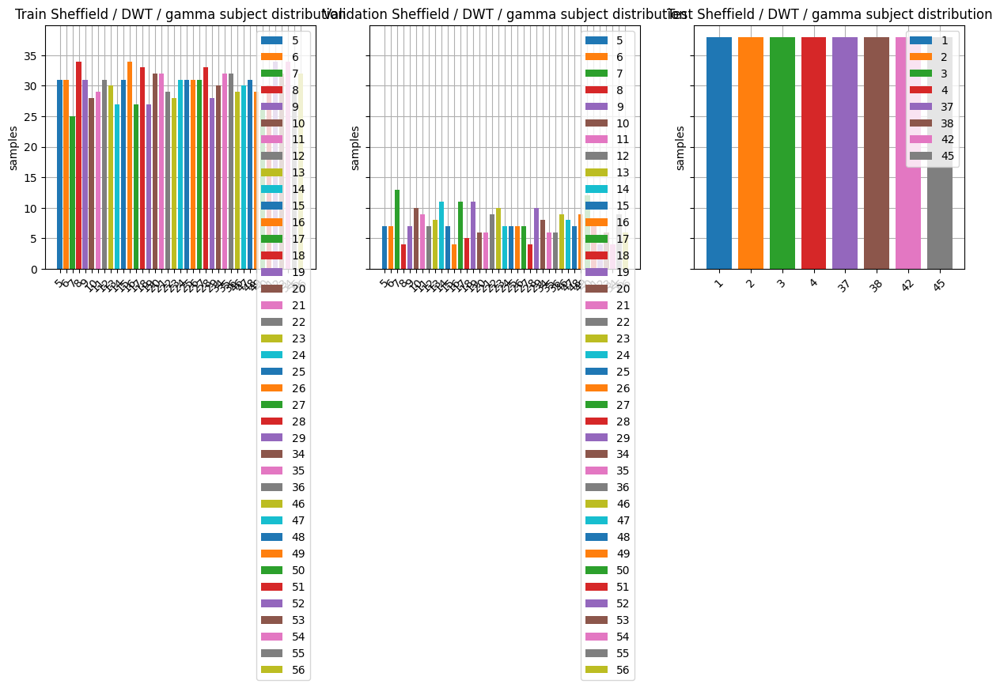


RUNNING EXPERIMENT: dataset=Sheffield | filter=DWT | band=gamma
Using cached dataset: windows_dataset_gamma_dwt_sheffield

Loading matching unfiltered dataset for SNR/MSE comparison...
Using cached dataset: windows_dataset_150_sheffield
MSE before/after filtering: {'mean_mse': 1.0803636311707971e-10, 'std_mse': 6.296456789978126e-11, 'min_mse': 2.8831073816739216e-11, 'max_mse': 6.053265983161672e-10, 'n_samples': 200.0, 'skipped': 0.0}
SNR summary: {'mean_snr_db': -11.639304780189981, 'std_snr_db': 2.2436263448175104, 'min_snr_db': -16.916042085098773, 'max_snr_db': -6.252356865528884, 'n_samples': 200.0}
Test split by subjects: [1, 2, 3, 4, 37, 38, 42, 45]
len(train_pool) = 1481
len(test_set) = 304
len(dataset) = 1785
unique groups in train_set: [ 5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23 24 25 26 27 28
 29 34 35 36 46 47 48 49 50 51 52 53 54 55 56]
n_unique_groups: 39
groups per label: {0: 15, 1: 24}
Validation fold label counts:
  fold #0: {0: 76, 1: 114}
  fold #1: 

In [12]:
# Sheffield / DWT / gamma
sheffield_dwt_gamma_options = experiment_options(band='gamma')

if RUN_ALL_EXPERIMENTS:
    if PLOT_BEFORE_EXPERIMENT:
        plot_results['sheffield_dwt_gamma'] = plot_experiment_dataset('Sheffield', 'DWT', sheffield_dwt_gamma_options)
    experiment_results['sheffield_dwt_gamma'] = run_experiment('Sheffield', 'DWT', sheffield_dwt_gamma_options)
else:
    print("Skipped Sheffield / DWT / gamma. Set RUN_ALL_EXPERIMENTS = True to run this cell.")


### Sheffield / DWT / delta



------------------------------------------------------------------------------------------
PLOTTING: Sheffield / DWT / delta
------------------------------------------------------------------------------------------
Loading dataset from: windows_dataset_delta_dwt_sheffield
Reading c:\diploma\diploma_code\kpi_solution\asd\windows_dataset_delta_dwt_sheffield\0\0-epo.fif ...
    Found the data of interest:
        t =       0.00 ...    3996.00 ms
        0 CTF compensation matrices available
Adding metadata with 4 columns
38 matching events found
No baseline correction applied
0 projection items activated
Reading c:\diploma\diploma_code\kpi_solution\asd\windows_dataset_delta_dwt_sheffield\1\1-epo.fif ...
    Found the data of interest:
        t =       0.00 ...    3996.00 ms
        0 CTF compensation matrices available
Adding metadata with 4 columns
38 matching events found
No baseline correction applied
0 projection items activated
Reading c:\diploma\diploma_code\kpi_solution\asd\wind

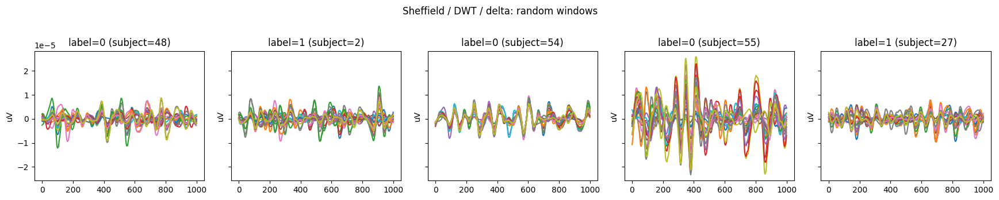

Test split by subjects: [1, 2, 3, 4, 37, 38, 42, 45]
len(train_pool) = 1481
len(test_set) = 304
len(dataset) = 1785
len(train_set) = 1185
len(validation_set) = 296
len(test_set) = 304
Loading data for 1 events and 1000 original time points ...


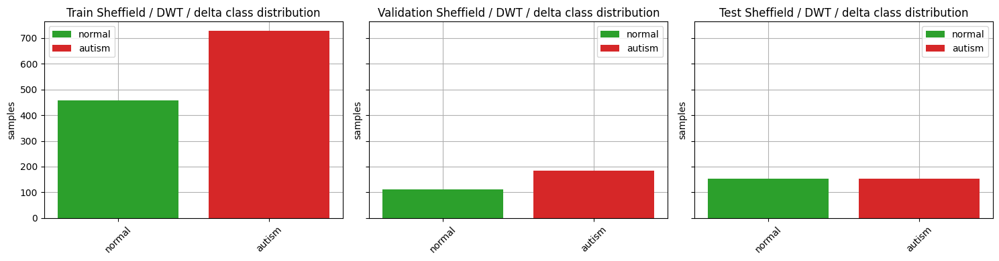

C:\Users\Anna\AppData\Local\Temp\ipykernel_21384\1339573160.py:94: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all Axes decorations.
  fig.tight_layout()


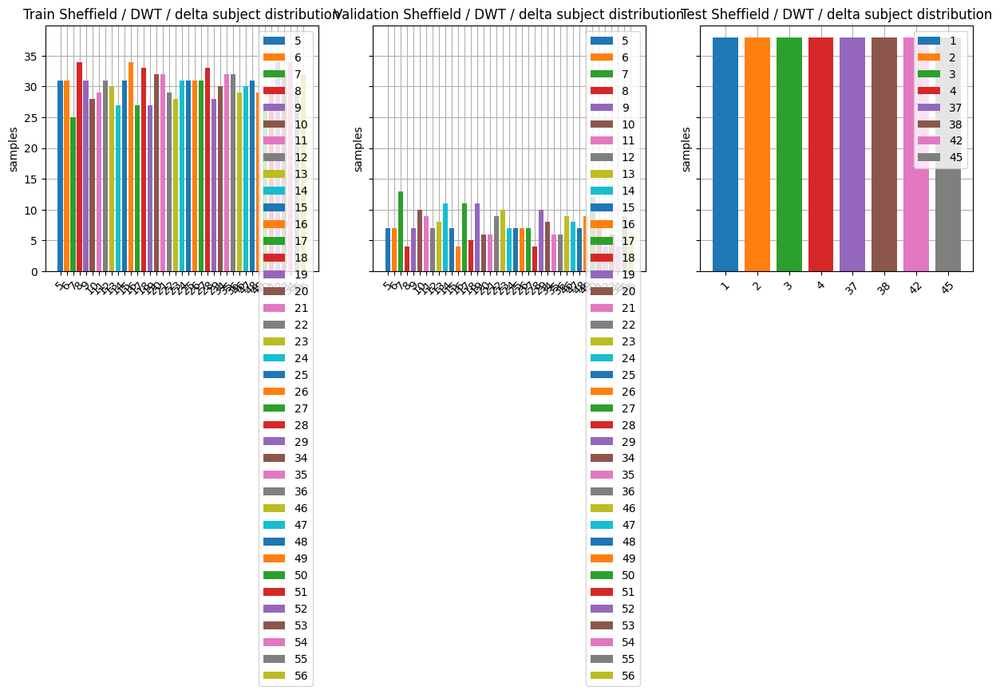


RUNNING EXPERIMENT: dataset=Sheffield | filter=DWT | band=delta
Using cached dataset: windows_dataset_delta_dwt_sheffield

Loading matching unfiltered dataset for SNR/MSE comparison...
Using cached dataset: windows_dataset_150_sheffield
MSE before/after filtering: {'mean_mse': 1.0088528283123499e-10, 'std_mse': 5.7299625226343e-11, 'min_mse': 2.8669369686552778e-11, 'max_mse': 5.626458753791029e-10, 'n_samples': 200.0, 'skipped': 0.0}
SNR summary: {'mean_snr_db': -8.843261337596632, 'std_snr_db': 2.044338124569246, 'min_snr_db': -13.470021094795497, 'max_snr_db': -3.6553273077183035, 'n_samples': 200.0}
Test split by subjects: [1, 2, 3, 4, 37, 38, 42, 45]
len(train_pool) = 1481
len(test_set) = 304
len(dataset) = 1785
unique groups in train_set: [ 5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23 24 25 26 27 28
 29 34 35 36 46 47 48 49 50 51 52 53 54 55 56]
n_unique_groups: 39
groups per label: {0: 15, 1: 24}
Validation fold label counts:
  fold #0: {0: 76, 1: 114}
  fold #1: {0:

In [13]:
# Sheffield / DWT / delta
sheffield_dwt_delta_options = experiment_options(band='delta')

if RUN_ALL_EXPERIMENTS:
    if PLOT_BEFORE_EXPERIMENT:
        plot_results['sheffield_dwt_delta'] = plot_experiment_dataset('Sheffield', 'DWT', sheffield_dwt_delta_options)
    experiment_results['sheffield_dwt_delta'] = run_experiment('Sheffield', 'DWT', sheffield_dwt_delta_options)
else:
    print("Skipped Sheffield / DWT / delta. Set RUN_ALL_EXPERIMENTS = True to run this cell.")


### Sheffield / DWT combined bands


------------------------------------------------------------------------------------------
PLOTTING: Sheffield / DWT_COMBINED
------------------------------------------------------------------------------------------
Loading dataset from: windows_dataset_dwt_combined_sheffield
Reading c:\diploma\diploma_code\kpi_solution\asd\windows_dataset_dwt_combined_sheffield\0\0-epo.fif ...
    Found the data of interest:
        t =       0.00 ...    3996.00 ms
        0 CTF compensation matrices available
Adding metadata with 4 columns
38 matching events found
No baseline correction applied
0 projection items activated
Reading c:\diploma\diploma_code\kpi_solution\asd\windows_dataset_dwt_combined_sheffield\1\1-epo.fif ...
    Found the data of interest:
        t =       0.00 ...    3996.00 ms
        0 CTF compensation matrices available
Adding metadata with 4 columns
37 matching events found
No baseline correction applied
0 projection items activated
Reading c:\diploma\diploma_code\kpi_solutio

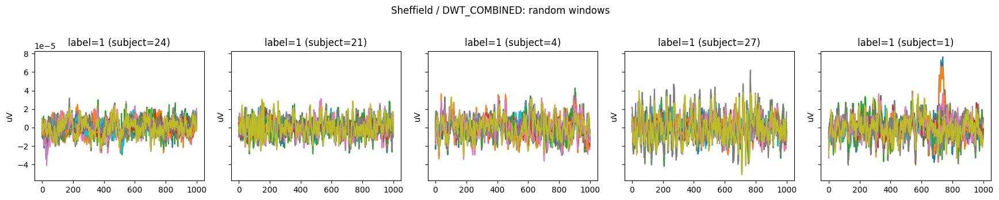

Test split by subjects: [1, 2, 3, 4, 37, 38, 42, 45]
len(train_pool) = 1476
len(test_set) = 302
len(dataset) = 1778
len(train_set) = 1181
len(validation_set) = 295
len(test_set) = 302
Loading data for 1 events and 1000 original time points ...


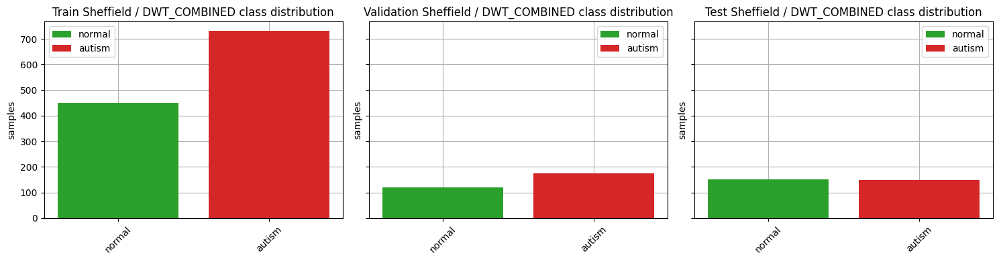

C:\Users\Anna\AppData\Local\Temp\ipykernel_20876\1339573160.py:94: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all Axes decorations.
  fig.tight_layout()


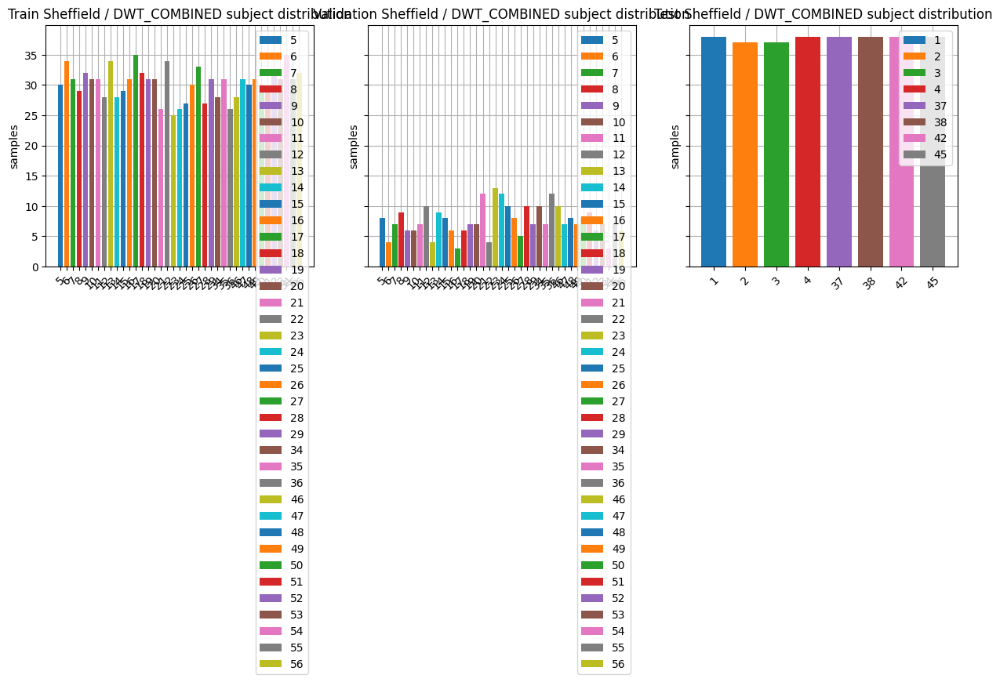


RUNNING EXPERIMENT: dataset=Sheffield | filter=DWT_COMBINED | band=None
Using cached dataset: windows_dataset_dwt_combined_sheffield
Test split by subjects: [1, 2, 3, 4, 37, 38, 42, 45]
len(train_pool) = 1476
len(test_set) = 302
len(dataset) = 1778
unique groups in train_set: [ 5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23 24 25 26 27 28
 29 34 35 36 46 47 48 49 50 51 52 53 54 55 56]
n_unique_groups: 39
groups per label: {0: 15, 1: 24}
Validation fold label counts:
  fold #0: {0: 76, 1: 113}
  fold #1: {0: 76, 1: 113}
  fold #2: {0: 76, 1: 113}
  fold #3: {0: 76, 1: 114}
  fold #4: {0: 38, 1: 114}
  fold #5: {0: 76, 1: 113}
  fold #6: {0: 76, 1: 113}
  fold #7: {0: 76, 1: 113}
validated_n_splits = 8
cv_random_state = 42
CV method requested = StratifiedGroupKFold
n_train_total = 1476
n_test = 302
n_subject_or_recording_groups_in_train = 39
n_channels = 19
input_window_samples = 1000

================ Sheffield_DWT_COMBINED | FOLD 0 ================


[CV fold 0] Epoch 2
train

In [26]:
# Sheffield / DWT combined bands
# Uses windows_dataset_dwt_combined_sheffield created in dataset_preprocessing.ipynb.
sheffield_dwt_combined_options = experiment_options(
    compute_quality_metrics=True,
    compare_to_unfiltered=True,
)

if RUN_ALL_EXPERIMENTS:
    if PLOT_BEFORE_EXPERIMENT:
        plot_results['sheffield_dwt_combined'] = plot_experiment_dataset(
            'Sheffield',
            'DWT_COMBINED',
            sheffield_dwt_combined_options,
        )
    experiment_results['sheffield_dwt_combined'] = run_experiment(
        'Sheffield',
        'DWT_COMBINED',
        sheffield_dwt_combined_options,
    )
else:
    print("Skipped Sheffield / DWT combined bands. Set RUN_ALL_EXPERIMENTS = True to run this cell.")


### Mixed / interpolation



------------------------------------------------------------------------------------------
PLOTTING: Mixed / None
------------------------------------------------------------------------------------------
Using cached dataset: windows_dataset_150
Using cached dataset: windows_dataset_150_sheffield
original base datasets kept: 27 / 27
sheffield base datasets kept: 47 / 47
original channels: 19 ['Fp1', 'Fp2', 'F7', 'F3', 'Fz', 'F4', 'F8', 'T7', 'C3', 'Cz', 'C4', 'T8', 'P7', 'P3', 'Pz', 'P4', 'P8', 'O1', 'O2']
sheffield channels: 19 ['Fp1', 'Fp2', 'F7', 'F3', 'Fz', 'F4', 'F8', 'T7', 'C3', 'Cz', 'C4', 'T8', 'P7', 'P3', 'Pz', 'P4', 'P8', 'O1', 'O2']
same channel order: True
same channel set: True
mixed n_base_datasets: 74
n_channels = 19
input_window_samples = 1000
ch_names = ['Fp1', 'Fp2', 'F7', 'F3', 'Fz', 'F4', 'F8', 'T7', 'C3', 'Cz', 'C4', 'T8', 'P7', 'P3', 'Pz', 'P4', 'P8', 'O1', 'O2']
Loading data for 1 events and 1000 original time points ...


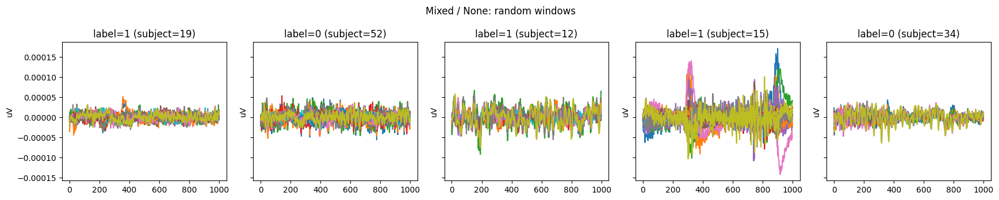

Test split by dataset row indexes: [0, 3, 51, 21, 22, 64, 70, 54, 67, 55]
len(train_pool) = 2432
len(test_set) = 379
len(dataset) = 2811
len(train_set) = 1946
len(validation_set) = 486
len(test_set) = 379
Loading data for 1 events and 1000 original time points ...


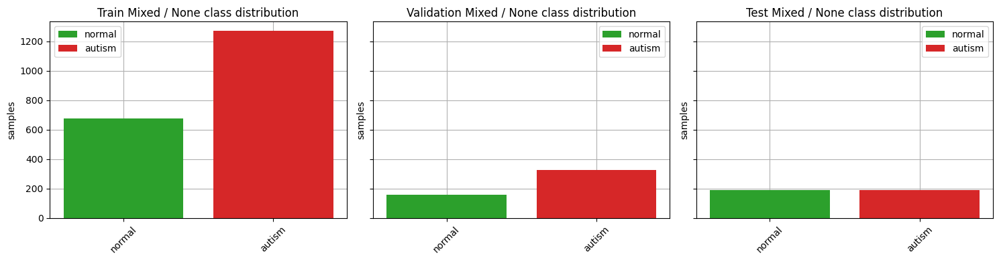

C:\Users\Anna\AppData\Local\Temp\ipykernel_30812\1339573160.py:94: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all Axes decorations.
  fig.tight_layout()


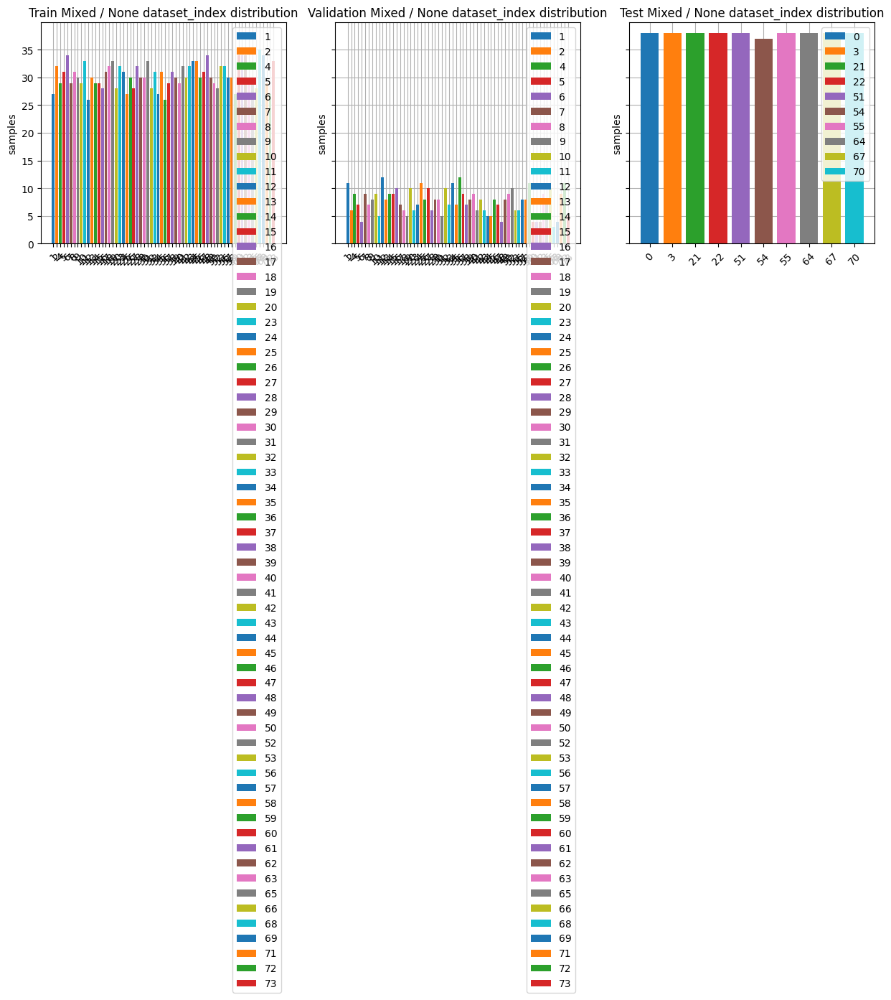


RUNNING EXPERIMENT: dataset=Mixed | filter=None | band=None
Using cached dataset: windows_dataset_150
Using cached dataset: windows_dataset_150_sheffield
original base datasets kept: 27 / 27
sheffield base datasets kept: 47 / 47
original channels: 19 ['Fp1', 'Fp2', 'F7', 'F3', 'Fz', 'F4', 'F8', 'T7', 'C3', 'Cz', 'C4', 'T8', 'P7', 'P3', 'Pz', 'P4', 'P8', 'O1', 'O2']
sheffield channels: 19 ['Fp1', 'Fp2', 'F7', 'F3', 'Fz', 'F4', 'F8', 'T7', 'C3', 'Cz', 'C4', 'T8', 'P7', 'P3', 'Pz', 'P4', 'P8', 'O1', 'O2']
same channel order: True
same channel set: True
mixed n_base_datasets: 74
SNR summary: {'mean_snr_db': 15.042218814053522, 'std_snr_db': 4.425627561927997, 'min_snr_db': 6.52418664081431, 'max_snr_db': 36.052724220440005, 'n_samples': 200.0}
Test split by dataset row indexes: [0, 3, 51, 21, 22, 64, 70, 54, 67, 55]
len(train_pool) = 2432
len(test_set) = 379
len(dataset) = 2811
unique groups in train_set: [ 1  2  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 23 24 25 26 27
 28 29 30 3

In [18]:
# Mixed / No filtering
mixed_none_options = experiment_options()

if RUN_ALL_EXPERIMENTS:
    if PLOT_BEFORE_EXPERIMENT:
        plot_results['mixed_none'] = plot_experiment_dataset('Mixed', None, mixed_none_options)
    experiment_results['mixed_none'] = run_experiment('Mixed', None, mixed_none_options)
else:
    print("Skipped Mixed / No filtering. Set RUN_ALL_EXPERIMENTS = True to run this cell.")


### Mixed / Butterworth



------------------------------------------------------------------------------------------
PLOTTING: Mixed / Butterworth
------------------------------------------------------------------------------------------
Loading dataset from: windows_dataset_butterworth
Reading c:\diploma\diploma_code\kpi_solution\asd\windows_dataset_butterworth\0\0-epo.fif ...
    Found the data of interest:
        t =       0.00 ...    3996.00 ms
        0 CTF compensation matrices available
Adding metadata with 4 columns
38 matching events found
No baseline correction applied
0 projection items activated
Reading c:\diploma\diploma_code\kpi_solution\asd\windows_dataset_butterworth\1\1-epo.fif ...
    Found the data of interest:
        t =       0.00 ...    3996.00 ms
        0 CTF compensation matrices available
Adding metadata with 4 columns
38 matching events found
No baseline correction applied
0 projection items activated
Reading c:\diploma\diploma_code\kpi_solution\asd\windows_dataset_butterworth\2\2-

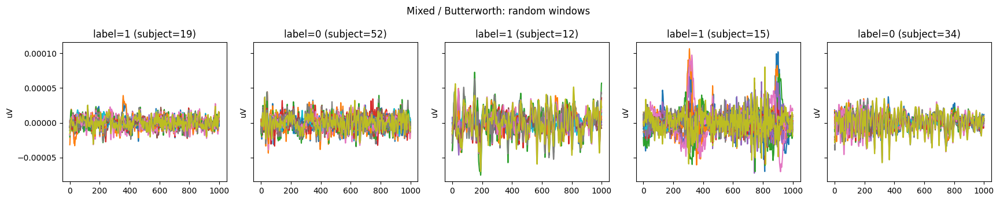

Test split by dataset row indexes: [0, 3, 51, 21, 22, 64, 70, 54, 67, 55]
len(train_pool) = 2432
len(test_set) = 379
len(dataset) = 2811
len(train_set) = 1946
len(validation_set) = 486
len(test_set) = 379
Loading data for 1 events and 1000 original time points ...


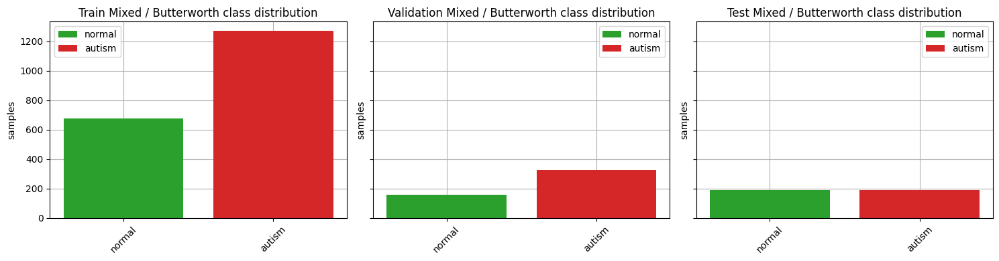

C:\Users\Anna\AppData\Local\Temp\ipykernel_20876\1339573160.py:94: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all Axes decorations.
  fig.tight_layout()


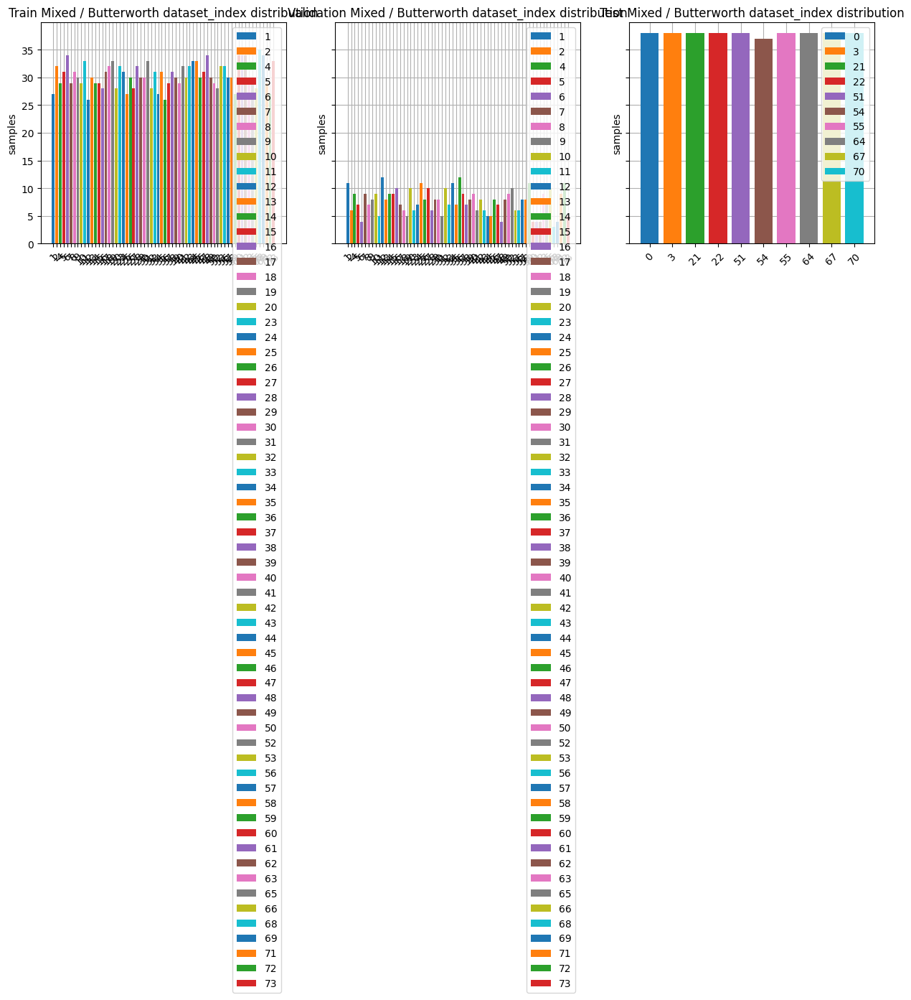


RUNNING EXPERIMENT: dataset=Mixed | filter=Butterworth | band=None
Using cached dataset: windows_dataset_butterworth
Using cached dataset: windows_dataset_butterworth_sheffield
original base datasets kept: 27 / 27
sheffield base datasets kept: 47 / 47
original channels: 19 ['Fp1', 'Fp2', 'F7', 'F3', 'Fz', 'F4', 'F8', 'T7', 'C3', 'Cz', 'C4', 'T8', 'P7', 'P3', 'Pz', 'P4', 'P8', 'O1', 'O2']
sheffield channels: 19 ['Fp1', 'Fp2', 'F7', 'F3', 'Fz', 'F4', 'F8', 'T7', 'C3', 'Cz', 'C4', 'T8', 'P7', 'P3', 'Pz', 'P4', 'P8', 'O1', 'O2']
same channel order: True
same channel set: True
mixed n_base_datasets: 74
Test split by dataset row indexes: [0, 3, 51, 21, 22, 64, 70, 54, 67, 55]
len(train_pool) = 2432
len(test_set) = 379
len(dataset) = 2811
unique groups in train_set: [ 1  2  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 23 24 25 26 27
 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47 48 49 50 52
 53 56 57 58 59 60 61 62 63 65 66 68 69 71 72 73]
n_unique_groups: 64
groups per la

In [12]:
# Mixed / Butterworth
mixed_butterworth_options = experiment_options()

if RUN_ALL_EXPERIMENTS:
    if PLOT_BEFORE_EXPERIMENT:
        plot_results['mixed_butterworth'] = plot_experiment_dataset('Mixed', 'Butterworth', mixed_butterworth_options)
    experiment_results['mixed_butterworth'] = run_experiment('Mixed', 'Butterworth', mixed_butterworth_options)
else:
    print("Skipped Mixed / Butterworth. Set RUN_ALL_EXPERIMENTS = True to run this cell.")


### Mixed / ICA



------------------------------------------------------------------------------------------
PLOTTING: Mixed / ICA
------------------------------------------------------------------------------------------
Using cached dataset: windows_dataset_original_ica
Using cached dataset: windows_dataset_sheffield_ica
original base datasets kept: 27 / 27
sheffield base datasets kept: 47 / 47
original channels: 19 ['Fp1', 'Fp2', 'F7', 'F3', 'Fz', 'F4', 'F8', 'T7', 'C3', 'Cz', 'C4', 'T8', 'P7', 'P3', 'Pz', 'P4', 'P8', 'O1', 'O2']
sheffield channels: 19 ['Fp1', 'Fp2', 'F7', 'F3', 'Fz', 'F4', 'F8', 'T7', 'C3', 'Cz', 'C4', 'T8', 'P7', 'P3', 'Pz', 'P4', 'P8', 'O1', 'O2']
same channel order: True
same channel set: True
mixed n_base_datasets: 74
n_channels = 19
input_window_samples = 1000
ch_names = ['Fp1', 'Fp2', 'F7', 'F3', 'Fz', 'F4', 'F8', 'T7', 'C3', 'Cz', 'C4', 'T8', 'P7', 'P3', 'Pz', 'P4', 'P8', 'O1', 'O2']
Loading data for 1 events and 1000 original time points ...


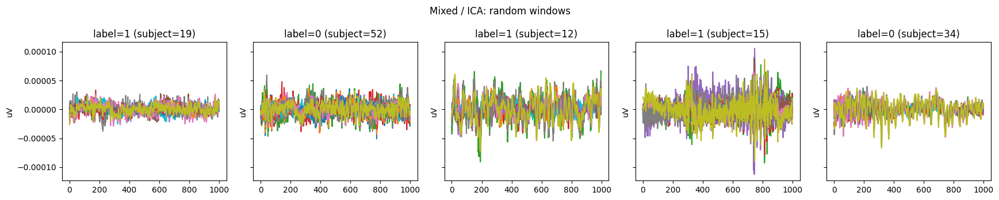

Test split by dataset row indexes: [0, 3, 51, 21, 22, 64, 70, 54, 67, 55]
len(train_pool) = 2432
len(test_set) = 379
len(dataset) = 2811
len(train_set) = 1946
len(validation_set) = 486
len(test_set) = 379
Loading data for 1 events and 1000 original time points ...


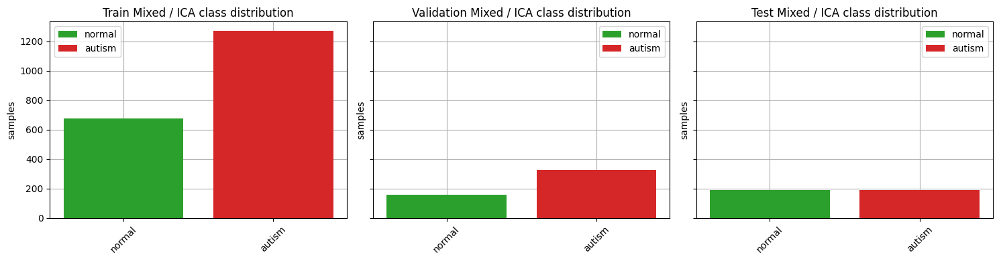

C:\Users\Anna\AppData\Local\Temp\ipykernel_30812\1339573160.py:94: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all Axes decorations.
  fig.tight_layout()


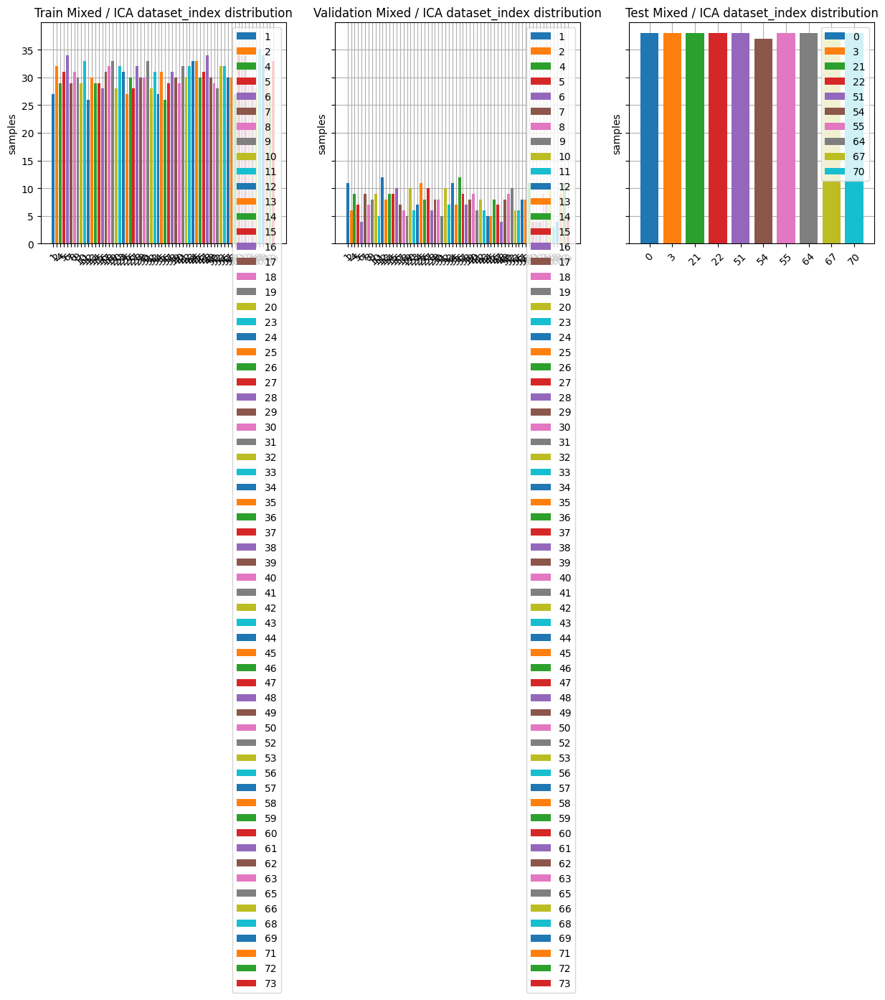


RUNNING EXPERIMENT: dataset=Mixed | filter=ICA | band=None
Using cached dataset: windows_dataset_original_ica
Using cached dataset: windows_dataset_sheffield_ica
original base datasets kept: 27 / 27
sheffield base datasets kept: 47 / 47
original channels: 19 ['Fp1', 'Fp2', 'F7', 'F3', 'Fz', 'F4', 'F8', 'T7', 'C3', 'Cz', 'C4', 'T8', 'P7', 'P3', 'Pz', 'P4', 'P8', 'O1', 'O2']
sheffield channels: 19 ['Fp1', 'Fp2', 'F7', 'F3', 'Fz', 'F4', 'F8', 'T7', 'C3', 'Cz', 'C4', 'T8', 'P7', 'P3', 'Pz', 'P4', 'P8', 'O1', 'O2']
same channel order: True
same channel set: True
mixed n_base_datasets: 74

Loading matching unfiltered dataset for SNR/MSE comparison...
Using cached dataset: windows_dataset_150
Using cached dataset: windows_dataset_150_sheffield
original base datasets kept: 27 / 27
sheffield base datasets kept: 47 / 47
original channels: 19 ['Fp1', 'Fp2', 'F7', 'F3', 'Fz', 'F4', 'F8', 'T7', 'C3', 'Cz', 'C4', 'T8', 'P7', 'P3', 'Pz', 'P4', 'P8', 'O1', 'O2']
sheffield channels: 19 ['Fp1', 'Fp2', 

In [20]:
# Mixed / ICA
mixed_ica_options = experiment_options()

if RUN_ALL_EXPERIMENTS:
    if PLOT_BEFORE_EXPERIMENT:
        plot_results['mixed_ica'] = plot_experiment_dataset('Mixed', 'ICA', mixed_ica_options)
    experiment_results['mixed_ica'] = run_experiment('Mixed', 'ICA', mixed_ica_options)
else:
    print("Skipped Mixed / ICA. Set RUN_ALL_EXPERIMENTS = True to run this cell.")


### Mixed / DWT / alpha



------------------------------------------------------------------------------------------
PLOTTING: Mixed / DWT / alpha
------------------------------------------------------------------------------------------
Using cached dataset: windows_dataset_alpha_dwt
Using cached dataset: windows_dataset_alpha_dwt_sheffield
original base datasets kept: 27 / 27
sheffield base datasets kept: 47 / 47
original channels: 19 ['Fp1', 'Fp2', 'F7', 'F3', 'Fz', 'F4', 'F8', 'T7', 'C3', 'Cz', 'C4', 'T8', 'P7', 'P3', 'Pz', 'P4', 'P8', 'O1', 'O2']
sheffield channels: 19 ['Fp1', 'Fp2', 'F7', 'F3', 'Fz', 'F4', 'F8', 'T7', 'C3', 'Cz', 'C4', 'T8', 'P7', 'P3', 'Pz', 'P4', 'P8', 'O1', 'O2']
same channel order: True
same channel set: True
mixed n_base_datasets: 74
n_channels = 19
input_window_samples = 1000
ch_names = ['Fp1', 'Fp2', 'F7', 'F3', 'Fz', 'F4', 'F8', 'T7', 'C3', 'Cz', 'C4', 'T8', 'P7', 'P3', 'Pz', 'P4', 'P8', 'O1', 'O2']
Loading data for 1 events and 1000 original time points ...


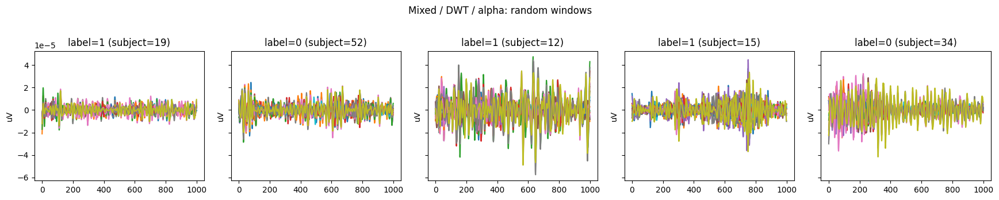

Test split by dataset row indexes: [0, 3, 51, 21, 22, 64, 70, 54, 67, 55]
len(train_pool) = 2432
len(test_set) = 379
len(dataset) = 2811
len(train_set) = 1946
len(validation_set) = 486
len(test_set) = 379
Loading data for 1 events and 1000 original time points ...


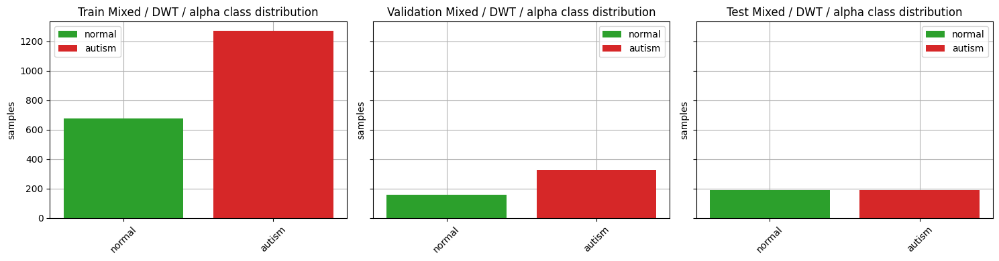

C:\Users\Anna\AppData\Local\Temp\ipykernel_30812\1339573160.py:94: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all Axes decorations.
  fig.tight_layout()


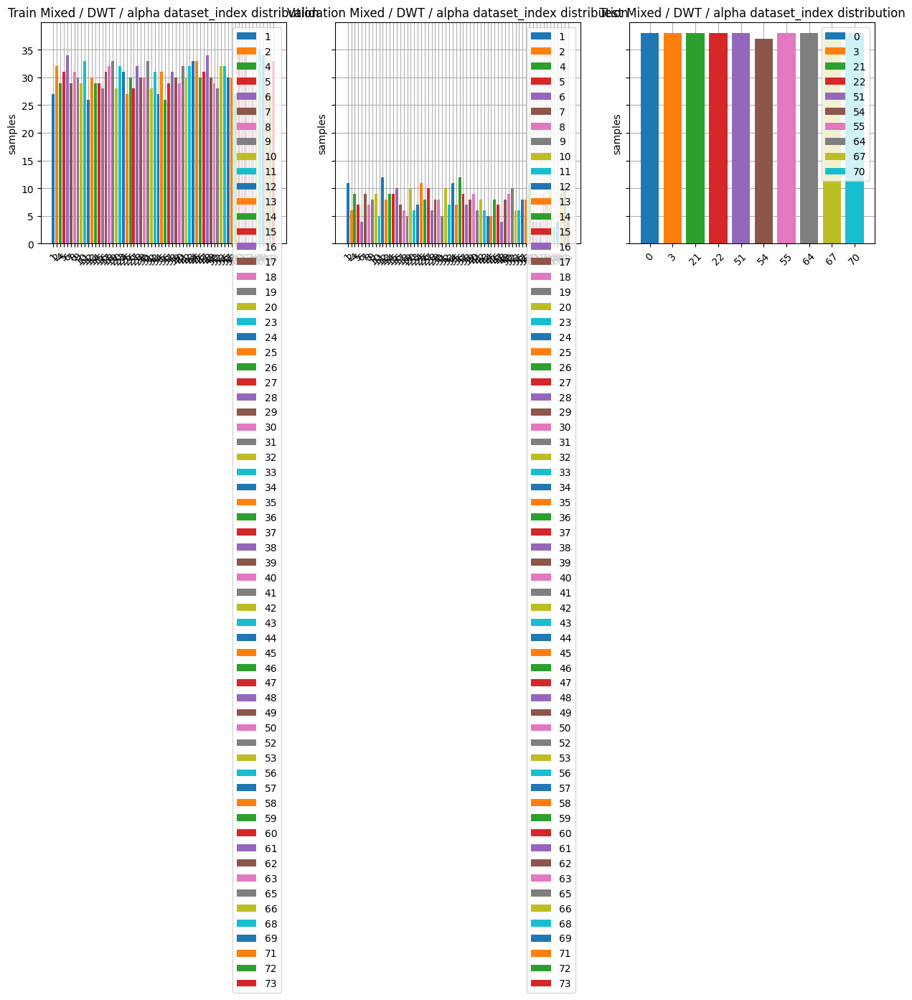


RUNNING EXPERIMENT: dataset=Mixed | filter=DWT | band=alpha
Using cached dataset: windows_dataset_alpha_dwt
Using cached dataset: windows_dataset_alpha_dwt_sheffield
original base datasets kept: 27 / 27
sheffield base datasets kept: 47 / 47
original channels: 19 ['Fp1', 'Fp2', 'F7', 'F3', 'Fz', 'F4', 'F8', 'T7', 'C3', 'Cz', 'C4', 'T8', 'P7', 'P3', 'Pz', 'P4', 'P8', 'O1', 'O2']
sheffield channels: 19 ['Fp1', 'Fp2', 'F7', 'F3', 'Fz', 'F4', 'F8', 'T7', 'C3', 'Cz', 'C4', 'T8', 'P7', 'P3', 'Pz', 'P4', 'P8', 'O1', 'O2']
same channel order: True
same channel set: True
mixed n_base_datasets: 74

Loading matching unfiltered dataset for SNR/MSE comparison...
Using cached dataset: windows_dataset_150
Using cached dataset: windows_dataset_150_sheffield
original base datasets kept: 27 / 27
sheffield base datasets kept: 47 / 47
original channels: 19 ['Fp1', 'Fp2', 'F7', 'F3', 'Fz', 'F4', 'F8', 'T7', 'C3', 'Cz', 'C4', 'T8', 'P7', 'P3', 'Pz', 'P4', 'P8', 'O1', 'O2']
sheffield channels: 19 ['Fp1', 'Fp

In [21]:
# Mixed / DWT / alpha
mixed_dwt_alpha_options = experiment_options(band='alpha')

if RUN_ALL_EXPERIMENTS:
    if PLOT_BEFORE_EXPERIMENT:
        plot_results['mixed_dwt_alpha'] = plot_experiment_dataset('Mixed', 'DWT', mixed_dwt_alpha_options)
    experiment_results['mixed_dwt_alpha'] = run_experiment('Mixed', 'DWT', mixed_dwt_alpha_options)
else:
    print("Skipped Mixed / DWT / alpha. Set RUN_ALL_EXPERIMENTS = True to run this cell.")


### Mixed / DWT / beta



------------------------------------------------------------------------------------------
PLOTTING: Mixed / DWT / beta
------------------------------------------------------------------------------------------
Using cached dataset: windows_dataset_beta_dwt
Using cached dataset: windows_dataset_beta_dwt_sheffield
original base datasets kept: 27 / 27
sheffield base datasets kept: 47 / 47
original channels: 19 ['Fp1', 'Fp2', 'F7', 'F3', 'Fz', 'F4', 'F8', 'T7', 'C3', 'Cz', 'C4', 'T8', 'P7', 'P3', 'Pz', 'P4', 'P8', 'O1', 'O2']
sheffield channels: 19 ['Fp1', 'Fp2', 'F7', 'F3', 'Fz', 'F4', 'F8', 'T7', 'C3', 'Cz', 'C4', 'T8', 'P7', 'P3', 'Pz', 'P4', 'P8', 'O1', 'O2']
same channel order: True
same channel set: True
mixed n_base_datasets: 74
n_channels = 19
input_window_samples = 1000
ch_names = ['Fp1', 'Fp2', 'F7', 'F3', 'Fz', 'F4', 'F8', 'T7', 'C3', 'Cz', 'C4', 'T8', 'P7', 'P3', 'Pz', 'P4', 'P8', 'O1', 'O2']
Loading data for 1 events and 1000 original time points ...


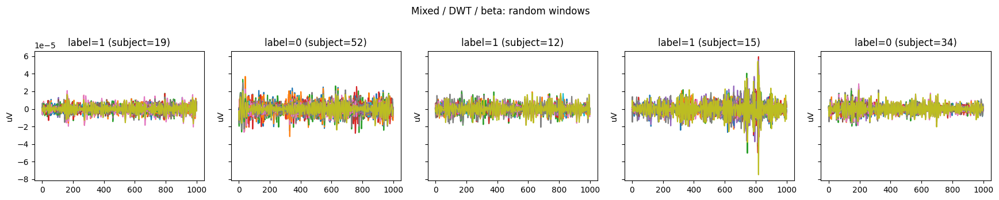

Test split by dataset row indexes: [0, 3, 51, 21, 22, 64, 70, 54, 67, 55]
len(train_pool) = 2432
len(test_set) = 379
len(dataset) = 2811
len(train_set) = 1946
len(validation_set) = 486
len(test_set) = 379
Loading data for 1 events and 1000 original time points ...


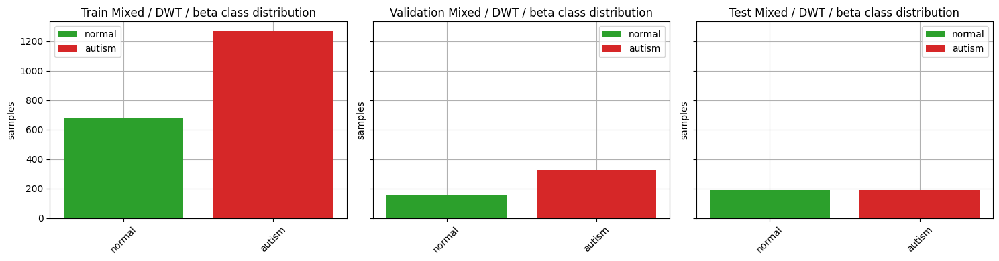

C:\Users\Anna\AppData\Local\Temp\ipykernel_30812\1339573160.py:94: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all Axes decorations.
  fig.tight_layout()


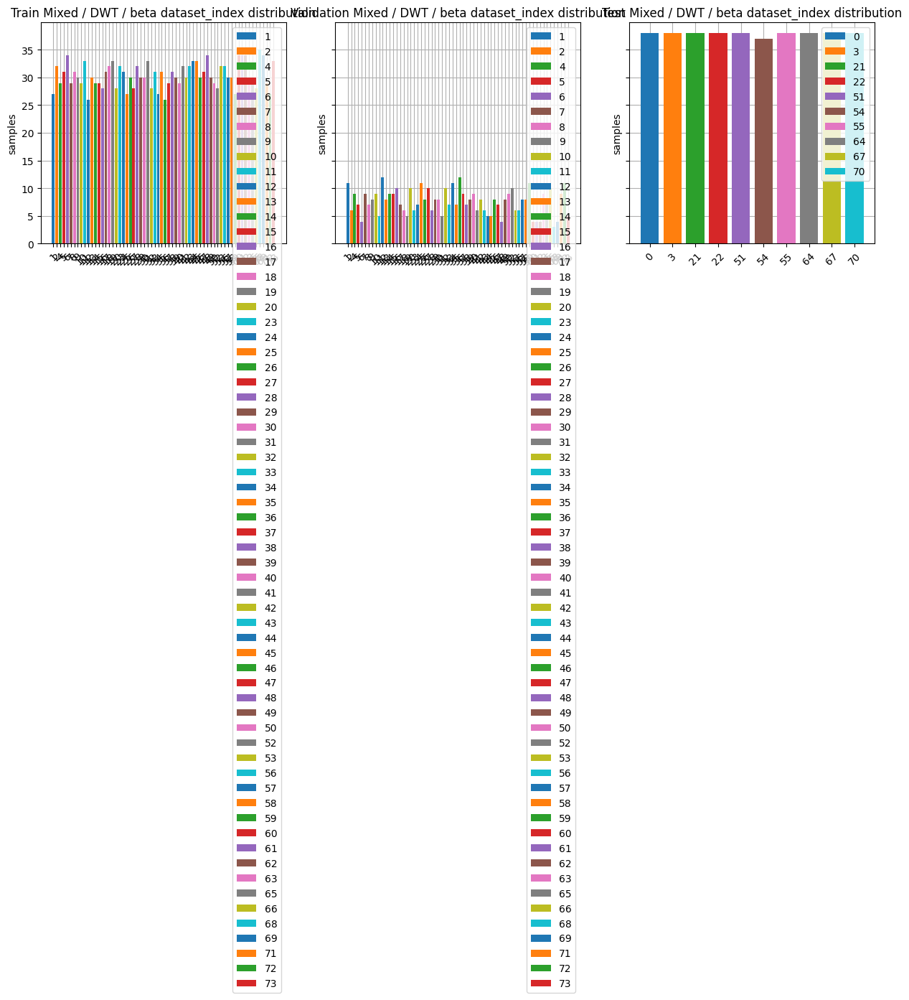


RUNNING EXPERIMENT: dataset=Mixed | filter=DWT | band=beta
Using cached dataset: windows_dataset_beta_dwt
Using cached dataset: windows_dataset_beta_dwt_sheffield
original base datasets kept: 27 / 27
sheffield base datasets kept: 47 / 47
original channels: 19 ['Fp1', 'Fp2', 'F7', 'F3', 'Fz', 'F4', 'F8', 'T7', 'C3', 'Cz', 'C4', 'T8', 'P7', 'P3', 'Pz', 'P4', 'P8', 'O1', 'O2']
sheffield channels: 19 ['Fp1', 'Fp2', 'F7', 'F3', 'Fz', 'F4', 'F8', 'T7', 'C3', 'Cz', 'C4', 'T8', 'P7', 'P3', 'Pz', 'P4', 'P8', 'O1', 'O2']
same channel order: True
same channel set: True
mixed n_base_datasets: 74

Loading matching unfiltered dataset for SNR/MSE comparison...
Using cached dataset: windows_dataset_150
Using cached dataset: windows_dataset_150_sheffield
original base datasets kept: 27 / 27
sheffield base datasets kept: 47 / 47
original channels: 19 ['Fp1', 'Fp2', 'F7', 'F3', 'Fz', 'F4', 'F8', 'T7', 'C3', 'Cz', 'C4', 'T8', 'P7', 'P3', 'Pz', 'P4', 'P8', 'O1', 'O2']
sheffield channels: 19 ['Fp1', 'Fp2',

In [22]:
# Mixed / DWT / beta
mixed_dwt_beta_options = experiment_options(band='beta')

if RUN_ALL_EXPERIMENTS:
    if PLOT_BEFORE_EXPERIMENT:
        plot_results['mixed_dwt_beta'] = plot_experiment_dataset('Mixed', 'DWT', mixed_dwt_beta_options)
    experiment_results['mixed_dwt_beta'] = run_experiment('Mixed', 'DWT', mixed_dwt_beta_options)
else:
    print("Skipped Mixed / DWT / beta. Set RUN_ALL_EXPERIMENTS = True to run this cell.")


### Mixed / DWT / theta



------------------------------------------------------------------------------------------
PLOTTING: Mixed / DWT / theta
------------------------------------------------------------------------------------------
Using cached dataset: windows_dataset_theta_dwt
Using cached dataset: windows_dataset_theta_dwt_sheffield
original base datasets kept: 27 / 27
sheffield base datasets kept: 47 / 47
original channels: 19 ['Fp1', 'Fp2', 'F7', 'F3', 'Fz', 'F4', 'F8', 'T7', 'C3', 'Cz', 'C4', 'T8', 'P7', 'P3', 'Pz', 'P4', 'P8', 'O1', 'O2']
sheffield channels: 19 ['Fp1', 'Fp2', 'F7', 'F3', 'Fz', 'F4', 'F8', 'T7', 'C3', 'Cz', 'C4', 'T8', 'P7', 'P3', 'Pz', 'P4', 'P8', 'O1', 'O2']
same channel order: True
same channel set: True
mixed n_base_datasets: 74
n_channels = 19
input_window_samples = 1000
ch_names = ['Fp1', 'Fp2', 'F7', 'F3', 'Fz', 'F4', 'F8', 'T7', 'C3', 'Cz', 'C4', 'T8', 'P7', 'P3', 'Pz', 'P4', 'P8', 'O1', 'O2']
Loading data for 1 events and 1000 original time points ...


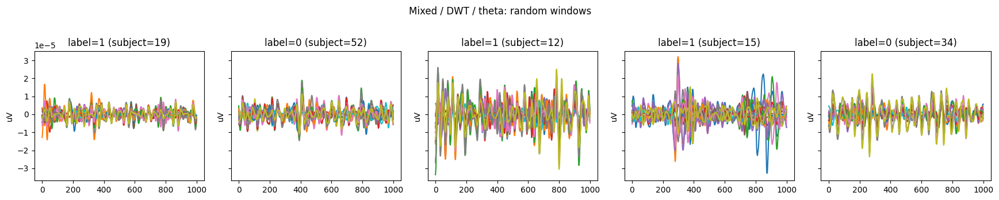

Test split by dataset row indexes: [0, 3, 51, 21, 22, 64, 70, 54, 67, 55]
len(train_pool) = 2432
len(test_set) = 379
len(dataset) = 2811
len(train_set) = 1946
len(validation_set) = 486
len(test_set) = 379
Loading data for 1 events and 1000 original time points ...


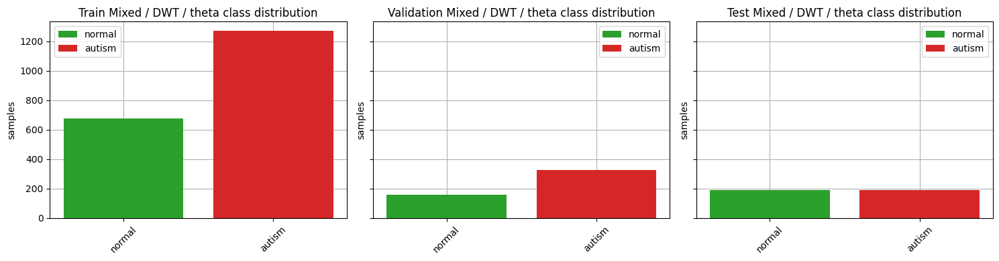

C:\Users\Anna\AppData\Local\Temp\ipykernel_21384\1339573160.py:94: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all Axes decorations.
  fig.tight_layout()


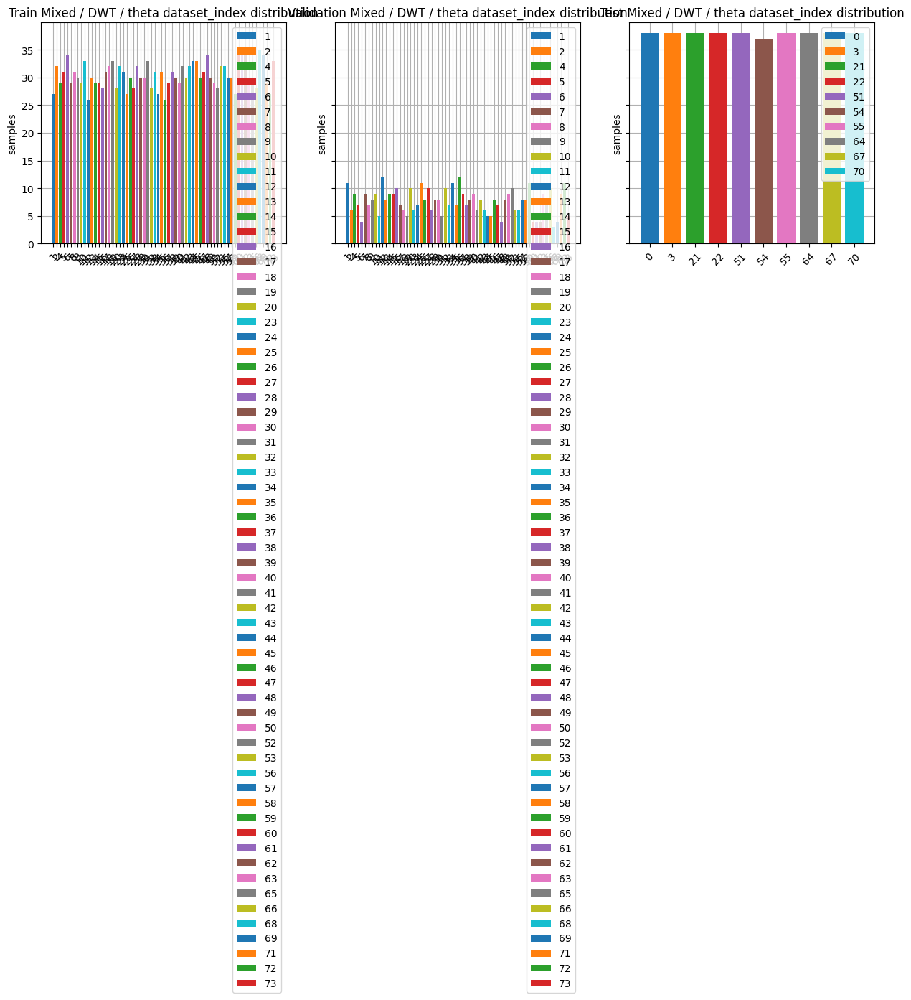


RUNNING EXPERIMENT: dataset=Mixed | filter=DWT | band=theta
Using cached dataset: windows_dataset_theta_dwt
Using cached dataset: windows_dataset_theta_dwt_sheffield
original base datasets kept: 27 / 27
sheffield base datasets kept: 47 / 47
original channels: 19 ['Fp1', 'Fp2', 'F7', 'F3', 'Fz', 'F4', 'F8', 'T7', 'C3', 'Cz', 'C4', 'T8', 'P7', 'P3', 'Pz', 'P4', 'P8', 'O1', 'O2']
sheffield channels: 19 ['Fp1', 'Fp2', 'F7', 'F3', 'Fz', 'F4', 'F8', 'T7', 'C3', 'Cz', 'C4', 'T8', 'P7', 'P3', 'Pz', 'P4', 'P8', 'O1', 'O2']
same channel order: True
same channel set: True
mixed n_base_datasets: 74

Loading matching unfiltered dataset for SNR/MSE comparison...
Using cached dataset: windows_dataset_150
Using cached dataset: windows_dataset_150_sheffield
original base datasets kept: 27 / 27
sheffield base datasets kept: 47 / 47
original channels: 19 ['Fp1', 'Fp2', 'F7', 'F3', 'Fz', 'F4', 'F8', 'T7', 'C3', 'Cz', 'C4', 'T8', 'P7', 'P3', 'Pz', 'P4', 'P8', 'O1', 'O2']
sheffield channels: 19 ['Fp1', 'Fp

In [14]:
# Mixed / DWT / theta
mixed_dwt_theta_options = experiment_options(band='theta')

if RUN_ALL_EXPERIMENTS:
    if PLOT_BEFORE_EXPERIMENT:
        plot_results['mixed_dwt_theta'] = plot_experiment_dataset('Mixed', 'DWT', mixed_dwt_theta_options)
    experiment_results['mixed_dwt_theta'] = run_experiment('Mixed', 'DWT', mixed_dwt_theta_options)
else:
    print("Skipped Mixed / DWT / theta. Set RUN_ALL_EXPERIMENTS = True to run this cell.")


### Mixed / DWT / gamma



------------------------------------------------------------------------------------------
PLOTTING: Mixed / DWT / gamma
------------------------------------------------------------------------------------------
Using cached dataset: windows_dataset_gamma_dwt
Using cached dataset: windows_dataset_gamma_dwt_sheffield
original base datasets kept: 27 / 27
sheffield base datasets kept: 47 / 47
original channels: 19 ['Fp1', 'Fp2', 'F7', 'F3', 'Fz', 'F4', 'F8', 'T7', 'C3', 'Cz', 'C4', 'T8', 'P7', 'P3', 'Pz', 'P4', 'P8', 'O1', 'O2']
sheffield channels: 19 ['Fp1', 'Fp2', 'F7', 'F3', 'Fz', 'F4', 'F8', 'T7', 'C3', 'Cz', 'C4', 'T8', 'P7', 'P3', 'Pz', 'P4', 'P8', 'O1', 'O2']
same channel order: True
same channel set: True
mixed n_base_datasets: 74
n_channels = 19
input_window_samples = 1000
ch_names = ['Fp1', 'Fp2', 'F7', 'F3', 'Fz', 'F4', 'F8', 'T7', 'C3', 'Cz', 'C4', 'T8', 'P7', 'P3', 'Pz', 'P4', 'P8', 'O1', 'O2']
Loading data for 1 events and 1000 original time points ...


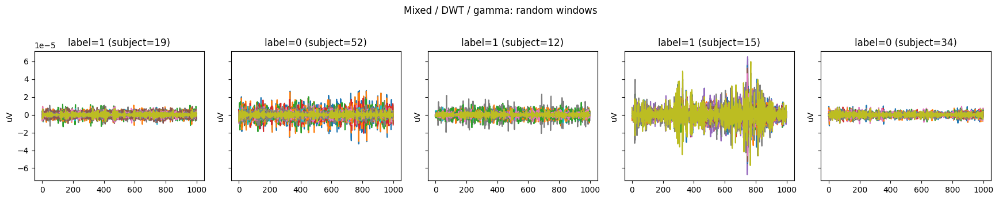

Test split by dataset row indexes: [0, 3, 51, 21, 22, 64, 70, 54, 67, 55]
len(train_pool) = 2432
len(test_set) = 379
len(dataset) = 2811
len(train_set) = 1946
len(validation_set) = 486
len(test_set) = 379
Loading data for 1 events and 1000 original time points ...


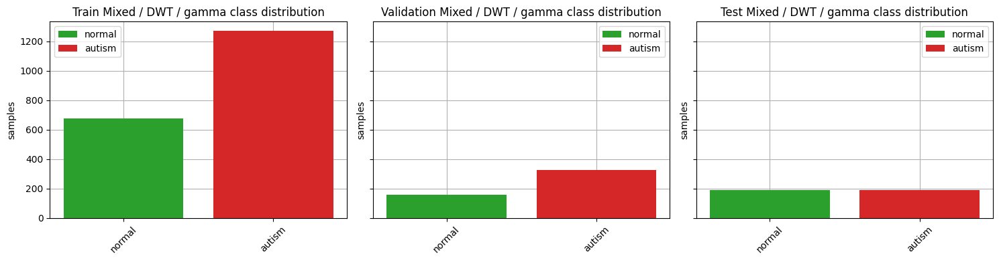

C:\Users\Anna\AppData\Local\Temp\ipykernel_21384\1339573160.py:94: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all Axes decorations.
  fig.tight_layout()


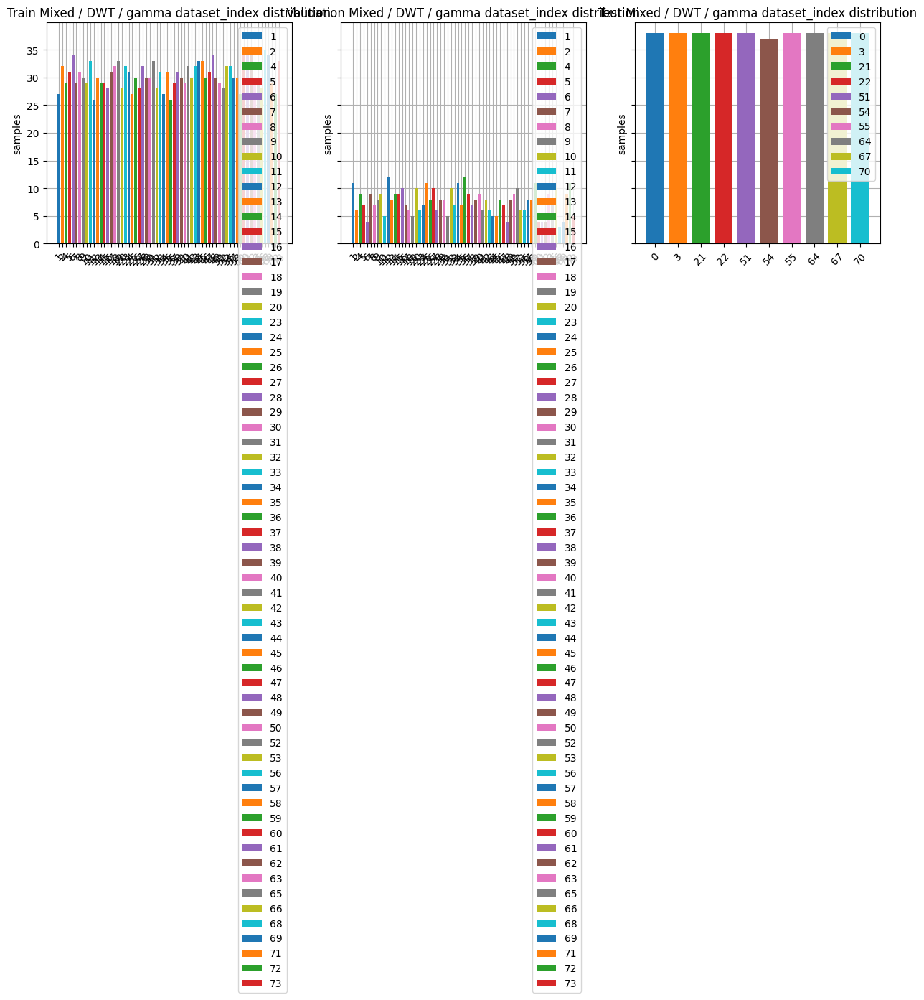


RUNNING EXPERIMENT: dataset=Mixed | filter=DWT | band=gamma
Using cached dataset: windows_dataset_gamma_dwt
Using cached dataset: windows_dataset_gamma_dwt_sheffield
original base datasets kept: 27 / 27
sheffield base datasets kept: 47 / 47
original channels: 19 ['Fp1', 'Fp2', 'F7', 'F3', 'Fz', 'F4', 'F8', 'T7', 'C3', 'Cz', 'C4', 'T8', 'P7', 'P3', 'Pz', 'P4', 'P8', 'O1', 'O2']
sheffield channels: 19 ['Fp1', 'Fp2', 'F7', 'F3', 'Fz', 'F4', 'F8', 'T7', 'C3', 'Cz', 'C4', 'T8', 'P7', 'P3', 'Pz', 'P4', 'P8', 'O1', 'O2']
same channel order: True
same channel set: True
mixed n_base_datasets: 74

Loading matching unfiltered dataset for SNR/MSE comparison...
Using cached dataset: windows_dataset_150
Using cached dataset: windows_dataset_150_sheffield
original base datasets kept: 27 / 27
sheffield base datasets kept: 47 / 47
original channels: 19 ['Fp1', 'Fp2', 'F7', 'F3', 'Fz', 'F4', 'F8', 'T7', 'C3', 'Cz', 'C4', 'T8', 'P7', 'P3', 'Pz', 'P4', 'P8', 'O1', 'O2']
sheffield channels: 19 ['Fp1', 'Fp

In [15]:
# Mixed / DWT / gamma
mixed_dwt_gamma_options = experiment_options(band='gamma')

if RUN_ALL_EXPERIMENTS:
    if PLOT_BEFORE_EXPERIMENT:
        plot_results['mixed_dwt_gamma'] = plot_experiment_dataset('Mixed', 'DWT', mixed_dwt_gamma_options)
    experiment_results['mixed_dwt_gamma'] = run_experiment('Mixed', 'DWT', mixed_dwt_gamma_options)
else:
    print("Skipped Mixed / DWT / gamma. Set RUN_ALL_EXPERIMENTS = True to run this cell.")


### Mixed / DWT / delta



------------------------------------------------------------------------------------------
PLOTTING: Mixed / DWT / delta
------------------------------------------------------------------------------------------
Using cached dataset: windows_dataset_delta_dwt
Using cached dataset: windows_dataset_delta_dwt_sheffield
original base datasets kept: 27 / 27
sheffield base datasets kept: 47 / 47
original channels: 19 ['Fp1', 'Fp2', 'F7', 'F3', 'Fz', 'F4', 'F8', 'T7', 'C3', 'Cz', 'C4', 'T8', 'P7', 'P3', 'Pz', 'P4', 'P8', 'O1', 'O2']
sheffield channels: 19 ['Fp1', 'Fp2', 'F7', 'F3', 'Fz', 'F4', 'F8', 'T7', 'C3', 'Cz', 'C4', 'T8', 'P7', 'P3', 'Pz', 'P4', 'P8', 'O1', 'O2']
same channel order: True
same channel set: True
mixed n_base_datasets: 74
n_channels = 19
input_window_samples = 1000
ch_names = ['Fp1', 'Fp2', 'F7', 'F3', 'Fz', 'F4', 'F8', 'T7', 'C3', 'Cz', 'C4', 'T8', 'P7', 'P3', 'Pz', 'P4', 'P8', 'O1', 'O2']
Loading data for 1 events and 1000 original time points ...


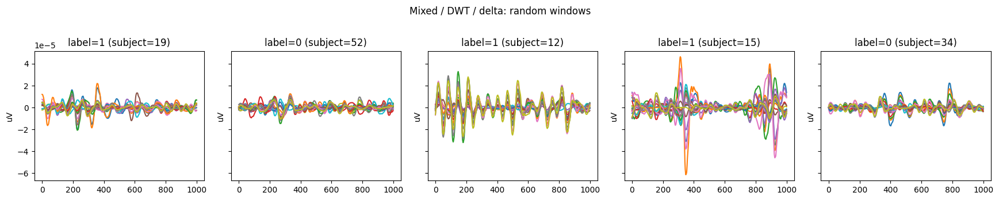

Test split by dataset row indexes: [0, 3, 51, 21, 22, 64, 70, 54, 67, 55]
len(train_pool) = 2432
len(test_set) = 379
len(dataset) = 2811
len(train_set) = 1946
len(validation_set) = 486
len(test_set) = 379
Loading data for 1 events and 1000 original time points ...


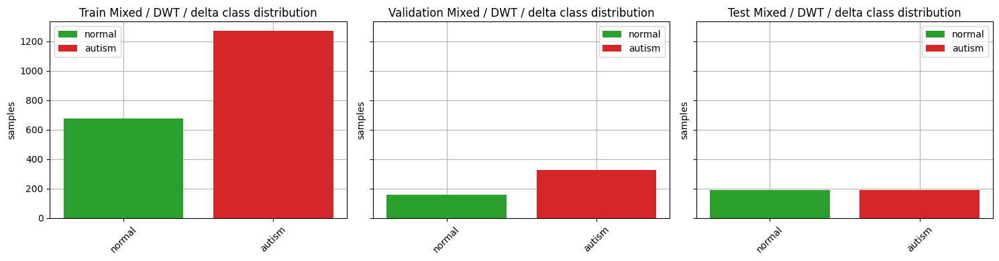

C:\Users\Anna\AppData\Local\Temp\ipykernel_21384\1339573160.py:94: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all Axes decorations.
  fig.tight_layout()


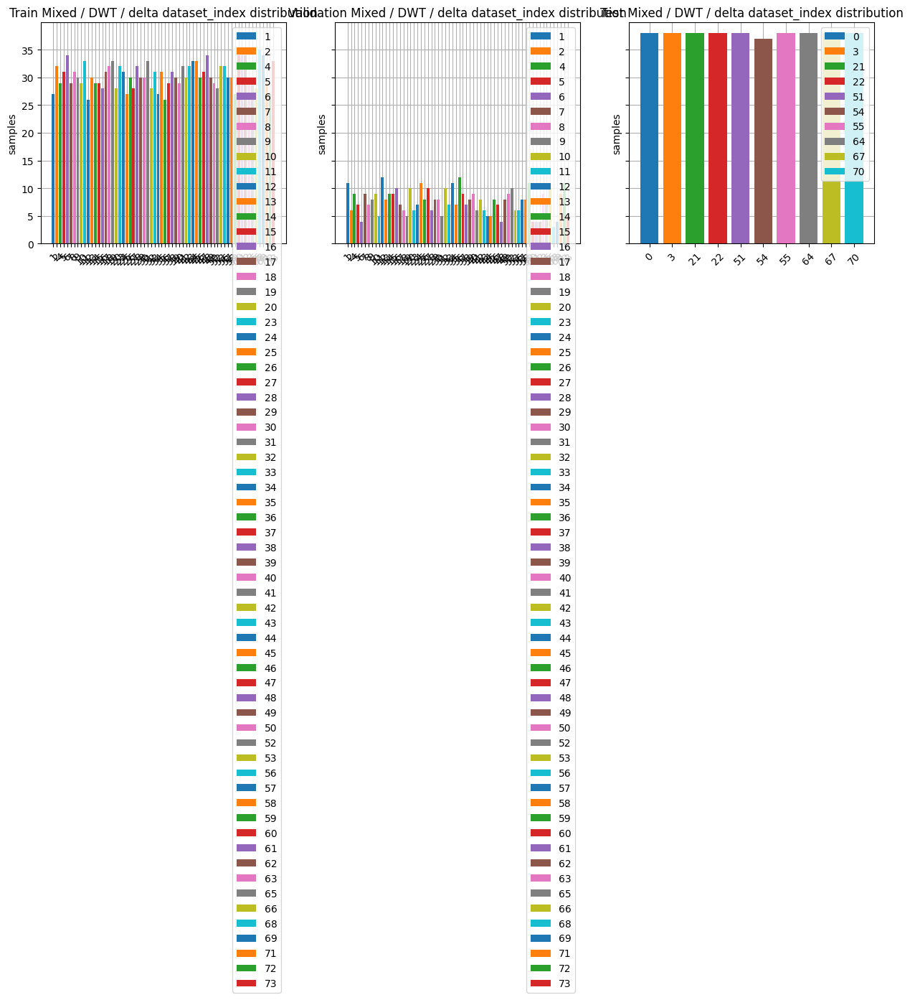


RUNNING EXPERIMENT: dataset=Mixed | filter=DWT | band=delta
Using cached dataset: windows_dataset_delta_dwt
Using cached dataset: windows_dataset_delta_dwt_sheffield
original base datasets kept: 27 / 27
sheffield base datasets kept: 47 / 47
original channels: 19 ['Fp1', 'Fp2', 'F7', 'F3', 'Fz', 'F4', 'F8', 'T7', 'C3', 'Cz', 'C4', 'T8', 'P7', 'P3', 'Pz', 'P4', 'P8', 'O1', 'O2']
sheffield channels: 19 ['Fp1', 'Fp2', 'F7', 'F3', 'Fz', 'F4', 'F8', 'T7', 'C3', 'Cz', 'C4', 'T8', 'P7', 'P3', 'Pz', 'P4', 'P8', 'O1', 'O2']
same channel order: True
same channel set: True
mixed n_base_datasets: 74

Loading matching unfiltered dataset for SNR/MSE comparison...
Using cached dataset: windows_dataset_150
Using cached dataset: windows_dataset_150_sheffield
original base datasets kept: 27 / 27
sheffield base datasets kept: 47 / 47
original channels: 19 ['Fp1', 'Fp2', 'F7', 'F3', 'Fz', 'F4', 'F8', 'T7', 'C3', 'Cz', 'C4', 'T8', 'P7', 'P3', 'Pz', 'P4', 'P8', 'O1', 'O2']
sheffield channels: 19 ['Fp1', 'Fp

In [16]:
# Mixed / DWT / delta
mixed_dwt_delta_options = experiment_options(band='delta')

if RUN_ALL_EXPERIMENTS:
    if PLOT_BEFORE_EXPERIMENT:
        plot_results['mixed_dwt_delta'] = plot_experiment_dataset('Mixed', 'DWT', mixed_dwt_delta_options)
    experiment_results['mixed_dwt_delta'] = run_experiment('Mixed', 'DWT', mixed_dwt_delta_options)
else:
    print("Skipped Mixed / DWT / delta. Set RUN_ALL_EXPERIMENTS = True to run this cell.")


### Mixed / DWT combined bands



------------------------------------------------------------------------------------------
PLOTTING: Mixed / DWT_COMBINED
------------------------------------------------------------------------------------------
Using cached dataset: windows_dataset_dwt_combined
Using cached dataset: windows_dataset_dwt_combined_sheffield
original base datasets kept: 27 / 27
sheffield base datasets kept: 47 / 47
original channels: 19 ['Fp1', 'Fp2', 'F7', 'F3', 'Fz', 'F4', 'F8', 'T7', 'C3', 'Cz', 'C4', 'T8', 'P7', 'P3', 'Pz', 'P4', 'P8', 'O1', 'O2']
sheffield channels: 19 ['Fp1', 'Fp2', 'F7', 'F3', 'Fz', 'F4', 'F8', 'T7', 'C3', 'Cz', 'C4', 'T8', 'P7', 'P3', 'Pz', 'P4', 'P8', 'O1', 'O2']
same channel order: True
same channel set: True
mixed n_base_datasets: 74
n_channels = 19
input_window_samples = 1000
ch_names = ['Fp1', 'Fp2', 'F7', 'F3', 'Fz', 'F4', 'F8', 'T7', 'C3', 'Cz', 'C4', 'T8', 'P7', 'P3', 'Pz', 'P4', 'P8', 'O1', 'O2']
Loading data for 1 events and 1000 original time points ...


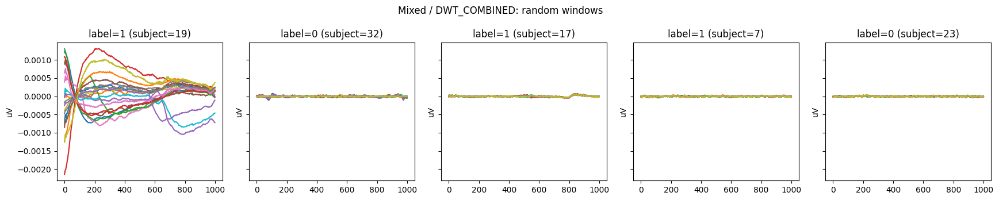

Test split by dataset row indexes: [0, 3, 51, 21, 22, 64, 70, 54, 67, 55]
len(train_pool) = 2426
len(test_set) = 378
len(dataset) = 2804
len(train_set) = 1941
len(validation_set) = 485
len(test_set) = 378
Loading data for 1 events and 1000 original time points ...


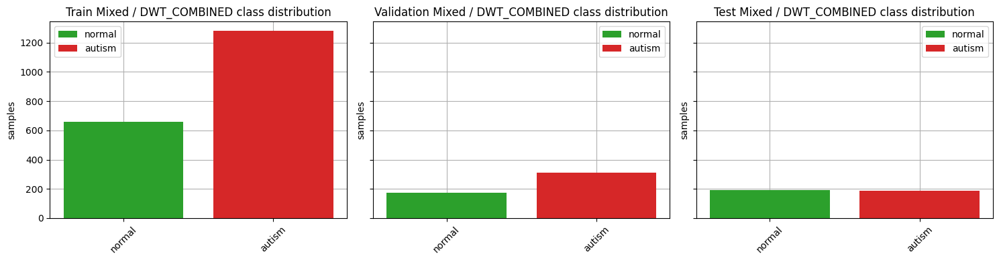

C:\Users\Anna\AppData\Local\Temp\ipykernel_20876\1339573160.py:94: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all Axes decorations.
  fig.tight_layout()


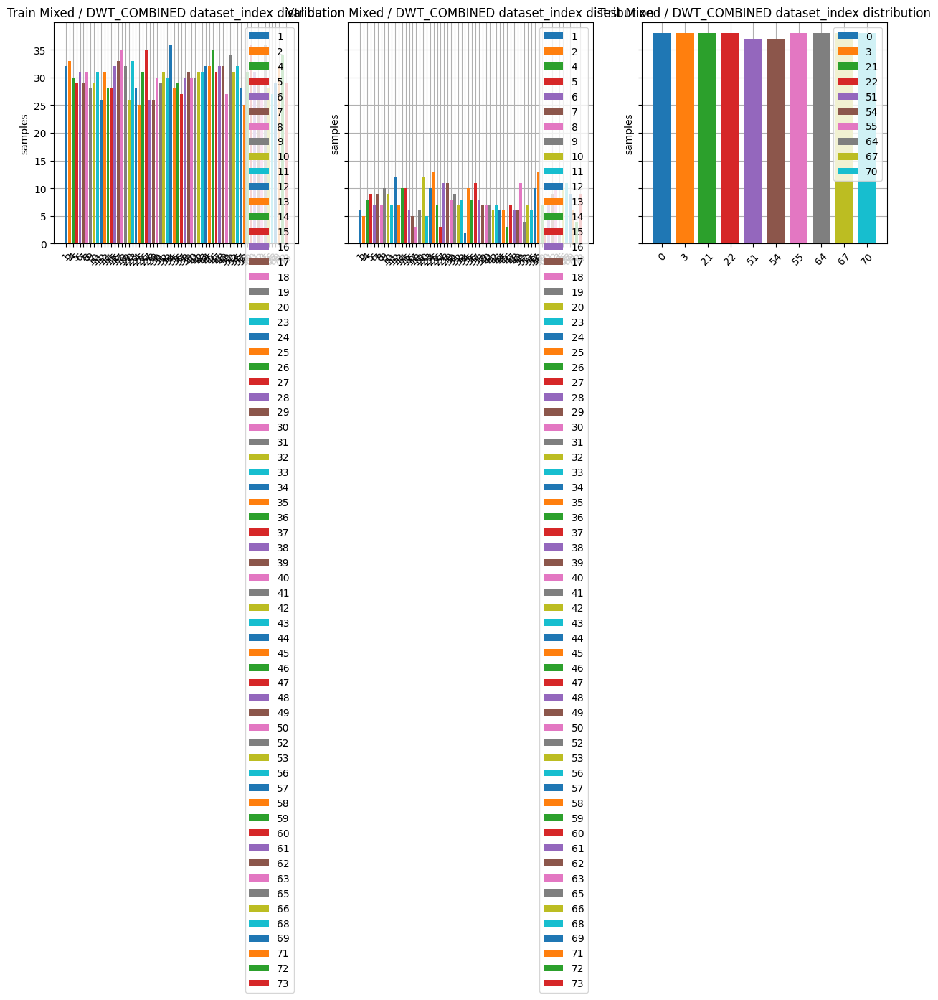


RUNNING EXPERIMENT: dataset=Mixed | filter=DWT_COMBINED | band=None
Using cached dataset: windows_dataset_dwt_combined
Using cached dataset: windows_dataset_dwt_combined_sheffield
original base datasets kept: 27 / 27
sheffield base datasets kept: 47 / 47
original channels: 19 ['Fp1', 'Fp2', 'F7', 'F3', 'Fz', 'F4', 'F8', 'T7', 'C3', 'Cz', 'C4', 'T8', 'P7', 'P3', 'Pz', 'P4', 'P8', 'O1', 'O2']
sheffield channels: 19 ['Fp1', 'Fp2', 'F7', 'F3', 'Fz', 'F4', 'F8', 'T7', 'C3', 'Cz', 'C4', 'T8', 'P7', 'P3', 'Pz', 'P4', 'P8', 'O1', 'O2']
same channel order: True
same channel set: True
mixed n_base_datasets: 74
Test split by dataset row indexes: [0, 3, 51, 21, 22, 64, 70, 54, 67, 55]
len(train_pool) = 2426
len(test_set) = 378
len(dataset) = 2804
unique groups in train_set: [ 1  2  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 23 24 25 26 27
 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47 48 49 50 52
 53 56 57 58 59 60 61 62 63 65 66 68 69 71 72 73]
n_unique_groups: 64
groups per

In [27]:
# Mixed / DWT combined bands
# Constructed on the fly from Original and Sheffield DWT-combined datasets.
mixed_dwt_combined_options = experiment_options(
    compute_quality_metrics=False,
    compare_to_unfiltered=False,
)

if RUN_ALL_EXPERIMENTS:
    if PLOT_BEFORE_EXPERIMENT:
        plot_results['mixed_dwt_combined'] = plot_experiment_dataset(
            'Mixed',
            'DWT_COMBINED',
            mixed_dwt_combined_options,
        )
    experiment_results['mixed_dwt_combined'] = run_experiment(
        'Mixed',
        'DWT_COMBINED',
        mixed_dwt_combined_options,
    )
else:
    print("Skipped Mixed / DWT combined bands. Set RUN_ALL_EXPERIMENTS = True to run this cell.")
